# Smoothed values on line correlation calculations

Correlations between upwelling and form stress, reynolds and EKE.

In [1]:
%matplotlib inline

import cosima_cookbook as cc
import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc
import xarray as xr
import cftime
import glob
import dask
import os
import datetime
import matplotlib.colors as col
import dask.array as dsa
from cosima_cookbook import distributed as ccd
import cartopy.crs as ccrs
import cmocean as cm
from scipy.ndimage.filters import uniform_filter1d
import scipy.stats as ss
from collections import OrderedDict
from matplotlib import gridspec

import logging
logging.captureWarnings(True)
logging.getLogger('py.warnings').setLevel(logging.ERROR)

from dask.distributed import Client
from correlation import Compute_Correlation

import cartopy.feature as cft
land_50m = cft.NaturalEarthFeature('physical', 'land', '50m',
                                   edgecolor='black', facecolor='gray', linewidth=0.5)
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import matplotlib.ticker as mticker
import matplotlib.path as mpath


In [2]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 4
Total threads: 16,Total memory: 64.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:34211,Workers: 4
Dashboard: /proxy/8787/status,Total threads: 16
Started: Just now,Total memory: 64.00 GiB
Comm: tcp://10.6.121.3:43781,Total threads: 4
Dashboard: /proxy/41281/status,Memory: 16.00 GiB
Nanny: tcp://127.0.0.1:41487,


In [3]:
session = cc.database.create_session('/g/data/ik11/databases/cosima_master.db')

### Load important parameters

In [4]:
year = '2170'
expt = '01deg_jra55v13_ryf9091'

start_time= year + '-01-01'
end_time= year + '-12-31'

# reference density value:
rho_0 = 1035.0
g = 9.81

In [5]:
## FULL SO ##
lat_range = slice(-70,-34.99)
lat_range_big =  slice(-70.05,-34.90)
#-0.1,2,3,4,5#
# lat_range = slice(-60,-34.99)
# lat_range_big = slice(-60.05,-34.90)
# #-0.6,7#
# lat_range = slice(-60,-39.98)
# lat_range_big = slice(-60.05,-39.90)
# #-0.8,-0.9,-1.0#
# lat_range = slice(-62.91,-45)
# lat_range_big = slice(-62.96,-44.90)
#-1.1,1.2#
# lat_range = slice(-64.99,-47)
# lat_range_big = slice(-65.02,-46.93)
#-1.3,1.4,-1.5#
# lat_range = slice(-70,-47)
# lat_range_big = slice(-70.05,-46.93)

In [6]:
%%time

yt_ocean = cc.querying.getvar(expt,'yt_ocean',session,n=1)
yt_ocean = yt_ocean.sel(yt_ocean=lat_range)
xt_ocean = cc.querying.getvar(expt,'xt_ocean',session,n=1)


CPU times: user 4.22 s, sys: 1.12 s, total: 5.33 s
Wall time: 27.5 s


In [7]:
%%time

dyt = cc.querying.getvar(expt,'dyt',session,ncfile = 'ocean_grid.nc',n=1)
dyt = dyt.sel(yt_ocean = lat_range)
dxt = cc.querying.getvar(expt,'dxt',session,ncfile = 'ocean_grid.nc',n=1)
dxt = dxt.sel(yt_ocean = lat_range)


CPU times: user 1.27 s, sys: 0 ns, total: 1.27 s
Wall time: 16.6 s


In [9]:
ht = cc.querying.getvar(expt,'ht', session,n=1)
ht = ht.sel(yt_ocean = slice(-90,-34.99))

### Load MKE, EKE, Form stress, Reynolds stress

In [10]:
save_dir = '/g/data/x77/cy8964/Post_Process/New_SO/'
MKE = xr.open_dataset(save_dir+'MKE_10yr.nc').MKE
EKE = xr.open_dataset(save_dir+'EKE_10yr.nc').EKE
Reynolds = xr.open_dataset(save_dir+'Reynolds_10yr_fulldepth.nc').Reynolds
Form_stress = xr.open_dataset(save_dir+'Form_stress_10yr_fulldepth.nc').Form_stress
h_bar = xr.open_dataset(save_dir+'h_bar_10yr.nc').h_bar

In [13]:
def find_arrow_dxn(lon,lat):
    N = 20

    smooth_lon = uniform_filter1d(lon, size=N)
    smooth_lat = uniform_filter1d(lat, size=N)
    
    smooth_lat_i = np.roll(smooth_lat,1)
    smooth_lon_i = np.roll(smooth_lon,1)
    
    Dy = smooth_lat_i-smooth_lat
    Dx = smooth_lon_i-smooth_lon
    
    dx = Dy/np.sqrt(Dy**2+Dx**2)
    dy = -Dx/np.sqrt(Dy**2+Dx**2)
    return dx, dy

In [14]:
def find_lower_upper_indices(hotspot, j_contour):
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
        prefix = 400
    else:
        suffix = ''
        prefix = 0
    vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lat_along_contour
    lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lon_along_contour
    
    if hotspot =='MR' and j_contour == 'A' or 'B' or 'J' or 'L' or 'N':
        lon_along_contour[1]=-279.95
    for i in np.arange(prefix,len(lon_along_contour)):
        if lon_along_contour[i]>hotspot_dict[hotspot]['lower_lon']:
            lower_index = i
            break
    for i in np.arange(prefix,len(lon_along_contour)):
        if lon_along_contour[i]<hotspot_dict[hotspot]['upper_lon']:
            upper_index = i
        elif lon_along_contour[i]>hotspot_dict[hotspot]['upper_lon']:
            break

    return lower_index, upper_index



In [15]:
def distance_save(j_contour):
    lat_range = contour_dict[j_contour]['lat_range']
    SSH = contour_dict[j_contour]['SSH']
    dxu = cc.querying.getvar(expt,'dxu',session,ncfile = 'ocean_grid.nc',n=1)
    dxu = dxu.sel(yu_ocean = lat_range)
    dyt = cc.querying.getvar(expt,'dyt',session,ncfile = 'ocean_grid.nc',n=1)
    dyt = dyt.sel(yt_ocean = lat_range)
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
    else:
        suffix = ''
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lat_along_contour
    num_points = len(lat_along_contour)
    lat_t = cc.querying.getvar(expt,'geolat_t',session,ncfile = 'ocean_grid.nc',n=1)
    lat_t = lat_t.sel(yt_ocean = lat_range)
    lon_t = cc.querying.getvar(expt,'geolon_t',session,ncfile = 'ocean_grid.nc',n=1)
    lon_t = lon_t.sel(yt_ocean = lat_range)
    
    outfile = '/g/data/x77/cy8964/Post_Process/SO_slope_contour_'+str(SSH)+'m_SSH.npz'
    data = np.load(outfile)

        # if there is a bend in the contour, add the distance using length of diagonal, not sum of
    # 2 edges, to be more representative.
    mask_y_transport_numbered = data['mask_y_transport_numbered']
    mask_x_transport_numbered = data['mask_x_transport_numbered']
    contour_masked_above = data['contour_masked_above']

    distance_along_contour = np.zeros((num_points))
    x_indices = np.sort(mask_x_transport_numbered[mask_x_transport_numbered>0])
    y_indices = np.sort(mask_y_transport_numbered[mask_y_transport_numbered>0])
    skip = False
    for count in range(1,num_points):
        if skip == True:
            skip = False
            continue
        if count in y_indices:
            if count + 1 in y_indices:
                # note dxu and dyt do no vary in x:
                jj = np.where(mask_y_transport_numbered==count)[0]
                distance_along_contour[count-1] = (dxu[jj,990])[0]
            else:
                jj0 = np.where(mask_y_transport_numbered==count)[0]
                jj1 = np.where(mask_x_transport_numbered==count+1)[0]
                diagonal_distance = 0.5*np.sqrt((dxu[jj0,990])[0]**2+\
                    (dyt[jj1,990])[0]**2)
                distance_along_contour[count-1] = diagonal_distance
                distance_along_contour[count] = diagonal_distance
                # skip to next count:
                skip = True
        # count in x_indices:
        else:
            if count + 1 in x_indices:
                jj = np.where(mask_x_transport_numbered==count)[0]
                distance_along_contour[count-1] = (dyt[jj,990])[0]
            else:
                jj0 = np.where(mask_x_transport_numbered==count)[0]
                jj1 = np.where(mask_y_transport_numbered==count+1)[0]
                diagonal_distance = 0.5*np.sqrt((dyt[jj0,990])[0]**2+\
                    (dxu[jj1,990])[0]**2)
                distance_along_contour[count-1] = diagonal_distance
                distance_along_contour[count] = diagonal_distance
                # skip to next count:
                skip = True
    # fix last value:
    if distance_along_contour[-1] == 0:
        count = count + 1
        if count in y_indices:
            jj = np.where(mask_y_transport_numbered==count)[0]
            distance_along_contour[-1] = (dxu[jj,990])[0]
        else:
            jj = np.where(mask_x_transport_numbered==count)[0]
            distance_along_contour[-1] = (dyt[jj,990])[0]

    # units are 10^3 km:
    distance_along_contour = np.cumsum(distance_along_contour)/1e3/1e3        
    return distance_along_contour

In [16]:
def distance(hotspot,j_contour):
    distance_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_distance_along_contour.nc').distance
    if hotspot == 'KP':
        lower_index1, upper_index1 = find_lower_upper_indices('KP1', j_contour)
        lower_index2, upper_index2 = find_lower_upper_indices('KP2', j_contour)
        dist80 = distance_along_contour[upper_index1]-distance_along_contour[lower_index1]
        distance_along_contour = np.append(distance_along_contour[lower_index1:upper_index1]-distance_along_contour[lower_index1],
                                           distance_along_contour[lower_index2:upper_index2]+dist80)
    else:
        lower_index, upper_index = find_lower_upper_indices(hotspot, j_contour)
        distance_along_contour = distance_along_contour[lower_index:upper_index]-distance_along_contour[lower_index]
        
    return distance_along_contour

In [17]:
contour_dict = OrderedDict([
    ('A',  {'SSH':-0.1,'lat_range':slice(-60,-34.99),'lat_range_big':slice(-60.05,-34.90),'slope_path':'SO_slope_contour_-0.1m_SSH.npz','shifted':False}),
    ('B',  {'SSH':-0.2,'lat_range':slice(-60,-34.99),'lat_range_big':slice(-60.05,-34.90),'slope_path':'SO_slope_contour_-0.2m_SSH.npz','shifted':False}),
    ('C',  {'SSH':-0.3,'lat_range':slice(-60,-34.99),'lat_range_big':slice(-60.05,-34.90),'slope_path':'SO_slope_contour_-0.3m_SSH.npz','shifted':False}),
    ('D',  {'SSH':-0.4,'lat_range':slice(-60,-34.99),'lat_range_big':slice(-60.05,-34.90),'slope_path':'SO_slope_contour_-0.4m_SSH.npz','shifted':False}),
    ('E',  {'SSH':-0.5,'lat_range':slice(-60,-34.99),'lat_range_big':slice(-60.05,-34.90),'slope_path':'SO_slope_contour_-0.5m_SSH.npz','shifted':False}),
    ('F',  {'SSH':-0.6, 'lat_range':slice(-60,-39.98),'lat_range_big':slice(-60.05,-39.90),'slope_path':'SO_slope_contour_-0.6m_SSH.npz','shifted':False}),
    ('G',  {'SSH':-0.7, 'lat_range':slice(-60,-39.98),'lat_range_big':slice(-60.05,-39.90),'slope_path':'SO_slope_contour_-0.7m_SSH.npz','shifted':False}),
    ('H',  {'SSH':-0.8, 'lat_range':slice(-62.91,-45), 'lat_range_big':slice(-62.96,-44.90),'slope_path':'SO_slope_contour_-0.8m_SSH.npz','shifted':False}),
    ('I',  {'SSH':-0.9, 'lat_range':slice(-62.91,-45), 'lat_range_big':slice(-62.96,-44.90),'slope_path':'SO_slope_contour_-0.9m_SSH.npz','shifted':False}),
    ('J',  {'SSH':-1.0, 'lat_range':slice(-62.91,-45), 'lat_range_big':slice(-62.96,-44.90),'slope_path':'SO_slope_contour_-1.0m_SSH.npz','shifted':False}),
    ('K',  {'SSH':-1.1, 'lat_range':slice(-64.99,-47), 'lat_range_big':slice(-65.02,-46.93),'slope_path':'SO_slope_contour_-1.1m_SSH.npz','shifted':False}),
    ('L',  {'SSH':-1.2, 'lat_range':slice(-64.99,-47), 'lat_range_big':slice(-65.02,-46.93),'slope_path':'SO_slope_contour_-1.2m_SSH.npz','shifted':False}),
    ('M',  {'SSH':-1.3, 'lat_range':slice(-70,-47), 'lat_range_big':slice(-70.05,-46.93),'slope_path':'SO_slope_contour_-1.3m_SSH.npz','shifted':False}),
    ('N',  {'SSH':-1.4, 'lat_range':slice(-70,-47), 'lat_range_big':slice(-70.05,-46.93),'slope_path':'SO_slope_contour_-1.4m_SSH.npz','shifted':False}),
    ('O',  {'SSH':-1.5, 'lat_range':slice(-70,-47), 'lat_range_big':slice(-70.05,-46.93),'slope_path':'SO_slope_contour_-1.5m_SSH.npz','shifted':True}),
    ('P',  {'SSH':-0.15,'lat_range':slice(-60,-34.99),'lat_range_big':slice(-60.05,-34.90),'slope_path':'SO_slope_contour_-0.15m_SSH.npz','shifted':False}),
    ('Q',  {'SSH':-0.25,'lat_range':slice(-60,-34.99),'lat_range_big':slice(-60.05,-34.90),'slope_path':'SO_slope_contour_-0.25m_SSH.npz','shifted':False}),
    ('R',  {'SSH':-0.35,'lat_range':slice(-60,-34.99),'lat_range_big':slice(-60.05,-34.90),'slope_path':'SO_slope_contour_-0.35m_SSH.npz','shifted':False}),
    ('S',  {'SSH':-0.45,'lat_range':slice(-60,-34.99),'lat_range_big':slice(-60.05,-34.90),'slope_path':'SO_slope_contour_-0.45m_SSH.npz','shifted':False}),
    ('T',  {'SSH':-0.55,'lat_range':slice(-60,-34.99),'lat_range_big':slice(-60.05,-34.90),'slope_path':'SO_slope_contour_-0.55m_SSH.npz','shifted':False}),
    ('U',  {'SSH':-0.65, 'lat_range':slice(-60,-39.98),'lat_range_big':slice(-60.05,-39.90),'slope_path':'SO_slope_contour_-0.65m_SSH.npz','shifted':False}),
    ('V',  {'SSH':-0.75, 'lat_range':slice(-61,-39.98),'lat_range_big':slice(-61.05,-39.90),'slope_path':'SO_slope_contour_-0.75m_SSH.npz','shifted':False}),
    ('W',  {'SSH':-0.85,'lat_range':slice(-62.91,-45), 'lat_range_big':slice(-62.96,-44.90),'slope_path':'SO_slope_contour_-0.85m_SSH.npz','shifted':False}),
    ('X',  {'SSH':-0.95, 'lat_range':slice(-62.91,-45), 'lat_range_big':slice(-62.96,-44.90),'slope_path':'SO_slope_contour_-0.95m_SSH.npz','shifted':False}),
    ('Y',  {'SSH':-1.05, 'lat_range':slice(-62.91,-45), 'lat_range_big':slice(-62.96,-44.90),'slope_path':'SO_slope_contour_-1.05m_SSH.npz','shifted':False}),
    ('Z',  {'SSH':-1.15, 'lat_range':slice(-64.99,-47), 'lat_range_big':slice(-65.02,-46.93),'slope_path':'SO_slope_contour_-1.15m_SSH.npz','shifted':False}),
    ('Z1',  {'SSH':-1.25, 'lat_range':slice(-70,-47), 'lat_range_big':slice(-70.05,-46.93),'slope_path':'SO_slope_contour_-1.25m_SSH.npz','shifted':False}),
    ('Z2',  {'SSH':-1.35, 'lat_range':slice(-70,-47), 'lat_range_big':slice(-70.05,-46.93),'slope_path':'SO_slope_contour_-1.35m_SSH.npz','shifted':False}),
    ('Z3',  {'SSH':-1.45, 'lat_range':slice(-70,-47), 'lat_range_big':slice(-70.05,-46.93),'slope_path':'SO_slope_contour_-1.45m_SSH.npz','shifted':True}),
    ('Z4',  {'SSH':-1.55, 'lat_range':slice(-70,-47), 'lat_range_big':slice(-70.05,-46.93),'slope_path':'SO_slope_contour_-1.55m_SSH_A.npz','shifted':True}),
    ('Z5',  {'SSH':-1.55, 'lat_range':slice(-70,-47), 'lat_range_big':slice(-70.05,-46.93),'slope_path':'SO_slope_contour_-1.55m_SSH_B.npz','shifted':True}),
    ('Z6',  {'SSH':-1.6, 'lat_range':slice(-70,-47), 'lat_range_big':slice(-70.05,-46.93),'slope_path':'SO_slope_contour_-1.6m_SSH_A.npz','shifted':True}),
    ('Z7',  {'SSH':-1.6, 'lat_range':slice(-70,-47), 'lat_range_big':slice(-70.05,-46.93),'slope_path':'SO_slope_contour_-1.6m_SSH_B.npz','shifted':True}),
    ('Z8',  {'SSH':-1.65, 'lat_range':slice(-70,-47), 'lat_range_big':slice(-70.05,-46.93),'slope_path':'SO_slope_contour_-1.65m_SSH_A.npz','shifted':True}),
    ('Z9',  {'SSH':-1.65, 'lat_range':slice(-70,-47), 'lat_range_big':slice(-70.05,-46.93),'slope_path':'SO_slope_contour_-1.65m_SSH_B.npz','shifted':True}),
])

# arrow plot

In [85]:
plt.rc('text', usetex=True)
plt.rcParams.update({'font.size': 13})


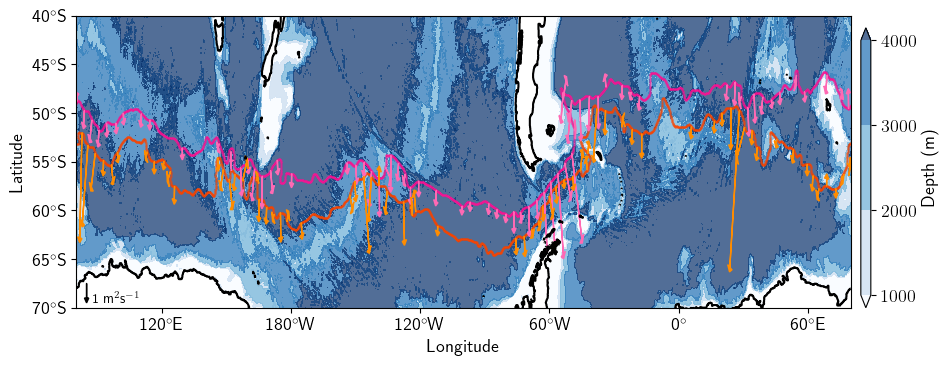

In [28]:
rhoslice = slice(1032.2,1032.5)
fig = plt.figure(figsize = (10,4))
#ax = plt.axes(projection=ccrs.PlateCarree())
#ax.coastlines()
#ax.set_xticks(np.arange(-280,0,80), crs=ccrs.PlateCarree())
#ax.set_yticks(np.arange(-70,-35,5), crs=ccrs.PlateCarree())
p1 = ht.plot.contourf(levels = [1000,2000,3000,4000], cmap = 'Blues', alpha = 0.7, add_colorbar = False)

for j in np.arange(29):
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][j]
    SSH = contour_dict[j_contour]['SSH']
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
        prefix = 400
    else:
        suffix = ''
        prefix = 0
    if j_contour == 'L':
        vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
        isopycnal_bin_contour = vh_eddy*0+vh_eddy.isopycnal_bins
        lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lat_along_contour
        lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lon_along_contour
        segment_length = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_segment_length'+suffix+'.nc').segment_length
        bottom_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_bottom_density_cutoffs.nc').bottom_cutoff.sel(hotspot = 'total')
        top_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_top_density_cutoffs.nc').top_cutoff.sel(hotspot = 'total')
        # mask out water that touches surface or bottom on average
        SSH = contour_dict[j_contour]['SSH']
#         if SSH > -0.45:
#             print('SSH too big!!')
#         rhoslice = slice(top_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0],bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0])
#         print(rhoslice)

        N=10

        eddy_notcumsum = (vh_eddy.sel(isopycnal_bins=rhoslice).sum('isopycnal_bins')/segment_length).fillna(0)
        y = uniform_filter1d(eddy_notcumsum, size=N)

        dx, dy = find_arrow_dxn(lon_along_contour,lat_along_contour)
        for i in np.arange(10,len(lon_along_contour),50):
            if np.abs(y[i]) >0.2:

                plt.arrow(lon_along_contour[i],lat_along_contour[i],y[i]*dx[i]*2,y[i]*dy[i]*2,head_length = 0.5,head_width = 2,length_includes_head=False, color = 'darkorange')#,transform=ccrs.PlateCarree())#, head_length = 0.1,length_includes_head=True)

    #sc = ax.scatter(lon_along_contour,lat_along_contour, s=0.1, alpha = 0.4, label = 'SSH '+str(SSH)+' m', c = -y , cmap = cm.cm.ice_r, vmin = -100, vmax = 40000,transform=ccrs.PlateCarree())
        sc = plt.scatter(lon_along_contour,lat_along_contour, s=0.1, alpha = 0.5, color = 'orangered')
    if j_contour == 'H':
        vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
        lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lat_along_contour
        lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lon_along_contour

        N=10
        bottom_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_bottom_density_cutoffs.nc').bottom_cutoff.sel(hotspot = 'total')
        top_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_top_density_cutoffs.nc').top_cutoff.sel(hotspot = 'total')
        # mask out water that touches surface or bottom on average
        SSH = contour_dict[j_contour]['SSH']
#         if SSH > -0.45:
#             print('SSH too big!!')
#         rhoslice = slice(top_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0],bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0])
#         print(rhoslice)
        segment_length = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_segment_length'+suffix+'.nc').segment_length

        N=10

        eddy_notcumsum = (vh_eddy.sel(isopycnal_bins=rhoslice).sum('isopycnal_bins')/segment_length).fillna(0)
        y = uniform_filter1d(eddy_notcumsum, size=N)

        dx, dy = find_arrow_dxn(lon_along_contour,lat_along_contour)
        for i in np.arange(10,len(lon_along_contour),50):
            if np.abs(y[i]) >0.2:
                plt.arrow(lon_along_contour[i],lat_along_contour[i],y[i]*dx[i]*2,y[i]*dy[i]*2,head_length = 0.5,head_width = 2,length_includes_head=False, color = 'hotpink')#,transform=ccrs.PlateCarree())#, head_length = 0.1,length_includes_head=True)

    #sc = ax.scatter(lon_along_contour,lat_along_contour, s=0.1, alpha = 0.4, label = 'SSH '+str(SSH)+' m', c = -y , cmap = cm.cm.ice_r, vmin = -100, vmax = 40000,transform=ccrs.PlateCarree())
        sc = plt.scatter(lon_along_contour,lat_along_contour, s=0.1, alpha = 0.5, color = 'deeppink')
# ax_cb = plt.axes([0.95, 0.35, 0.01, 0.3])
# cb = plt.colorbar(sc,cax=ax_cb, orientation='vertical')
# cb.ax.set_ylabel('Southward eddy transport (m$^2$s$^{-1}$)', fontsize = 18);
# cb.ax.tick_params(labelsize=14)
plt.arrow(-275,-67.5,0,-2,head_length = 0.5,head_width = 2,length_includes_head=True, color = 'k')
plt.text(-272,-69.5,'1 m$^2$s$^{-1}$', color = 'k', fontsize = 10)
mask = (ht*0+1).fillna(0)
mask.plot.contour(levels = [0.5],colors = 'k')

X = np.arange(-240,100,60)
plt.xticks(X, ('120$^\circ$E','180$^\circ$W','120$^\circ$W','60$^\circ$W','0$^\circ$','60$^\circ$E'));
Y = np.arange(-70,-35,5)
plt.yticks(Y, ('70$^\circ$S','65$^\circ$S','60$^\circ$S','55$^\circ$S','50$^\circ$S','45$^\circ$S','40$^\circ$S'));
plt.ylabel('Latitude')
plt.xlabel('Longitude')
plt.ylim(-70,-40)
plt.xlim(-280,80)
fig.subplots_adjust(bottom = 0.15, right = 0.9)

cbar_ax = fig.add_axes([0.91, 0.15, 0.01, 0.7])
plt.colorbar(p1, cax=cbar_ax)
cbar_ax.set_ylabel('Depth (m)')

# plt.annotate('Kerguelen \n Plateau', xy=(0.08, 0.70), xytext=(0.08, 0.8), xycoords='axes fraction', 
#             fontsize=13, ha='center', va='bottom',
#             #bbox=dict(boxstyle='square', fc='white'),
#             arrowprops=dict(arrowstyle='-[, widthB=2.0, lengthB=1', lw=2.0, color = 'grey'))
# plt.annotate('Maquarie \n Ridge', xy=(0.27, 0.70), xytext=(0.27, 0.8), xycoords='axes fraction', 
#             fontsize=13, ha='center', va='bottom',
#             #bbox=dict(boxstyle='square', fc='white'),
#             arrowprops=dict(arrowstyle='-[, widthB=2.5, lengthB=1', lw=2.0, color = 'grey'))
# plt.annotate('Pacific-\n Antartic \n Ridge', xy=(0.40, 0.70), xytext=(0.4, 0.8), xycoords='axes fraction', 
#             fontsize=13, ha='center', va='bottom',
#             #bbox=dict(boxstyle='square', fc='white'),
#             arrowprops=dict(arrowstyle='-[, widthB=2.0, lengthB=1', lw=2.0, color = 'grey'))
# plt.annotate('Drake \n Passage', xy=(0.6, 0.70), xytext=(0.6, 0.8), xycoords='axes fraction', 
#             fontsize=13, ha='center', va='bottom',
#             #bbox=dict(boxstyle='square', fc='white'),
#             arrowprops=dict(arrowstyle='-[, widthB=3.5, lengthB=1', lw=2.0, color = 'grey'))
# plt.annotate('Southwest \n Indian Ridge', xy=(0.8, 0.70), xytext=(0.8, 0.8), xycoords='axes fraction', 
#             fontsize=13, ha='center', va='bottom',
#             #bbox=dict(boxstyle='square', fc='white'),
#             arrowprops=dict(arrowstyle='-[, widthB=2, lengthB=1', lw=2.0, color = 'grey'))
fig.savefig('upwelling_arrows.png',dpi = 400)

limit 45-65S???

# cumulative sum plot

In [74]:
def get_eddymeanresidual(j_contour):
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
        prefix = 400
    else:
        suffix = ''
        prefix = 0
    save_dir = '/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_'

    vh_0 = xr.open_dataset(save_dir+'vol_trans_across_contour_binned.nc')
    vh_0 = vh_0.vol_trans_across_contour_binned
    vh_0 = vh_0.load()

    h_0 = xr.open_dataset(save_dir+'dzu_across_contour_binned.nc')
    h_0 = h_0.dzu_across_contour_binned
    h_0 = h_0.load()

    v_0 = vh_0/h_0
    v_0 = v_0.where(v_0!=np.inf).where(v_0 !=-np.inf).fillna(0)


    v = v_0
    h = h_0
    vh = vh_0

    v_bar = v.mean('time')
    v_bar = v_bar.where(v_bar!=np.inf).where(v_bar !=-np.inf).fillna(0)
    v_bar.load()
    h_bar = h.mean('time')
    h_bar = h_bar.where(v_bar!=np.inf).where(v_bar !=-np.inf).fillna(0)
    h_bar.load()

    vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+'.nc').vh_eddy
    vh_bar = vh.mean('time')
    vh_mean = v_bar*h_bar
    return vh_eddy, vh_bar, vh_mean

In [75]:
hotspot_dict = OrderedDict([
    ('PAR',  {'lower_lon':-155,'upper_lon':-135}),
    ('SWIR',  {'lower_lon':20,'upper_lon':35}),
    ('DP',  {'lower_lon':-65,'upper_lon':-30}),
    ('MR',  {'lower_lon':-215,'upper_lon':-200}),
    ('KP1',  {'lower_lon':79.5,'upper_lon':80}),
    ('KP2',{'lower_lon':-280,'upper_lon':-265})])#-260


In [76]:
def get_cumsums_and_diagnostics(vh_eddy,vh_bar,vh_mean,j_contour):
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
        prefix = 400
    else:
        suffix = ''
        prefix = 0
    save_dir = '/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_'
 
    distance = xr.open_dataset(save_dir+'distance_along_contour.nc').distance
#     isopycnal_bin_contour = vh_eddy*0+vh_eddy.isopycnal_bins
#     top_rho1_max_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').top_rho1_max_contour
#     bottom_rho1_min_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').bottom_rho1_min_contour
#     vh_eddy= vh_eddy.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
#     vh_bar= vh_bar.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
#     vh_mean= vh_mean.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
    bottom_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_bottom_density_cutoffs.nc').bottom_cutoff.sel(hotspot = 'total')
    top_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_top_density_cutoffs.nc').top_cutoff.sel(hotspot = 'total')
    # mask out water that touches surface or bottom on average
    SSH = contour_dict[j_contour]['SSH']
#     if SSH > -0.45:
#         print('SSH too big!!')
#     rhoslice = slice(top_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0],bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0])
    rhoslice = slice(1032.2,1032.5)
    print(rhoslice)

    total = vh_bar.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins').cumsum('contour_index')
    mean = vh_mean.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins').cumsum('contour_index')
    eddy = vh_eddy.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins').cumsum('contour_index')

    #10 degrees bigger on either side
    hotspot_dict = OrderedDict([
    ('PAR',  {'lower_lon':-155,'upper_lon':-135}),
    ('SWIR',  {'lower_lon':20,'upper_lon':35}),
    ('DP',  {'lower_lon':-65,'upper_lon':-30}),
    ('MR',  {'lower_lon':-215,'upper_lon':-200}),
    ('KP1',  {'lower_lon':79.5,'upper_lon':80}),
    ('KP2',{'lower_lon':-280,'upper_lon':-265})])#-260

    eddy_notcumsum = vh_eddy.sel(isopycnal_bins = slice(1032.2,1032.5)).sum('isopycnal_bins')
    eddy_hot = np.zeros(5)
    distance_start = np.zeros(5)
    distance_end = np.zeros(5)
    for i in np.arange(5):
        hotspot = ['MR','PAR','DP','SWIR','KP'][i]

        if hotspot == 'KP':
            lower_index1, upper_index1 = find_lower_upper_indices('KP1', j_contour)
            lower_index2, upper_index2 = find_lower_upper_indices('KP2', j_contour)
            #eddy_h = np.append(eddy_notcumsum[lower_index1:upper_index1],eddy_notcumsum[lower_index2:upper_index2])
            eddy_h = eddy_notcumsum[lower_index2:upper_index2]
            distance_start[i] = distance[lower_index2]
            distance_end[i] = distance[upper_index2]

        else:
            lower_index, upper_index = find_lower_upper_indices(hotspot, j_contour)
            eddy_h = eddy_notcumsum[lower_index:upper_index]
            distance_start[i] = distance[lower_index]
            distance_end[i] = distance[upper_index]
        eddy_hot[i] = eddy_h.sum()
    
    return eddy, total, mean, distance,eddy_hot, distance_start, distance_end

In [29]:
for i in np.arange(30):
    j_contour = np.array(['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                          'K','Z','L','Z1','M','Z2','N','Z3','O','Z4'])[i]
    
    print('SSH='+str(contour_dict[j_contour]['SSH']))
    vh_eddy, vh_bar, vh_mean = get_eddymeanresidual(j_contour)
    eddy, total, mean, distance,eddy_hot, distance_start, distance_end = get_cumsums_and_diagnostics(vh_eddy,vh_bar,vh_mean,j_contour)
    print(eddy_hot/1e6)
    transpercent = np.sum(eddy_hot/1e6)/(eddy.values[-1]/1e6)*100
    dist_percent = np.sum(distance_end-distance_start)/distance.values[-1]*100
    print(str(transpercent)+'% of eddy transport occurs in '+str(dist_percent)+'% of distance or 28% of latitude')

SSH=-0.1
[-0.36531503 -0.81470774  2.21240614  0.77969997 -0.07822488]
198.6501369777279% of eddy transport occurs in 30.079823159184727% of distance or 28% of latitude
SSH=-0.15
[-0.32106254 -0.80823089  2.45104888  0.67756569 -0.09922827]
725.7437615012005% of eddy transport occurs in 32.28938798951012% of distance or 28% of latitude
SSH=-0.2
[-0.28386821 -0.71729085  2.64612201  0.59411921 -0.22405228]
-104.41329265214019% of eddy transport occurs in 32.73183685815046% of distance or 28% of latitude
SSH=-0.25
[-0.51351105 -0.75742955  2.61946937  0.55212774 -0.26788275]
-41.87374668082391% of eddy transport occurs in 32.41661971889594% of distance or 28% of latitude
SSH=-0.3
[-0.59840291 -0.69442297  2.3876892   0.1583286  -0.37281073]
-13.2125123714229% of eddy transport occurs in 33.082748877326736% of distance or 28% of latitude
SSH=-0.35
[-0.75197601 -0.74847442  0.98284278  0.02341305 -0.76373823]
11.810537193065635% of eddy transport occurs in 33.46769359469789% of distance or

FileNotFoundError: [Errno 2] No such file or directory: b'/g/data/x77/cy8964/Post_Process/New_SO/SO_Z4_distance_along_contour.nc'

so 75% transport in 32% contour distance or 28% latitude range (contour L and H)

In [77]:
j_contour = 'L'
vh_eddy, vh_bar, vh_mean = get_eddymeanresidual(j_contour)
eddy, total, mean, distance,eddy_hot, distance_start, distance_end = get_cumsums_and_diagnostics(vh_eddy,vh_bar,vh_mean,j_contour)

slice(1032.2, 1032.5, None)


In [78]:
    print(eddy_hot/1e6)
    transpercent = np.sum(eddy_hot/1e6)/(eddy.values[-1]/1e6)*100
    dist_percent = np.sum(distance_end-distance_start)/distance.values[-1]*100
    print(str(transpercent)+'% of eddy transport occurs in '+str(dist_percent)+'% of distance or 28% of latitude')

[-1.0250666  -2.20659558 -3.78130496 -2.91054566 -4.24223318]
76.21578278935428% of eddy transport occurs in 32.01470001539631% of distance or 28% of latitude


In [79]:
eddy.values[-1]/1e6

-18.586368156223717

In [80]:
lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon.nc').lon_along_contour


In [81]:
distance_indices = np.zeros(8)
for i in np.arange(100,len(lon_along_contour.values)):
    if (distance_indices[1]==0):
        if (lon_along_contour.values[i]>-240):
            distance_indices[1] = lon_along_contour.contour_index.values[i]
    if (distance_indices[2]==0):
        if (lon_along_contour.values[i]>-180):
            distance_indices[2] = lon_along_contour.contour_index.values[i]
    if (distance_indices[3]==0):
        if (lon_along_contour.values[i]>-120):
            distance_indices[3] = lon_along_contour.contour_index.values[i]
    if (distance_indices[4]==0):
        if lon_along_contour.values[i]>-60:
            distance_indices[4] = lon_along_contour.contour_index.values[i]
    if (distance_indices[5]==0):
        if (lon_along_contour.values[i]>0):
            distance_indices[5] = lon_along_contour.contour_index.values[i]
    if (distance_indices[6]==0):
        if (lon_along_contour.values[i]>60):
            distance_indices[6] = lon_along_contour.contour_index.values[i]
distance_indices[7] = len(lon_along_contour.contour_index.values)-1

In [82]:
distance_indices

array([   0.,  601., 1693., 2537., 3413., 4494., 5415., 5763.])

In [83]:
distance.values[distance_indices.astype(int)]

array([4.71568115e-03, 3.32715979e+00, 8.68846102e+00, 1.27621206e+01,
       1.65247300e+01, 2.25364722e+01, 2.78038730e+01, 2.95677144e+01])

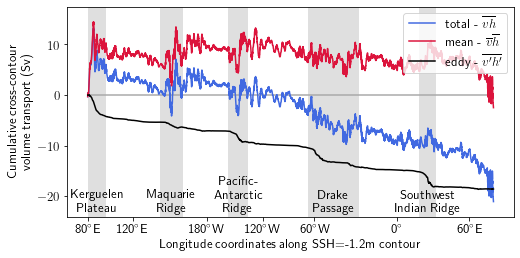

In [86]:
fig = plt.figure(figsize = (8,4))
plt.plot(distance, total/1e6, label = 'total - $\overline{vh}$',color = 'royalblue')
plt.plot(distance, mean/1e6,label = 'mean - $\overline{v}\overline{h}$',color = 'crimson')
#plt.scatter(distance_start,np.zeros(5))
#plt.scatter(distance_end,np.zeros(5))
#plt.hlines(np.zeros(5)+total.values[-1]/1e6,distance_start,distance_end, color = 'grey')
plt.bar(distance_start,mean.max().values/1e6-total.values[-1]/1e6+6, width = distance_end-distance_start, align = 'edge',
       color = 'grey',alpha = 0.25, bottom = total.values[-1]/1e6-3)
plt.xticks(distance.values[distance_indices.astype(int)[:-1]], 
           ('80$^\circ$E','120$^\circ$E','180$^\circ$W','120$^\circ$W','60$^\circ$W','0$^\circ$','60$^\circ$E'));
plt.plot(distance, eddy/1e6,label = 'eddy - $\overline{v\'h\'}$',color = 'k')
plt.hlines(0,0,distance.values[-1], color = 'darkgrey')
plt.ylabel('Cumulative cross-contour \n volume transport (Sv) ')
plt.xlabel('Longitude coordinates along SSH=-1.2m contour')
plt.legend(loc='upper right')
plt.ylim(total.values[-1]/1e6-3,mean.max().values/1e6+3)
for i in np.arange(5):
    hotspot = ['Maquarie \n Ridge', 'Pacific- \n Antarctic\n Ridge',
              'Drake \n Passage', 'Southwest \n Indian Ridge','Kerguelen \n Plateau'][i]
    plt.text(distance_start[i]+(distance_end[i]-distance_start[i])/2, -23, hotspot, ha = 'center')
fig.subplots_adjust(bottom = 0.15)
fig.savefig('cumsum_upwelling.png',dpi = 400)

In [96]:
eddy[-1]/1e6

<xarray.DataArray 'vh_eddy' ()>
array(-25.06470682)
Coordinates:
    contour_index  int64 5764

# Bottom vs upwelling arm

Text(0, 0.5, 'Cumulative eddy transport $\\overline{v^\\prime h^\\prime}$ (Sv)')

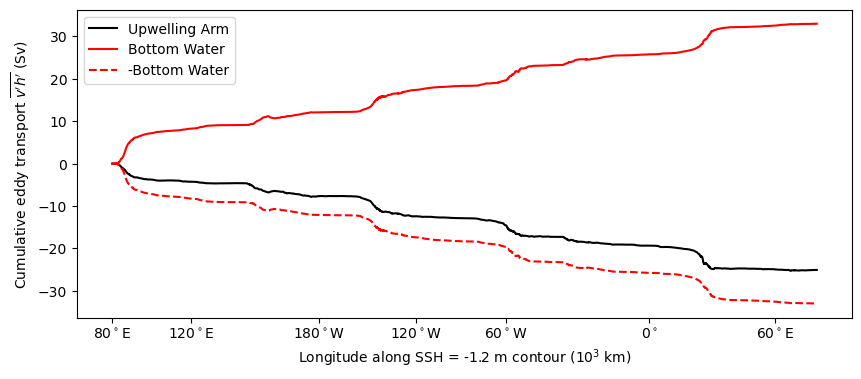

In [18]:
j_contour = 'L'
vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+'.nc').vh_eddy
bottom_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_bottom_density_cutoffs.nc').bottom_cutoff.sel(hotspot = 'total')
top_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_top_density_cutoffs.nc').top_cutoff.sel(hotspot = 'total')
# mask out water that touches surface or bottom on average
SSH = contour_dict[j_contour]['SSH']
if SSH > -0.45:
    print('SSH too big!!')
rhoslice_up = slice(top_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0],bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0])

rhoslice_bottom = slice(bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0], 1033)
save_dir = '/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_'

distance = xr.open_dataset(save_dir+'distance_along_contour.nc').distance
lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon.nc').lon_along_contour


# run above distance indices code
distance_indices = np.zeros(8)
for i in np.arange(100,len(lon_along_contour.values)):
    if (distance_indices[1]==0):
        if (lon_along_contour.values[i]>-240):
            distance_indices[1] = lon_along_contour.contour_index.values[i]
    if (distance_indices[2]==0):
        if (lon_along_contour.values[i]>-180):
            distance_indices[2] = lon_along_contour.contour_index.values[i]
    if (distance_indices[3]==0):
        if (lon_along_contour.values[i]>-120):
            distance_indices[3] = lon_along_contour.contour_index.values[i]
    if (distance_indices[4]==0):
        if lon_along_contour.values[i]>-60:
            distance_indices[4] = lon_along_contour.contour_index.values[i]
    if (distance_indices[5]==0):
        if (lon_along_contour.values[i]>0):
            distance_indices[5] = lon_along_contour.contour_index.values[i]
    if (distance_indices[6]==0):
        if (lon_along_contour.values[i]>60):
            distance_indices[6] = lon_along_contour.contour_index.values[i]
distance_indices[7] = len(lon_along_contour.contour_index.values)-1

fig = plt.figure(figsize = (10,4))
plt.plot(distance,vh_eddy.sel(isopycnal_bins = rhoslice_up).sum('isopycnal_bins').cumsum('contour_index')/1e6,color = 'k', label = 'Upwelling Arm')
plt.plot(distance,vh_eddy.sel(isopycnal_bins = rhoslice_bottom).sum('isopycnal_bins').cumsum('contour_index')/1e6,color = 'r', label = 'Bottom Water')
plt.plot(distance,-vh_eddy.sel(isopycnal_bins = rhoslice_bottom).sum('isopycnal_bins').cumsum('contour_index')/1e6,color = 'r',linestyle = '--', label = '-Bottom Water')
plt.xticks(distance.values[distance_indices.astype(int)[:-1]], 
           ('80$^\circ$E','120$^\circ$E','180$^\circ$W','120$^\circ$W','60$^\circ$W','0$^\circ$','60$^\circ$E'));
plt.legend()
plt.xlabel('Longitude along SSH = '+str(SSH)+' m contour (10$^3$ km)')
plt.ylabel('Cumulative eddy transport $\overline{v^\prime h^\prime}$ (Sv)')

Text(0, 0.5, 'Cumulative eddy transport $\\overline{v^\\prime h^\\prime}$ (Sv)')

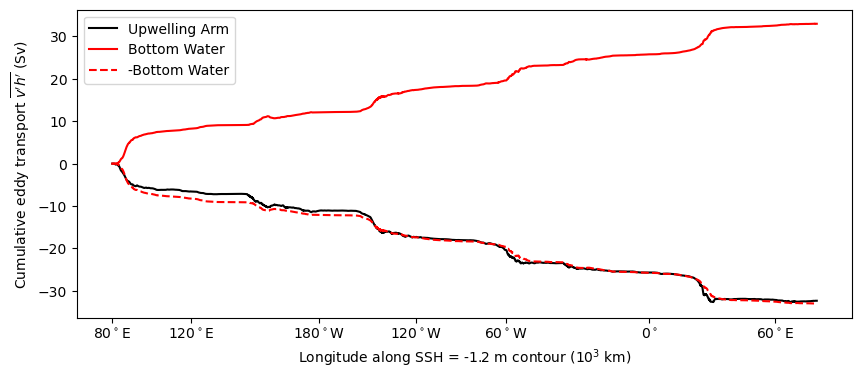

In [19]:
j_contour = 'L'
vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+'.nc').vh_eddy
bottom_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_bottom_density_cutoffs.nc').bottom_cutoff.sel(hotspot = 'total')
top_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_top_density_cutoffs.nc').top_cutoff.sel(hotspot = 'total')
# mask out water that touches surface or bottom on average
SSH = contour_dict[j_contour]['SSH']
if SSH > -0.45:
    print('SSH too big!!')
# rhoslice_up = slice(top_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0],bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0])
rhoslice_up = slice(1000,bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0])

rhoslice_bottom = slice(bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0], 1033)
save_dir = '/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_'

distance = xr.open_dataset(save_dir+'distance_along_contour.nc').distance
lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon.nc').lon_along_contour


# run above distance indices code
# run above distance indices code
distance_indices = np.zeros(8)
for i in np.arange(100,len(lon_along_contour.values)):
    if (distance_indices[1]==0):
        if (lon_along_contour.values[i]>-240):
            distance_indices[1] = lon_along_contour.contour_index.values[i]
    if (distance_indices[2]==0):
        if (lon_along_contour.values[i]>-180):
            distance_indices[2] = lon_along_contour.contour_index.values[i]
    if (distance_indices[3]==0):
        if (lon_along_contour.values[i]>-120):
            distance_indices[3] = lon_along_contour.contour_index.values[i]
    if (distance_indices[4]==0):
        if lon_along_contour.values[i]>-60:
            distance_indices[4] = lon_along_contour.contour_index.values[i]
    if (distance_indices[5]==0):
        if (lon_along_contour.values[i]>0):
            distance_indices[5] = lon_along_contour.contour_index.values[i]
    if (distance_indices[6]==0):
        if (lon_along_contour.values[i]>60):
            distance_indices[6] = lon_along_contour.contour_index.values[i]
distance_indices[7] = len(lon_along_contour.contour_index.values)-1

fig = plt.figure(figsize = (10,4))
plt.plot(distance,vh_eddy.sel(isopycnal_bins = rhoslice_up).sum('isopycnal_bins').cumsum('contour_index')/1e6,color = 'k', label = 'Upwelling Arm')
plt.plot(distance,vh_eddy.sel(isopycnal_bins = rhoslice_bottom).sum('isopycnal_bins').cumsum('contour_index')/1e6,color = 'r', label = 'Bottom Water')
plt.plot(distance,-vh_eddy.sel(isopycnal_bins = rhoslice_bottom).sum('isopycnal_bins').cumsum('contour_index')/1e6,color = 'r',linestyle = '--', label = '-Bottom Water')
plt.xticks(distance.values[distance_indices.astype(int)[:-1]], 
           ('80$^\circ$E','120$^\circ$E','180$^\circ$W','120$^\circ$W','60$^\circ$W','0$^\circ$','60$^\circ$E'));
plt.legend()
plt.xlabel('Longitude along SSH = '+str(SSH)+' m contour (10$^3$ km)')
plt.ylabel('Cumulative eddy transport $\overline{v^\prime h^\prime}$ (Sv)')

<xarray.DataArray 'h_bar' ()>
array(2531.30045153)
Coordinates:
    isopycnal_bins  float64 1.033e+03


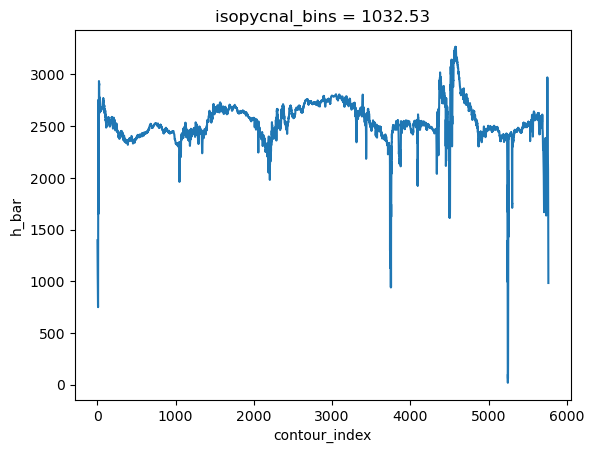

In [24]:
h_bar = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/h_bar_contour_SO_'+j_contour+'.nc').h_bar
h_bar.cumsum('isopycnal_bins').sel(isopycnal_bins = bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0]).plot()
print(h_bar.cumsum('isopycnal_bins').sel(isopycnal_bins = bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0]).mean())

# Summary plot

In [18]:
#10 degrees bigger on either side, but no overlap
hotspot_dict = OrderedDict([
('PAR',  {'lower_lon':-165,'upper_lon':-100}),
('SWIR',  {'lower_lon':5,'upper_lon':55}),
('DP',  {'lower_lon':-80,'upper_lon':5}),
('MR',  {'lower_lon':-230,'upper_lon':-165}),
('KP1',  {'lower_lon':55,'upper_lon':80}),
('KP2',{'lower_lon':-280,'upper_lon':-230})])#-260

slice(array(1032.2962295), array(1032.51), None)
5.2544448613633294
11.793485442438005 12.339868734383266
1.2160964181256009
12.193591185153945 12.714640916452941
2.911981869029922
10.287190689080024 10.891629641535742
slice(array(1032.22305317), array(1032.5), None)
3.7784559103293978
8.836646897306455 9.286164580840044
1.640808716294942
10.882348580569118 11.383905496651447
2.9581698751069894
8.601283820242912 9.5108630400542
slice(array(1032.13010113), array(1032.48), None)
6.500169740600426
16.201226891801127 22.507083397985024
2.7276827910480974
17.261794088601437 19.415551221352928
2.9788851130080753
12.011553890022597 12.710233829822291
slice(array(1032.13490907), array(1032.48), None)
7.511278971940687
13.376723927657384 13.733670987041375
1.626339769633975
13.576035658194137 13.941119773137483
2.4663141988392985
7.528443307573306 7.916312609162299
slice(array(1032.19249245), array(1032.48), None)
5.481166856471261
6.48186051657238 6.92236717752229
0.6766558547753376
9.90175500

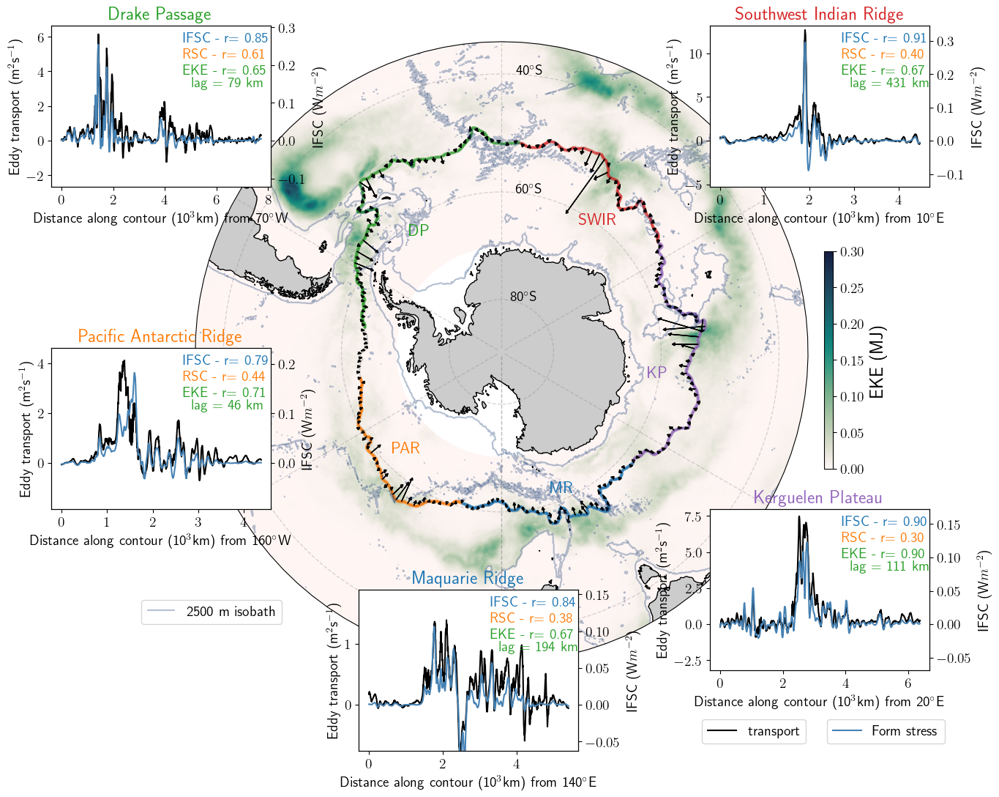

In [27]:
rhoslice = slice(1032.2, 1032.5)
projection=ccrs.SouthPolarStereo()

fig = plt.figure(figsize=(12, 11)) #14,13
ax = plt.subplot(1, 1, 1, projection=projection)

ax.set_extent([-280, 80, -80, -35], crs=ccrs.PlateCarree())
ax.add_feature(land_50m, color=[0.8, 0.8, 0.8])
ax.coastlines(resolution='50m')

# Compute a circle in axes coordinates, which we can use as a boundary
# for the map. We can pan/zoom as much as we like - the boundary will be
# permanently circular.
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)


p1 = (EKE.sum('isopycnal_bins')/1e6).plot.pcolormesh(x='xt_ocean', y='yt_ocean', add_colorbar=False, vmin=0, vmax=0.3, cmap='cmo.tempo', transform=ccrs.PlateCarree())
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=1, color='gray', alpha=0.3, linestyle='--')
gl.ylocator = mticker.FixedLocator([-80, -60, -40])
plt.text(10,-80,'80$^\circ$S',transform=ccrs.PlateCarree(), fontsize = 14)
plt.text(5,-60,'60$^\circ$S',transform=ccrs.PlateCarree(), fontsize = 14)
plt.text(3,-40,'40$^\circ$S',transform=ccrs.PlateCarree(), fontsize = 14)

ax_cb = plt.axes([0.88, 0.35, 0.01, 0.27])
cb = plt.colorbar(p1,cax=ax_cb, orientation='vertical')
cb.ax.set_ylabel('EKE (MJ)', fontsize = 18);
cb.ax.tick_params(labelsize=14)

for j in np.arange(29):
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][j]
    SSH = contour_dict[j_contour]['SSH']
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
        prefix = 400
    else:
        suffix = ''
        prefix = 0
    vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lat_along_contour
    lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lon_along_contour

    N=10

    eddy_notcumsum = vh_eddy.sel(isopycnal_bins=rhoslice).sum('isopycnal_bins').fillna(0)
    y = uniform_filter1d(eddy_notcumsum, size=N)
    if j_contour == 'L':
        dx, dy = find_arrow_dxn(lon_along_contour,lat_along_contour)
        for i in np.arange(10,len(lon_along_contour),25):

            ax.arrow(lon_along_contour[i],lat_along_contour[i],y[i]/5000*dx[i],y[i]/5000*dy[i],transform=ccrs.PlateCarree(),head_length = 0.5,head_width = 1,length_includes_head=True, color = 'k')#,transform=ccrs.PlateCarree())#, head_length = 0.1,length_includes_head=True)

    #sc = ax.scatter(lon_along_contour,lat_along_contour, s=0.1, alpha = 0.4, label = 'SSH '+str(SSH)+' m', c = -y , cmap = cm.cm.ice_r, vmin = -100, vmax = 40000,transform=ccrs.PlateCarree())
        sc = ax.scatter(lon_along_contour,lat_along_contour, s=0.1, alpha = 0.1, color = 'grey',transform=ccrs.PlateCarree())
# ax_cb = plt.axes([0.95, 0.35, 0.01, 0.3])
# cb = plt.colorbar(sc,cax=ax_cb, orientation='vertical')
# cb.ax.set_ylabel('Southward eddy transport (m$^2$s$^{-1}$)', fontsize = 18);
# cb.ax.tick_params(labelsize=14)

cs = ht.plot.contour(levels = [2500], ax = ax, transform=ccrs.PlateCarree(), cmap = 'Blues', alpha = 0.3 )
#ax.text(-0.28,-0.05,'transport shown over SSH = -1.2 m \n for 1031.95$< \sigma_1 <$ 1032.53 kgm$^{-3}$',transform=ax.transAxes, fontsize = 16)
labels = ['2500 m isobath']
for i in range(len(labels)):
    cs.collections[i].set_label(labels[i])
ax.legend(bbox_to_anchor=(-0.1,0.05),loc='lower left')


for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    hotspotlongname = ['Maquarie Ridge','Pacific Antarctic Ridge','Drake Passage','Southwest Indian Ridge','Kerguelen Plateau'][i]
    color_i = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf'][i]
    #a,b,c = find_best_contour(hotspot,rhoslice)
    #index = np.argmax(a+c)
    j_contour = 'L'#['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                             # 'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][index]
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
        prefix = 400
    else:
        suffix = ''
        prefix = 0
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lat_along_contour
    lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lon_along_contour
    if hotspot == 'KP':
        lower_index1, upper_index1 = find_lower_upper_indices('KP1', j_contour)
        lower_index2, upper_index2 = find_lower_upper_indices('KP2', j_contour)
        lon_KP = np.append(lon_along_contour[lower_index1:upper_index1],lon_along_contour[lower_index2:upper_index2])
        lat_KP = np.append(lat_along_contour[lower_index1:upper_index1],lat_along_contour[lower_index2:upper_index2])
        sc = ax.scatter(lon_KP,lat_KP, s=5,  alpha = 0.1, transform=ccrs.PlateCarree())
        ax.text(100,-62,hotspot,transform=ccrs.PlateCarree(), fontsize = 16, color = color_i)
        z_hot, Form_hot, Reynolds_hot, EKE_hot, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E, distance_h, distance_combined= compute_corr_FRS_average_rho_range(hotspot,j_contour)
        # plot
        ax_inset = plt.axes([0.75,0.1,0.25,0.2])
        ax2 = ax_inset.twinx()
        ax_inset.plot(distance_h, z_hot, color = 'k', label = 'transport')
        ax2.plot(distance_h, Form_hot, color = 'steelblue', label = 'Form stress')
        ax2.spines.right.set_position(("axes", 1))
        #ax_inset.plot(distance_combined,corr_combined_F,'-r',linewidth=1,label='Correlation')
        #ax_inset.plot(distance_combined,corr_combined_F*sig_combined_F,color='r',linewidth=8,alpha=0.5,label="Significance")
        #ax_inset.vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
        ax_inset.legend(loc = 'lower center', bbox_to_anchor = (0.2,-0.5))
        ax2.legend(loc = 'lower center', bbox_to_anchor = (0.8,-0.5))
        ax_inset.set_title(hotspotlongname, fontsize = 18, color = color_i)
        ax_inset.set_xlabel('Distance along contour (10$^3$km) from 20$^\circ$E')
        ax2.set_ylabel('IFSC (W$m^{-2}$)')
        ax_inset.set_ylabel('Eddy transport (m$^2$s$^{-1}$)')
        ax_inset.set_ylim(-(z_hot.max()+0.5)/2.5,z_hot.max()+0.5)
        ax2.set_ylim(-(Form_hot.max()+0.05)/2.5,Form_hot.max()+0.05)
        ax_inset.text(0.6,0.9,'IFSC - r= '+"{:.2f}".format(corr_combined_F.max()),transform=ax_inset.transAxes, color = 'C0')
        ax_inset.text(0.6,0.8,'RSC - r= '+"{:.2f}".format(corr_combined_R.max()), color = 'C1',transform=ax_inset.transAxes)
        ax_inset.text(0.6,0.7,'EKE - r= '+"{:.2f}".format(corr_combined_E.max()),transform=ax_inset.transAxes, color = 'C2')
        ax_inset.text(0.64,0.62,'lag = '+"{:.0f}".format(1000*distance_combined[np.nanargmax((corr_combined_E))])+' km',transform=ax_inset.transAxes, color = 'C2')
        
    else:
        lower_index, upper_index = find_lower_upper_indices(hotspot, j_contour)
        ys = [0,0.3,0.7,0.7][i]
        xs = [0.35,0,0,0.75][i]
        lon_label = ['140$^\circ$E','160$^\circ$W','70$^\circ$W','10$^\circ$E'][i]
        sc = ax.scatter(lon_along_contour[lower_index:upper_index].values,lat_along_contour[lower_index:upper_index].values,
                    s=5,  alpha = 0.1, transform=ccrs.PlateCarree())
        ax.text(np.mean(lon_along_contour[lower_index:upper_index]),-62,hotspot,transform=ccrs.PlateCarree(), fontsize = 16, color = color_i)
        z_hot, Form_hot, Reynolds_hot, EKE_hot, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E, distance_h, distance_combined= compute_corr_FRS_average_rho_range(hotspot,j_contour)
        # plot
        ax_inset = plt.axes([xs,ys,0.25,0.2])
        ax2 = ax_inset.twinx()
        ax_inset.plot(distance_h, z_hot, color = 'k', label = 'transport')
        ax2.plot(distance_h, Form_hot, color = 'steelblue', label = 'IFSC')
        ax2.spines.right.set_position(("axes", 1))
        #ax_inset.plot(distance_combined,corr_combined_F,'-r',linewidth=1,label='Correlation')
        #ax_inset.plot(distance_combined,corr_combined_F*sig_combined_F,color='r',linewidth=8,alpha=0.5,label="Significance")
        #ax_inset.vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
        #ax_inset.legend(loc = 'lower left')
        #ax2.legend(loc = 'lower right')
        ax_inset.set_title(hotspotlongname, fontsize = 18, color = color_i)
        ax_inset.set_xlabel('Distance along contour (10$^3$km) from '+lon_label)
        ax2.set_ylabel('IFSC (W$m^{-2}$)')
        ax_inset.set_ylabel('Eddy transport (m$^2$s$^{-1}$)')
        ax_inset.set_ylim(-(z_hot.max()+0.5)/2.5,z_hot.max()+0.5)
        ax2.set_ylim(-(Form_hot.max()+0.05)/2.5,Form_hot.max()+0.05)
        ax_inset.text(0.6,0.9,'IFSC - r= '+"{:.2f}".format(corr_combined_F.max()),transform=ax_inset.transAxes, color = 'C0')
        ax_inset.text(0.6,0.8,'RSC - r= '+"{:.2f}".format(corr_combined_R.max()), color = 'C1',transform=ax_inset.transAxes)
        ax_inset.text(0.6,0.7,'EKE - r= '+"{:.2f}".format(corr_combined_E.max()),transform=ax_inset.transAxes, color = 'C2')
        ax_inset.text(0.64,0.62,'lag = '+"{:.0f}".format(1000*distance_combined[np.nanargmax((corr_combined_E))])+' km',transform=ax_inset.transAxes, color = 'C2')

plt.savefig('temp.png',dpi= 400, transparent=True, pad_inches=5)

In [52]:
len(corr_combined_F)

539

In [42]:
"{:.2f}".format(13.949999999999999)


'13.95'

### to fix:
- km instead of contour index
- coloured arrows?
- EKE significance PAR (smoothing?)
- add significances of RS and EKE info
- downstream EKE info

In [65]:
plt.rc('text', usetex=True)
plt.rcParams.update({'font.size': 13})


(1032.6, 1030.0)

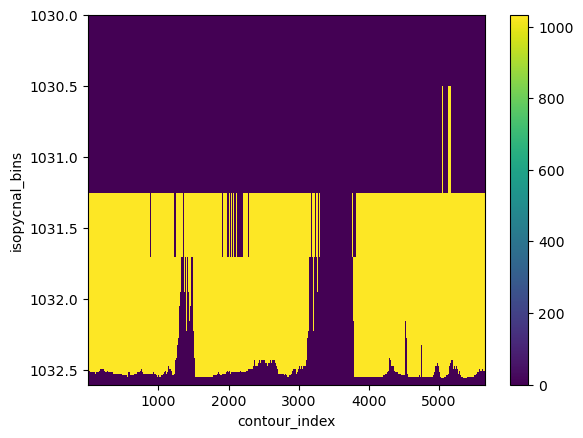

In [101]:
N=10
j_contour ='A'
rhoslice = slice(1030,1032.5)
if contour_dict[j_contour]['shifted']==True:
    suffix = '_shiftedback'
else:
    suffix = ''
vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
isopycnal_bin_contour = vh_eddy*0+vh_eddy.isopycnal_bins
top_rho1_max_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').top_rho1_max_contour
bottom_rho1_min_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').bottom_rho1_min_contour
vh_eddy_masked= vh_eddy.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
eddy_notcumsum = -(vh_eddy_masked).sel(isopycnal_bins=rhoslice).sum('isopycnal_bins')
segment_length = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_segment_length'+suffix+'.nc').segment_length
isopycnal_bin_contour.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0).plot()
plt.ylim(1032.6,1030)

slice(1032.2, 1032.5, None)
4.772363225841228
13.054707031750032 15.849461139139294


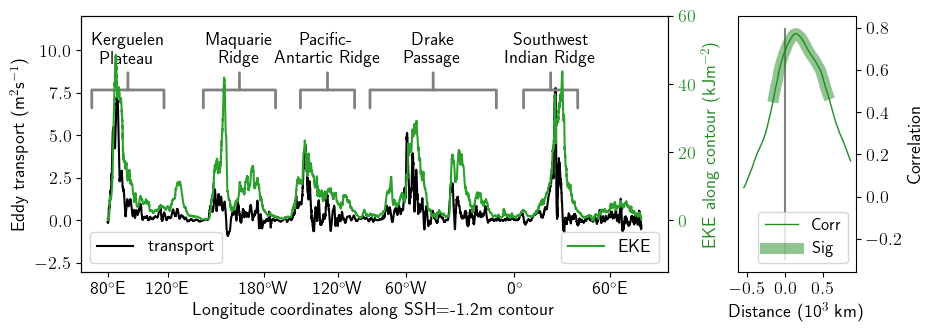

In [79]:
N=10
j_contour ='L'
rhoslice = slice(1032.2,1032.5)
if contour_dict[j_contour]['shifted']==True:
    suffix = '_shiftedback'
else:
    suffix = ''
vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
isopycnal_bin_contour = vh_eddy*0+vh_eddy.isopycnal_bins
#top_rho1_max_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').top_rho1_max_contour
#bottom_rho1_min_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').bottom_rho1_min_contour
#vh_eddy_masked= vh_eddy.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
bottom_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_bottom_density_cutoffs.nc').bottom_cutoff.sel(hotspot = 'total')
top_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_top_density_cutoffs.nc').top_cutoff.sel(hotspot = 'total')
# mask out water that touches surface or bottom on average
SSH = contour_dict[j_contour]['SSH']
# if SSH > -0.45:
#     print('SSH too big!!')
# rhoslice = slice(top_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0],bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0])
print(str(rhoslice))
eddy_notcumsum = -(vh_eddy).sel(isopycnal_bins=rhoslice).sum('isopycnal_bins')
segment_length = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_segment_length'+suffix+'.nc').segment_length
y = uniform_filter1d(eddy_notcumsum, size=N)/segment_length.values
EKE_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').EKE_contour
EKE = EKE_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins').values/segment_length.values
z_scaled = y/np.max(y)
EKE_scaled = EKE/np.max(EKE)
c_cor = Compute_Correlation(z_scaled,EKE_scaled)
c_cor2 = Compute_Correlation(EKE_scaled,z_scaled)
corr,sig,t,N = c_cor.cor_series()
print(max(t))
print(min(N),max(N))
corr2,sig2,t2,N2 = c_cor2.cor_series()
corr_combined_E = np.append(np.flip(corr2[1:]),corr)
sig_combined_E = np.append(np.flip(sig2)[1:],sig)
distance = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_distance_along_contour.nc').distance
distance_small = distance[0:len(corr)]
distance_combined = np.append(-np.flip(distance_small)[:-1],distance_small)

f, (ax, ax_inset) = plt.subplots(1, 2, gridspec_kw={'width_ratios': [5, 1]}, figsize = (10,3.5))
ax.plot(distance,y, color = 'k', label = 'transport')
ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_ylabel('EKE along contour (kJm$^{-2}$)', color='forestgreen')  # we already handled the x-label with ax1
ax2.tick_params(axis='y', labelcolor='forestgreen')
ax2.plot(distance,EKE/1e3, color = 'C2', label = 'EKE')

ax_inset.plot(distance_combined[1550:1800],corr_combined_E[1550:1800],'forestgreen',linewidth=1,label='Corr')
ax_inset.plot(distance_combined[1550:1800],(corr_combined_E*sig_combined_E)[1550:1800], color='forestgreen',linewidth=8,alpha=0.5,label="Sig")
ax_inset.vlines(0,-0.3,0.8, color = 'grey')
ax.legend(loc = 'lower left')
ax2.legend(loc = 'lower right')
ax.set_xticks(distance.values[distance_indices.astype(int)[:-1]])
ax.set_xticklabels(['80$^\circ$E','120$^\circ$E','180$^\circ$W','120$^\circ$W','60$^\circ$W','0$^\circ$','60$^\circ$E']);
ax.set_xlabel('Longitude coordinates along SSH=-1.2m contour')

ax_inset.legend(loc = 'lower right', fontsize = 12)
#ax.set_xlabel('Distance along SSH=-1.2m contour (10$^3$km), starting at 80$^\circ$E')
ax_inset.set_xlabel('Distance (10$^3$ km)')
ax.set_ylabel('Eddy transport (m$^2$s$^{-1}$)')
ax_inset.yaxis.tick_right()
ax_inset.yaxis.set_label_position("right")
ax_inset.set_ylabel('Correlation')
#ax.set_title('contour SSH=-1.2m, $\sigma_1$=(1032,1032.5)')
#plt.subplots_adjust(wspace = 0)
ax.annotate('Kerguelen \n Plateau', xy=(0.08, 0.70), xytext=(0.08, 0.8), xycoords='axes fraction', 
            fontsize=13, ha='center', va='bottom',
            #bbox=dict(boxstyle='square', fc='white'),
            arrowprops=dict(arrowstyle='-[, widthB=2.0, lengthB=1', lw=2.0, color = 'grey'))
ax.annotate('Maquarie \n Ridge', xy=(0.27, 0.70), xytext=(0.27, 0.8), xycoords='axes fraction', 
            fontsize=13, ha='center', va='bottom',
            #bbox=dict(boxstyle='square', fc='white'),
            arrowprops=dict(arrowstyle='-[, widthB=2.0, lengthB=1', lw=2.0, color = 'grey'))
ax.annotate('Pacific-\n Antartic Ridge', xy=(0.42, 0.70), xytext=(0.42, 0.8), xycoords='axes fraction', 
            fontsize=13, ha='center', va='bottom',
            #bbox=dict(boxstyle='square', fc='white'),
            arrowprops=dict(arrowstyle='-[, widthB=1.5, lengthB=1', lw=2.0, color = 'grey'))
ax.annotate('Drake \n Passage', xy=(0.6, 0.70), xytext=(0.6, 0.8), xycoords='axes fraction', 
            fontsize=13, ha='center', va='bottom',
            #bbox=dict(boxstyle='square', fc='white'),
            arrowprops=dict(arrowstyle='-[, widthB=3.5, lengthB=1', lw=2.0, color = 'grey'))
ax.annotate('Southwest \n Indian Ridge', xy=(0.8, 0.70), xytext=(0.8, 0.8), xycoords='axes fraction', 
            fontsize=13, ha='center', va='bottom',
            #bbox=dict(boxstyle='square', fc='white'),
            arrowprops=dict(arrowstyle='-[, widthB=1.5, lengthB=1', lw=2.0, color = 'grey'))
ax2.set_ylim(-15,60)
ax.set_ylim(-3,12)

plt.subplots_adjust(wspace = 0.2,bottom = 0.15)

f.savefig('EKEcontour.png',dpi = 400)

slice(1032.2, 1032.5, None)
9.879499155271903
50.56696294221445 57.37696830228603


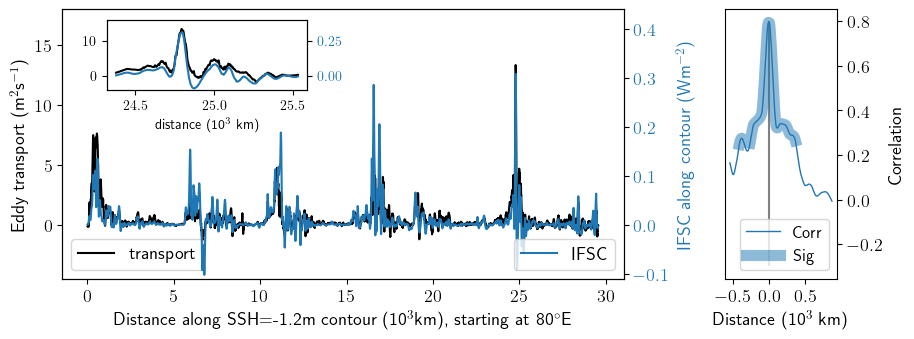

0.7953272845940914


In [83]:
j_contour = 'L'
N=10
if contour_dict[j_contour]['shifted']==True:
    suffix = '_shiftedback'
else:
    suffix = ''
vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
isopycnal_bin_contour = vh_eddy*0+vh_eddy.isopycnal_bins
#top_rho1_max_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').top_rho1_max_contour
#bottom_rho1_min_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').bottom_rho1_min_contour
#vh_eddy_masked= vh_eddy.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
bottom_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_bottom_density_cutoffs.nc').bottom_cutoff.sel(hotspot = 'total')
top_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_top_density_cutoffs.nc').top_cutoff.sel(hotspot = 'total')
# mask out water that touches surface or bottom on average
SSH = contour_dict[j_contour]['SSH']
# if SSH > -0.45:
#     print('SSH too big!!')
# rhoslice = slice(top_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0],bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0])
rhoslice = slice(1032.2,1032.5)
print(str(rhoslice))
eddy_notcumsum = -(vh_eddy).sel(isopycnal_bins=rhoslice).sum('isopycnal_bins').fillna(0)
segment_length = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_segment_length'+suffix+'.nc').segment_length
y = uniform_filter1d(eddy_notcumsum, size=N)/segment_length
EKE_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').Form_contour
EKE = EKE_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins')
EKE = uniform_filter1d(EKE, size=N)/segment_length
z_scaled = y.where(y!=np.inf).where(y!=-np.inf).fillna(0)/np.max(y)
EKE_scaled = EKE.where(y!=np.inf).where(y!=-np.inf).fillna(0)/np.max(EKE)
c_cor = Compute_Correlation(z_scaled,EKE_scaled)
c_cor2 = Compute_Correlation(EKE_scaled,z_scaled)
corr,sig,t,N = c_cor.cor_series()
print(max(t))
print(min(N),max(N))
corr2,sig2,t2,N2 = c_cor2.cor_series()
corr_combined_E = np.append(np.flip(corr2[1:]),corr)
sig_combined_E = np.append(np.flip(sig2)[1:],sig)
distance = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_distance_along_contour.nc').distance
distance_small = distance[0:len(corr)]
distance_combined = np.append(-np.flip(distance_small)[:-1],distance_small)

f, (ax, ax_inset) = plt.subplots(1, 2, gridspec_kw={'width_ratios': [5, 1]}, figsize = (10,3.5))
ax.plot(distance,y, color = 'k', label = 'transport')
ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_ylabel('IFSC along contour (Wm$^{-2}$)', color='C0')  # we already handled the x-label with ax1
ax2.tick_params(axis='y', labelcolor='C0')
ax2.plot(distance,EKE, color = 'C0', label = 'IFSC')

ax_inset.plot(distance_combined[1550:1800],corr_combined_E[1550:1800],'C0',linewidth=1,label='Corr')
ax_inset.plot(distance_combined[1550:1800],(corr_combined_E*sig_combined_E)[1550:1800], color='C0',linewidth=8,alpha=0.5,label="Sig")
ax_inset.vlines(0,-0.3,0.8, color = 'grey')
ax.legend(loc = 'lower left')
ax2.legend(loc = 'lower right')

ax_inset.legend(loc = 'lower right', fontsize = 12)
ax.set_xlabel('Distance along SSH=-1.2m contour (10$^3$km), starting at 80$^\circ$E')
ax_inset.set_xlabel('Distance (10$^3$ km)')
ax.set_ylabel('Eddy transport (m$^2$s$^{-1}$)')
ax_inset.yaxis.tick_right()
ax_inset.yaxis.set_label_position("right")
ax_inset.set_ylabel('Correlation')

ax_inset2 = plt.axes([0.17,0.65,0.2,0.2])
ax_inset_otherside = ax_inset2.twinx()
ax_inset_otherside.tick_params(axis='y', labelcolor='C0')
ax_inset_otherside.plot(distance[4800:5000],EKE[4800:5000], color = 'C0')
ax_inset2.plot(distance[4800:5000],y[4800:5000], color = 'k')
ax_inset2.set_xlabel('distance (10$^3$ km)', fontsize = 10)
ax_inset2.tick_params(axis='x', labelsize= 10)
ax_inset2.tick_params(axis='y', labelsize= 10)
ax_inset_otherside.tick_params(axis='y', labelsize= 10)

ax_inset_otherside.set_ylim(-0.1,0.4)
ax_inset2.set_ylim(-4,16)

#     #ax.set_title('contour SSH=-1.2m, $\sigma_1$=(1032,1032.5)')
#     #plt.subplots_adjust(wspace = 0)
#     # ax.annotate('Kerguelen \n Plateau', xy=(0.08, 0.70), xytext=(0.08, 0.8), xycoords='axes fraction', 
#     #             fontsize=13, ha='center', va='bottom',
#     #             #bbox=dict(boxstyle='square', fc='white'),
#     #             arrowprops=dict(arrowstyle='-[, widthB=2.0, lengthB=1', lw=2.0, color = 'grey'))
#     # ax.annotate('Maquarie \n Ridge', xy=(0.27, 0.70), xytext=(0.27, 0.8), xycoords='axes fraction', 
#     #             fontsize=13, ha='center', va='bottom',
#     #             #bbox=dict(boxstyle='square', fc='white'),
#     #             arrowprops=dict(arrowstyle='-[, widthB=2.0, lengthB=1', lw=2.0, color = 'grey'))
#     # ax.annotate('Pacific-\n Antartic \n Ridge', xy=(0.40, 0.70), xytext=(0.4, 0.8), xycoords='axes fraction', 
#     #             fontsize=13, ha='center', va='bottom',
#     #             #bbox=dict(boxstyle='square', fc='white'),
#     #             arrowprops=dict(arrowstyle='-[, widthB=1.5, lengthB=1', lw=2.0, color = 'grey'))
#     # ax.annotate('Drake \n Passage', xy=(0.6, 0.70), xytext=(0.6, 0.8), xycoords='axes fraction', 
#     #             fontsize=13, ha='center', va='bottom',
#     #             #bbox=dict(boxstyle='square', fc='white'),
#     #             arrowprops=dict(arrowstyle='-[, widthB=3.5, lengthB=1', lw=2.0, color = 'grey'))
#     # ax.annotate('Southwest \n Indian Ridge', xy=(0.8, 0.70), xytext=(0.8, 0.8), xycoords='axes fraction', 
#     #             fontsize=13, ha='center', va='bottom',
#     #             #bbox=dict(boxstyle='square', fc='white'),
#     #             arrowprops=dict(arrowstyle='-[, widthB=1.5, lengthB=1', lw=2.0, color = 'grey'))
ax2.set_ylim(-0.11,0.44)
ax.set_ylim(-4.5,18)

plt.subplots_adjust(wspace = 0.3)
plt.show()
print(np.max(corr_combined_E))
f.subplots_adjust(bottom =0.15)

f.savefig('FScorr_SSH1.2.png',dpi = 400)

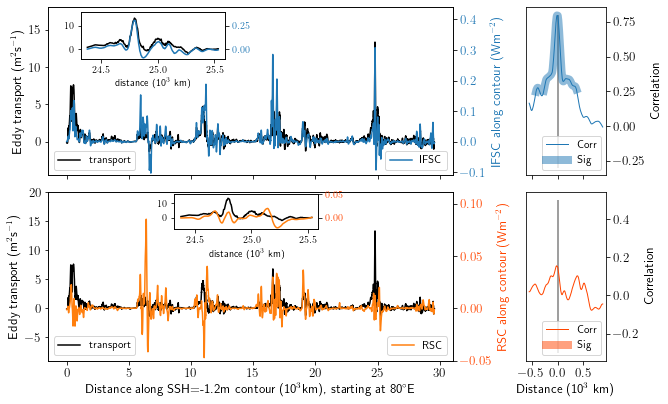

In [73]:
j_contour = 'L'
N=10
if contour_dict[j_contour]['shifted']==True:
    suffix = '_shiftedback'
else:
    suffix = ''
vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
isopycnal_bin_contour = vh_eddy*0+vh_eddy.isopycnal_bins
#top_rho1_max_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').top_rho1_max_contour
#bottom_rho1_min_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').bottom_rho1_min_contour
#vh_eddy_masked= vh_eddy.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
bottom_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_bottom_density_cutoffs.nc').bottom_cutoff.sel(hotspot = 'total')
top_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_top_density_cutoffs.nc').top_cutoff.sel(hotspot = 'total')
# mask out water that touches surface or bottom on average
SSH = contour_dict[j_contour]['SSH']
# if SSH > -0.45:
#     print('SSH too big!!')
# rhoslice = slice(top_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0],bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0])
rhoslice = slice(1032.2,1032.5)
eddy_notcumsum = -(vh_eddy).sel(isopycnal_bins=rhoslice).sum('isopycnal_bins').fillna(0)
segment_length = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_segment_length'+suffix+'.nc').segment_length
y = uniform_filter1d(eddy_notcumsum, size=N)/segment_length
EKE_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').Form_contour
EKE = EKE_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins')
EKE = uniform_filter1d(EKE, size=N)/segment_length
z_scaled = y.where(y!=np.inf).where(y!=-np.inf).fillna(0)/np.max(y)
EKE_scaled = EKE.where(y!=np.inf).where(y!=-np.inf).fillna(0)/np.max(EKE)
c_cor = Compute_Correlation(z_scaled,EKE_scaled)
c_cor2 = Compute_Correlation(EKE_scaled,z_scaled)
corr,sig,t,N = c_cor.cor_series()
corr2,sig2,t2,N2 = c_cor2.cor_series()
corr_combined_E = np.append(np.flip(corr2[1:]),corr)
sig_combined_E = np.append(np.flip(sig2)[1:],sig)
distance = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_distance_along_contour.nc').distance
distance_small = distance[0:len(corr)]
distance_combined = np.append(-np.flip(distance_small)[:-1],distance_small)

f, ((ax, ax_inset), (axR,ax_insetR)) = plt.subplots(2, 2, gridspec_kw={'width_ratios': [5, 1]}, figsize = (10,6.5), sharex = 'col')
ax.plot(distance,y, color = 'k', label = 'transport')
ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_ylabel('IFSC along contour (Wm$^{-2}$)', color='C0')  # we already handled the x-label with ax1
ax2.tick_params(axis='y', labelcolor='C0')
ax2.plot(distance,EKE, color = 'C0', label = 'IFSC')

ax_inset.plot(distance_combined[1550:1800],corr_combined_E[1550:1800],'C0',linewidth=1,label='Corr')
ax_inset.plot(distance_combined[1550:1800],(corr_combined_E*sig_combined_E)[1550:1800], color='C0',linewidth=8,alpha=0.5,label="Sig")
ax_inset.vlines(0,-0.3,0.8, color = 'grey')
ax.legend(loc = 'lower left', fontsize = 11)
ax2.legend(loc = 'lower right', fontsize = 11)

ax_inset.legend(loc = 'lower right', fontsize = 11)
ax.set_xlabel('')
ax_inset.set_xlabel('')
ax.set_ylabel('Eddy transport (m$^2$s$^{-1}$)')
ax_inset.yaxis.tick_right()
ax_inset.yaxis.set_label_position("right")
ax_inset.set_ylabel('Correlation')

ax_inset2 = plt.axes([0.17,0.77,0.2,0.1])
ax_inset_otherside = ax_inset2.twinx()
ax_inset_otherside.tick_params(axis='y', labelcolor='C0')
ax_inset_otherside.plot(distance[4800:5000],EKE[4800:5000], color = 'C0')
ax_inset2.plot(distance[4800:5000],y[4800:5000], color = 'k')
ax_inset2.set_xlabel('distance (10$^3$ km)', fontsize = 10)
ax_inset2.tick_params(axis='x', labelsize= 10)
ax_inset2.tick_params(axis='y', labelsize= 10)
ax_inset_otherside.tick_params(axis='y', labelsize= 10)

ax_inset_otherside.set_ylim(-0.1,0.4)
ax_inset2.set_ylim(-4,16)

ax2.set_ylim(-0.11,0.44)
ax.set_ylim(-4.5,18)
#same for Reynolds
EKE_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').Reynolds_contour
EKE = EKE_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins')
N=10
EKE = uniform_filter1d(EKE, size=N)/segment_length
z_scaled = y.where(y!=np.inf).where(y!=-np.inf).fillna(0)/np.max(y)
EKE_scaled = EKE.where(y!=np.inf).where(y!=-np.inf).fillna(0)/np.max(EKE)
c_cor = Compute_Correlation(z_scaled,EKE_scaled)
c_cor2 = Compute_Correlation(EKE_scaled,z_scaled)
corr,sig,t,N = c_cor.cor_series()
corr2,sig2,t2,N2 = c_cor2.cor_series()
corr_combined_E = np.append(np.flip(corr2[1:]),corr)
sig_combined_E = np.append(np.flip(sig2)[1:],sig)

axR.plot(distance,y, color = 'k', label = 'transport')
ax2 = axR.twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_ylabel('RSC along contour (Wm$^{-2}$)', color='orangered')  # we already handled the x-label with ax1
ax2.tick_params(axis='y', labelcolor='orangered')
ax2.plot(distance,EKE, color = 'C1', label = 'RSC')

ax_insetR.plot(distance_combined[1550:1800],corr_combined_E[1550:1800],'orangered',linewidth=1,label='Corr')
ax_insetR.plot(distance_combined[1550:1800],(corr_combined_E*sig_combined_E)[1550:1800], color='orangered',linewidth=8,alpha=0.5,label="Sig")
ax_insetR.vlines(0,-0.3,0.5, color = 'grey')
axR.legend(loc = 'lower left', fontsize = 11)
ax2.legend(loc = 'lower right', fontsize = 11)

ax_insetR.legend(loc = 'lower right', fontsize = 11)
axR.set_xlabel('Distance along SSH=-1.2m contour (10$^3$km), starting at 80$^\circ$E')
ax_insetR.set_xlabel('Distance (10$^3$ km)')
axR.set_ylabel('Eddy transport (m$^2$s$^{-1}$)')
ax_insetR.yaxis.tick_right()
ax_insetR.yaxis.set_label_position("right")
ax_insetR.set_ylabel('Correlation')

ax_inset2 = plt.axes([0.3,0.405,0.2,0.075])
ax_inset_otherside = ax_inset2.twinx()
ax_inset_otherside.tick_params(axis='y', labelcolor='orangered')
ax_inset_otherside.plot(distance[4800:5000],EKE[4800:5000], color = 'C1')
ax_inset2.plot(distance[4800:5000],y[4800:5000], color = 'k')
ax_inset2.set_xlabel('distance (10$^3$ km)', fontsize = 10)
ax_inset2.tick_params(axis='x', labelsize= 10)
ax_inset2.tick_params(axis='y', labelsize= 10)
ax_inset_otherside.tick_params(axis='y', labelsize= 10)
ax_inset_otherside.set_ylim(-0.025,0.05)
ax_inset2.set_ylim(-8,16)

ax2.set_ylim(-0.05,0.1111)
axR.set_ylim(-9,20)



plt.subplots_adjust(wspace = 0.3, hspace = 0.1)
plt.show()
f.subplots_adjust(bottom =0.15)

#ax_inset.set_xlim(-0.5,0.5)
#ax_insetR.set_xlim(-0.5,0.5)


f.savefig('FSRScorr_SSH1.2.png',dpi = 400)

slice(1032.2, 1032.5, None)
2.15727990753389
47.61993254493138 55.836613285824285


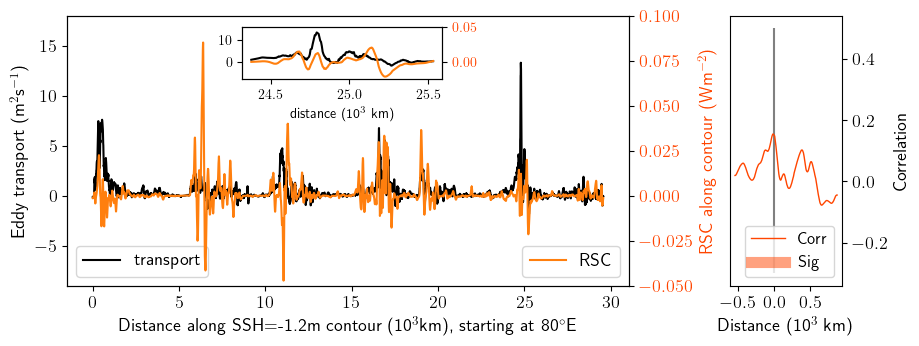

0.2968020220338352


In [82]:
j_contour = 'L'
N=10
if contour_dict[j_contour]['shifted']==True:
    suffix = '_shiftedback'
else:
    suffix = ''
vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
isopycnal_bin_contour = vh_eddy*0+vh_eddy.isopycnal_bins
#top_rho1_max_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').top_rho1_max_contour
#bottom_rho1_min_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').bottom_rho1_min_contour
#vh_eddy_masked= vh_eddy.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
bottom_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_bottom_density_cutoffs.nc').bottom_cutoff.sel(hotspot = 'total')
top_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_top_density_cutoffs.nc').top_cutoff.sel(hotspot = 'total')
# mask out water that touches surface or bottom on average
SSH = contour_dict[j_contour]['SSH']
# if SSH > -0.45:
#     print('SSH too big!!')
# rhoslice = slice(top_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0],bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0])
rhoslice = slice(1032.2,1032.5)
print(str(rhoslice))
eddy_notcumsum = -(vh_eddy).sel(isopycnal_bins=rhoslice).sum('isopycnal_bins').fillna(0)
segment_length = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_segment_length'+suffix+'.nc').segment_length
y = uniform_filter1d(eddy_notcumsum, size=N)/segment_length
EKE_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').Reynolds_contour
EKE = EKE_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins')
EKE = uniform_filter1d(EKE, size=N)/segment_length
z_scaled = y.where(y!=np.inf).where(y!=-np.inf).fillna(0)/np.max(y)
EKE_scaled = EKE.where(y!=np.inf).where(y!=-np.inf).fillna(0)/np.max(EKE)
c_cor = Compute_Correlation(z_scaled,EKE_scaled)
c_cor2 = Compute_Correlation(EKE_scaled,z_scaled)
corr,sig,t,N = c_cor.cor_series()
print(max(t))
print(min(N),max(N))
corr2,sig2,t2,N2 = c_cor2.cor_series()
corr_combined_E = np.append(np.flip(corr2[1:]),corr)
sig_combined_E = np.append(np.flip(sig2)[1:],sig)
distance = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_distance_along_contour.nc').distance
distance_small = distance[0:len(corr)]
distance_combined = np.append(-np.flip(distance_small)[:-1],distance_small)

f, (ax, ax_inset) = plt.subplots(1, 2, gridspec_kw={'width_ratios': [5, 1]}, figsize = (10,3.5))
ax.plot(distance,y, color = 'k', label = 'transport')
ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_ylabel('RSC along contour (Wm$^{-2}$)', color='orangered')  # we already handled the x-label with ax1
ax2.tick_params(axis='y', labelcolor='orangered')
ax2.plot(distance,EKE, color = 'C1', label = 'RSC')

ax_inset.plot(distance_combined[1550:1800],corr_combined_E[1550:1800],'orangered',linewidth=1,label='Corr')
ax_inset.plot(distance_combined[1550:1800],(corr_combined_E*sig_combined_E)[1550:1800], color='orangered',linewidth=8,alpha=0.5,label="Sig")
ax_inset.vlines(0,-0.3,0.5, color = 'grey')
ax.legend(loc = 'lower left')
ax2.legend(loc = 'lower right')

ax_inset.legend(loc = 'lower right', fontsize = 12)
ax.set_xlabel('Distance along SSH=-1.2m contour (10$^3$km), starting at 80$^\circ$E')
ax_inset.set_xlabel('Distance (10$^3$ km)')
ax.set_ylabel('Eddy transport (m$^2$s$^{-1}$)')
ax_inset.yaxis.tick_right()
ax_inset.yaxis.set_label_position("right")
ax_inset.set_ylabel('Correlation')

ax_inset2 = plt.axes([0.3,0.7,0.2,0.15])
ax_inset_otherside = ax_inset2.twinx()
ax_inset_otherside.tick_params(axis='y', labelcolor='orangered')
ax_inset_otherside.plot(distance[4800:5000],EKE[4800:5000], color = 'C1')
ax_inset2.plot(distance[4800:5000],y[4800:5000], color = 'k')
ax_inset2.set_xlabel('distance (10$^3$ km)', fontsize = 10)
ax_inset2.tick_params(axis='x', labelsize= 10)
ax_inset2.tick_params(axis='y', labelsize= 10)
ax_inset_otherside.tick_params(axis='y', labelsize= 10)
ax_inset_otherside.set_ylim(-0.025,0.05)
ax_inset2.set_ylim(-8,16)

#     #ax.set_title('contour SSH=-1.2m, $\sigma_1$=(1032,1032.5)')
#     #plt.subplots_adjust(wspace = 0)
#     # ax.annotate('Kerguelen \n Plateau', xy=(0.08, 0.70), xytext=(0.08, 0.8), xycoords='axes fraction', 
#     #             fontsize=13, ha='center', va='bottom',
#     #             #bbox=dict(boxstyle='square', fc='white'),
#     #             arrowprops=dict(arrowstyle='-[, widthB=2.0, lengthB=1', lw=2.0, color = 'grey'))
#     # ax.annotate('Maquarie \n Ridge', xy=(0.27, 0.70), xytext=(0.27, 0.8), xycoords='axes fraction', 
#     #             fontsize=13, ha='center', va='bottom',
#     #             #bbox=dict(boxstyle='square', fc='white'),
#     #             arrowprops=dict(arrowstyle='-[, widthB=2.0, lengthB=1', lw=2.0, color = 'grey'))
#     # ax.annotate('Pacific-\n Antartic \n Ridge', xy=(0.40, 0.70), xytext=(0.4, 0.8), xycoords='axes fraction', 
#     #             fontsize=13, ha='center', va='bottom',
#     #             #bbox=dict(boxstyle='square', fc='white'),
#     #             arrowprops=dict(arrowstyle='-[, widthB=1.5, lengthB=1', lw=2.0, color = 'grey'))
#     # ax.annotate('Drake \n Passage', xy=(0.6, 0.70), xytext=(0.6, 0.8), xycoords='axes fraction', 
#     #             fontsize=13, ha='center', va='bottom',
#     #             #bbox=dict(boxstyle='square', fc='white'),
#     #             arrowprops=dict(arrowstyle='-[, widthB=3.5, lengthB=1', lw=2.0, color = 'grey'))
#     # ax.annotate('Southwest \n Indian Ridge', xy=(0.8, 0.70), xytext=(0.8, 0.8), xycoords='axes fraction', 
#     #             fontsize=13, ha='center', va='bottom',
#     #             #bbox=dict(boxstyle='square', fc='white'),
#     #             arrowprops=dict(arrowstyle='-[, widthB=1.5, lengthB=1', lw=2.0, color = 'grey'))
ax2.set_ylim(-0.05,0.1)
ax.set_ylim(-9,18)

plt.subplots_adjust(wspace = 0.3)
plt.show()
print(np.max(corr_combined_E))
f.subplots_adjust(bottom =0.15)
f.savefig('RScorr_SSH1.2.png',dpi = 400)

In [19]:
def diagnostic_rs(field,Nsmooth,rhoslice):
    FScorr = np.zeros(29)
    for j in np.arange(7,29):
        j_contour = np.array(['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                                  'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'])[j]
        print(j_contour)
        N=Nsmooth
        if contour_dict[j_contour]['shifted']==True:
            suffix = '_shiftedback'
            segment_length = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'segment_length'+suffix+'.nc').segment_length
        else:
            suffix = ''
            segment_length = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_segment_length'+suffix+'.nc').segment_length

        vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
        isopycnal_bin_contour = vh_eddy*0+vh_eddy.isopycnal_bins
#         #top_rho1_max_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').top_rho1_max_contour
#         #bottom_rho1_min_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').bottom_rho1_min_contour
#         #vh_eddy_masked= vh_eddy.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
#         bottom_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_bottom_density_cutoffs.nc').bottom_cutoff.sel(hotspot = 'total')
#         top_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_top_density_cutoffs.nc').top_cutoff.sel(hotspot = 'total')
#         # mask out water that touches surface or bottom on average
#         SSH = contour_dict[j_contour]['SSH']
#         if SSH > -0.45:
#             print('SSH too big!!')
#         rhoslice = slice(top_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0],bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0])
        #print(str(rhoslice))
        eddy_notcumsum = -(vh_eddy).sel(isopycnal_bins=rhoslice).sum('isopycnal_bins').fillna(0)
        y = uniform_filter1d(eddy_notcumsum, size=N)/segment_length
        if field =='EKE':
            EKE_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').EKE_contour
            EKE = EKE_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins')
            EKE = EKE/segment_length
        if field =='FS':
            EKE_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').Form_contour
            EKE = EKE_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins')
            EKE = uniform_filter1d(EKE, size=N)/segment_length
        if field =='RS':
            EKE_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').Reynolds_contour
            EKE = EKE_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins')
            EKE = uniform_filter1d(EKE, size=N)/segment_length
        z_scaled = y.where(y!=np.inf).where(y!=-np.inf).fillna(0)/np.max(y)
        EKE_scaled = EKE.where(y!=np.inf).where(y!=-np.inf).fillna(0)/np.max(EKE)
        c_cor = Compute_Correlation(z_scaled,EKE_scaled)
        c_cor2 = Compute_Correlation(EKE_scaled,z_scaled)
        corr,sig,t,N = c_cor.cor_series()
        #print(max(t))
        #print(min(N),max(N))
        corr2,sig2,t2,N2 = c_cor2.cor_series()
        corr_combined_E = np.append(np.flip(corr2[1:]),corr)
        sig_combined_E = np.append(np.flip(sig2)[1:],sig)
        distance = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_distance_along_contour.nc').distance
        distance_small = distance[0:len(corr)]
        distance_combined = np.append(-np.flip(distance_small)[:-1],distance_small)

        FScorr[j]=np.max(corr_combined_E)
        sigcorr = corr_combined_E*sig_combined_E
        for i in np.arange(len(sigcorr)):
            if np.isnan(sigcorr[i]):
                sigcorr[i]=0
        print(np.max(sigcorr))
    return FScorr

In [19]:
rhoslice = slice(1032.2,1032.5)
FScorr_n1 = diagnostic_rs('FS',1, rhoslice)
FScorr_n10 = diagnostic_rs('FS',10, rhoslice)
FScorr_n20 = diagnostic_rs('FS',20, rhoslice)
FScorr_n50 = diagnostic_rs('FS',50, rhoslice)

RScorr_n1 = diagnostic_rs('RS',1, rhoslice)
RScorr_n10 = diagnostic_rs('RS',10, rhoslice)
RScorr_n20 = diagnostic_rs('RS',20, rhoslice)
RScorr_n50 = diagnostic_rs('RS',50, rhoslice)

EKEcorr_n1 = diagnostic_rs('EKE',1, rhoslice)
EKEcorr_n10 = diagnostic_rs('EKE',10, rhoslice)
EKEcorr_n20 = diagnostic_rs('EKE',20, rhoslice)
EKEcorr_n50 = diagnostic_rs('EKE',50, rhoslice)



S
0.3964077069140368
E
0.37804064870759135
T
0.3617279742842326
F
0.37287340119738116
U
0.35739317528062964
G
0.431478249631184
V
0.5149401946460694
H
0.5440001525948056
W
0.5478692999609842
I
0.5510089489144973
X
0.5680330299251042
J
0.5533000618347285
Y
0.5790559518696685
K
0.533106735116535
Z
0.5350267920570226
L
0.6278458660296482
Z1
0.6403788624350772
M
0.5857753695658869
Z2
0.573883212008628
N
0.5315526018981201
Z3
0.5649809751957862
O
0.5335569635613802
S
0.6853124825307971
E
0.6671822853191183
T
0.6541023344152694
F
0.6484498055162499
U
0.6263631178499105
G
0.6360148941038772
V
0.7201531230190531
H
0.739466866756179
W
0.7482608922548677
I
0.7446970679890127
X
0.7522633826547935
J
0.7413208952744648
Y
0.7379880824703394
K
0.6537454543031505
Z
0.682810647520004
L
0.7953272845940914
Z1
0.7919649923367694
M
0.7658918626022343
Z2
0.8012789466894029
N
0.7576305918331704
Z3
0.79582479756261
O
0.7613539677634905
S
0.7214153808160058
E
0.7074874418648813
T
0.6990701178215046
F
0.6823508

In [21]:
rhoslice = slice(1032.2,1032.5)
FScorr_n5 = diagnostic_rs('FS',5, rhoslice)


RScorr_n5 = diagnostic_rs('RS',5, rhoslice)


EKEcorr_n5 = diagnostic_rs('EKE',5, rhoslice)




S
0.6462529788406148
E
0.6216065376391644
T
0.6102035470064524
F
0.6139206949745606
U
0.5863195338185301
G
0.6093904256534396
V
0.6956215756645102
H
0.721644758401964
W
0.7368348221195447
I
0.7280168618825016
X
0.7350390363469068
J
0.7289410257928032
Y
0.7312935934819353
K
0.6494007631131503
Z
0.6762859913701058
L
0.7850175998263533
Z1
0.7896790070203222
M
0.7586769886793359
Z2
0.782673623447731
N
0.7389138211045314
Z3
0.7765180678464357
O
0.7459786333658608
S
0.29928049144075025
E
0.2255491917497885
T
0.11134858769690363
F
0.0
U
0.21668428619209015
G
0.35612547460855815
V
0.41593374628710345
H
0.18680528027462698
W
0.0
I
0.2049078745831564
X
0.2049862623413368
J
0.23893167739182158
Y
0.30496036391741593
K
0.25277706994382465
Z
0.2517781698172346
L
0.28248742168436863
Z1
0.26625422312575703
M
0.34938770873889874
Z2
0.40070346028597903
N
0.3821672905964804
Z3
0.41775414394467647
O
0.5017394709773375
S
0.260328292783487
E
0.29212848133369484
T
0.3205432204192216
F
0.37017702084977927
U
0

In [20]:
yo = np.array([0])
yo2= np.array([0])
yo3 = np.array([0])
for rho in np.array([1032.2,1032.25,1032.3,1032.35,1032.4,1032.42,1032.44,1032.46,1032.48,1032.5]):
    print('FS')
    FScorr_n10_10324 = diagnostic_rs('FS',10, slice(rho-0.01,rho+0.01))
    yo = np.append(yo,np.mean(FScorr_n10_10324[7:29]))
    print('RS')
    RScorr_n10_10324 = diagnostic_rs('RS',10, slice(rho-0.01,rho+0.01))
    yo2 = np.append(yo2,np.mean(RScorr_n10_10324[7:29]))    
    print('EKE')
    EKEcorr_n10_10324 = diagnostic_rs('EKE',10, slice(rho-0.01,rho+0.01))
    yo3 = np.append(yo3,np.mean(EKEcorr_n10_10324[7:29]))    
    
    

FS
S
0.6050215837447561
E
0.5723828264423656
T
0.7394958525308771
F
0.7265837218400663
U
0.7994255515489395
G
0.826343818618286
V
0.741924853431614
H
0.7494671642481161
W
0.7459480543536078
I
0.7321606839632412
X
0.7458120030968103
J
0.7447464781751546
Y
0.7498455905997657
K
0.709691125704369
Z
0.7451814224775574
L
0.7933870391708469
Z1
0.7858887296837029
M
0.7802045581006114
Z2
0.7928495382940514
N
0.7631096293239997
Z3
0.7925794376654577
O
0.6717519194102091
RS
S
0.26603304031207353
E
0.31327889926436636
T
0.26043422567879937
F
0.21532232145253252
U
0.0
G
0.2987507841916075
V
0.2474741152187602
H
0.2795646532007875
W
0.3119711661596966
I
0.30932164914098775
X
0.329550688323027
J
0.33973622860728286
Y
0.3637990939873715
K
0.30621281693274915
Z
0.2880836770516707
L
0.24128713145426584
Z1
0.29663055172547803
M
0.38540882217961486
Z2
0.41058419578117256
N
0.3950097681662447
Z3
0.4130707730066063
O
0.29444989710006403
EKE
S
0.2007850765805049
E
0.34992953098393154
T
0.44937413888333255
F


In [21]:
print(np.mean(yo[1:]))
print(np.mean(yo2[1:]))
print(np.mean(yo3[1:]))

0.7001122941509701
0.2791726457165655
0.48228099347562325


0.5128289169831363
0.7031013585180342
0.723063807970857
0.7335944268217567
0.7484920111546963
0.20082055906806257
0.27785907623550393
0.29430582777515385
0.3173062350131298
0.36704355651913406
0.3699749970203954
0.5103749564514874
0.5476759711484791
0.6119654075453278
0.7004067129644406


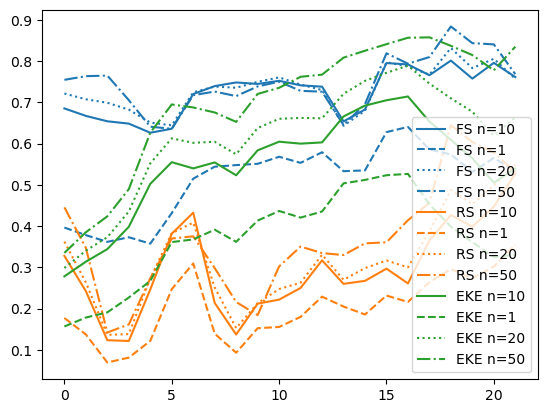

In [22]:
plt.plot(FScorr_n10[7:29],label = 'FS n=10', color = 'C0', linestyle = '-')
plt.plot(FScorr_n1[7:29],label = 'FS n=1', color = 'C0', linestyle = '--')
plt.plot(FScorr_n20[7:29],label = 'FS n=20', color = 'C0', linestyle = 'dotted')
plt.plot(FScorr_n50[7:29],label = 'FS n=50', color = 'C0', linestyle = '-.')

plt.plot(RScorr_n10[7:29],label = 'RS n=10', color = 'C1', linestyle = '-')
plt.plot(RScorr_n1[7:29],label = 'RS n=1', color = 'C1', linestyle = '--')
plt.plot(RScorr_n20[7:29],label = 'RS n=20', color = 'C1', linestyle = 'dotted')
plt.plot(RScorr_n50[7:29],label = 'RS n=50', color = 'C1', linestyle = '-.')

plt.plot(EKEcorr_n10[7:29],label = 'EKE n=10', color = 'C2', linestyle = '-')
plt.plot(EKEcorr_n1[7:29],label = 'EKE n=1', color = 'C2', linestyle = '--')
plt.plot(EKEcorr_n20[7:29],label = 'EKE n=20', color = 'C2', linestyle = 'dotted')
plt.plot(EKEcorr_n50[7:29],label = 'EKE n=50', color = 'C2', linestyle = '-.')

plt.legend()
print(np.mean(FScorr_n1[7:29]))
print(np.mean(FScorr_n5[7:29]))
print(np.mean(FScorr_n10[7:29]))
print(np.mean(FScorr_n20[7:29]))
print(np.mean(FScorr_n50[7:29]))

print(np.mean(RScorr_n1[7:29]))
print(np.mean(RScorr_n5[7:29]))
print(np.mean(RScorr_n10[7:29]))
print(np.mean(RScorr_n20[7:29]))
print(np.mean(RScorr_n50[7:29]))

print(np.mean(EKEcorr_n1[7:29]))
print(np.mean(EKEcorr_n5[7:29]))
print(np.mean(EKEcorr_n10[7:29]))
print(np.mean(EKEcorr_n20[7:29]))
print(np.mean(EKEcorr_n50[7:29]))


# REPEAT FOR CONSTANT CIRCUMPOLAR UPWELLING ARM 

In [29]:
eddy_notcumsum

array([ 6281.11119916, -5561.6218688 ,  7905.56463403, ...,
        4075.73617913, -2646.87540604,  5346.49333567])

In [75]:
N_combined_E = np.append(np.flip(N2)[1:],N)
t_combined_E = np.append(np.flip(t2)[1:],t)

In [76]:
t_combined_E


array([-0.98597782, -0.98060091, -0.97547352, ..., -1.0983239 ,
       -1.10834715, -1.11952893])

In [77]:
len(corr)

1646

In [95]:
import scipy.stats as ss
pval = ss.t.sf(np.abs(t_combined_E), N_combined_E -1)*2
sig = np.zeros(len(t_combined_E))*np.nan
sig[abs(pval) < 0.001]=1


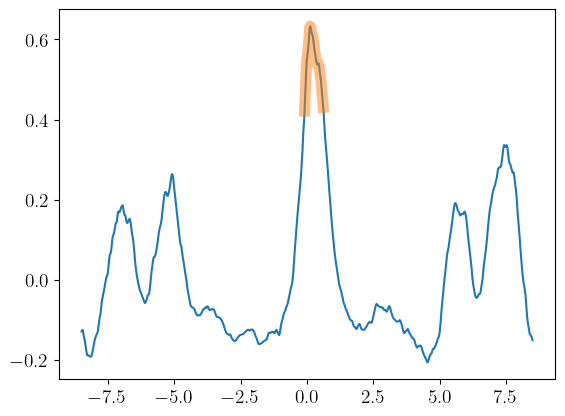

In [96]:
plt.plot(distance_combined,corr_combined_E)
plt.plot(distance_combined,(corr_combined_E*sig), linewidth = 8, alpha = 0.5)

In [97]:
distance_combined[np.nanargmin((corr_combined_E*sig))]


-0.092195900390625

In [98]:
distance_combined[np.nanargmax((corr_combined_E*sig*0+np.arange(len(sig))))]


0.6109530141601562

^^ this is robust for SSH<-0.5m. At lower SSH, DP has a strong southward transport due to the massive bend (and everywhere else not much) this makes the correlation neg?ative

Form stress, on the other hand, has a good and significant correlation at ALL contours

In [25]:
plt.rc('text', usetex=True)
plt.rcParams.update({'font.size': 14})


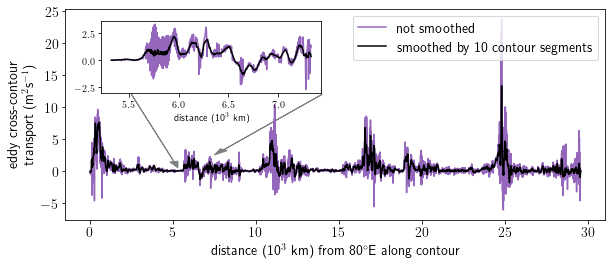

In [51]:
N=10
j_contour ='L'
rhoslice = slice(1032.2,1032.5)
if contour_dict[j_contour]['shifted']==True:
    suffix = '_shiftedback'
else:
    suffix = ''
vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy

eddy_notcumsum = -(vh_eddy).sel(isopycnal_bins=rhoslice).sum('isopycnal_bins')
y = uniform_filter1d(eddy_notcumsum, size=N)
fig, ax = plt.subplots(figsize = (10,4))
#ax = fig.add_axes([0,0,1,1])
distance = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_distance_along_contour.nc').distance
segment_length = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_segment_length'+suffix+'.nc').segment_length

ax.plot(distance,eddy_notcumsum/segment_length, color = 'C4', label = 'not smoothed')
ax.plot(distance,y/segment_length.values, color = 'k', label = 'smoothed by 10 contour segments')
ax.legend(loc = 'upper right')
ax.set_xlabel('distance (10$^3$ km) from 80$^\circ$E along contour')
ax.set_ylabel('eddy cross-contour \n transport (m$^2$s$^{-1}$)')
ax.set_title('')
ax_inset = fig.add_axes([0.2,0.59,0.305,0.25])
ax_inset.plot(distance[1000:1400],eddy_notcumsum[1000:1400]/segment_length[1000:1400], color = 'C4', label = 'not smoothed')
ax_inset.plot(distance[1000:1400],y[1000:1400]/segment_length.values[1000:1400], color = 'k', label = 'smoothed by 10 contour segments')
ax_inset.set_xlabel('distance (10$^3$ km)', fontsize = 10)
ax_inset.tick_params(axis='x', labelsize= 10)
ax_inset.tick_params(axis='y', labelsize= 10)


# ax.annotate('Kerguelen \n Plateau', xy=(0.08, 0.70), xytext=(0.08, 0.8), xycoords='axes fraction', 
#             fontsize=14, ha='center', va='bottom',
#             #bbox=dict(boxstyle='square', fc='white'),
#             arrowprops=dict(arrowstyle='-[, widthB=3.0, lengthB=1', lw=2.0, color = 'grey'))
# ax.annotate('Maquarie \n Ridge', xy=(0.27, 0.70), xytext=(0.27, 0.8), xycoords='axes fraction', 
#             fontsize=14, ha='center', va='bottom',
#             #bbox=dict(boxstyle='square', fc='white'),
#             arrowprops=dict(arrowstyle='-[, widthB=3.5, lengthB=1', lw=2.0, color = 'grey'))
# ax.annotate('Pacific-Antartic \n Ridge', xy=(0.40, 0.70), xytext=(0.4, 0.8), xycoords='axes fraction', 
#             fontsize=14, ha='center', va='bottom',
#             #bbox=dict(boxstyle='square', fc='white'),
#             arrowprops=dict(arrowstyle='-[, widthB=3.0, lengthB=1', lw=2.0, color = 'grey'))
# ax.annotate('Drake \n Passage', xy=(0.6, 0.70), xytext=(0.6, 0.8), xycoords='axes fraction', 
#             fontsize=14, ha='center', va='bottom',
#             #bbox=dict(boxstyle='square', fc='white'),
#             arrowprops=dict(arrowstyle='-[, widthB=4.5, lengthB=1', lw=2.0, color = 'grey'))
# ax.annotate('Southwest \n Indian Ridge', xy=(0.8, 0.70), xytext=(0.8, 0.8), xycoords='axes fraction', 
#             fontsize=14, ha='center', va='bottom',
#             #bbox=dict(boxstyle='square', fc='white'),
#             arrowprops=dict(arrowstyle='-[, widthB=3, lengthB=1', lw=2.0, color = 'grey'))
ax.arrow(2.5,12,2.8,-11.5, color = 'grey', head_length = 1, head_width = 0.5, length_includes_head = True)
ax.arrow(14,12,-6.5,-9.5, color = 'grey', head_length = 1, head_width = 0.5, length_includes_head = True)

fig.subplots_adjust(bottom = 0.15, left = 0.15)
fig.savefig('rotationalcontour.png',dpi = 400)

In [19]:
def compute_corr_FRS(hotspot,j_contour,rhoslice):
    N=10
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
    else:
        suffix = ''
    vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lat_along_contour
    lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lon_along_contour
    Form_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').Form_contour
    EKE_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').EKE_contour
    Reynolds_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').Reynolds_contour
    #top_rho1_max_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').top_rho1_max_contour
    #bottom_rho1_min_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').bottom_rho1_min_contour
    # mask out water that touches surface or bottom
#     mask = True
#     if mask ==True:
#         isopycnal_bin_contour = vh_eddy*0+vh_eddy.isopycnal_bins
#         vh_eddy= vh_eddy.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
#         Form_contour= Form_contour.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
#         Reynolds_contour= Reynolds_contour.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
#         EKE_contour= EKE_contour.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
    # smooth by N running average

    eddy_notcumsum = (vh_eddy).sel(isopycnal_bins=rhoslice).sum('isopycnal_bins')
    y = uniform_filter1d(eddy_notcumsum, size=N)
    Form_smoothed = uniform_filter1d(Form_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins'), size=N)
    Reynolds_smoothed = uniform_filter1d(Reynolds_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins'), size=N)
    EKE_smoothed = EKE_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins').values
    # load values at hotpots, scaled by max value
    if hotspot == 'KP':
        lower_index1, upper_index1 = find_lower_upper_indices('KP1', j_contour)
        lower_index2, upper_index2 = find_lower_upper_indices('KP2', j_contour)
        z_hot = np.append(-(y)[lower_index1:upper_index1],-(y)[lower_index2:upper_index2])
        z_scaled = z_hot/np.max(z_hot)
        Form_hot = np.append((Form_smoothed)[lower_index1:upper_index1],(Form_smoothed)[lower_index2:upper_index2])
        Form_scaled = Form_hot/np.max(Form_hot)
        Reynolds_hot = np.append((Reynolds_smoothed)[lower_index1:upper_index1],(Reynolds_smoothed)[lower_index2:upper_index2])
        Reynolds_scaled = Reynolds_hot/np.max(Reynolds_hot)
        EKE_hot = np.append((EKE_smoothed)[lower_index1:upper_index1],(EKE_smoothed)[lower_index2:upper_index2])
        EKE_scaled = EKE_hot/np.max(EKE_hot)
    else:
        lower_index, upper_index = find_lower_upper_indices(hotspot, j_contour)
        z_hot = -(y)[lower_index:upper_index]
        z_scaled = z_hot/np.max(z_hot)
        Form_hot = (Form_smoothed)[lower_index:upper_index]
        Form_scaled = Form_hot/np.max(Form_hot)
        Reynolds_hot = (Reynolds_smoothed)[lower_index:upper_index]
        Reynolds_scaled = Reynolds_hot/np.max(Reynolds_hot)
        EKE_hot = (EKE_smoothed)[lower_index:upper_index]
        EKE_scaled = EKE_hot/np.max(EKE_hot)
        
    #compute correlations and combine negative and positive lags
    c_cor = Compute_Correlation(z_scaled, Form_scaled)
    c_cor2 = Compute_Correlation(Form_scaled,z_scaled)
    corr,sig,t,N = c_cor.cor_series()
    print(max(t))
    print(min(N), max(N))
    corr2,sig2,t2,N2 = c_cor2.cor_series()
    corr_combined_F = np.append(np.flip(corr2[1:]),corr)
    sig_combined_F = np.append(np.flip(sig2[1:]),sig)

    c_cor = Compute_Correlation(z_scaled, Reynolds_scaled)
    c_cor2 = Compute_Correlation(Reynolds_scaled,z_scaled)
    corr,sig,t,N = c_cor.cor_series()
    print(max(t))
    print(min(N),max(N))
    corr2,sig2,t2,N2 = c_cor2.cor_series()
    corr_combined_R = np.append(np.flip(corr2[1:]),corr)
    sig_combined_R = np.append(np.flip(sig2[1:]),sig)

    c_cor = Compute_Correlation(z_scaled,EKE_scaled)
    c_cor2 = Compute_Correlation(EKE_scaled,z_scaled)
    corr,sig,t,N = c_cor.cor_series()
    print(max(t))
    print(min(N),max(N))
    corr2,sig2,t2,N2 = c_cor2.cor_series()
    corr_combined_E = np.append(np.flip(corr2[1:]),corr)
    sig_combined_E = np.append(np.flip(sig2[1:]),sig)
    
    distance_h = distance(hotspot,j_contour)
    distance_small = distance_h[0:int((len(corr_combined_F)+1)/2)]
    distance_combined = np.append(-np.flip(distance_small)[:-1],distance_small)
    
    return z_hot, Form_hot, Reynolds_hot, EKE_hot, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E, distance_h, distance_combined


In [29]:
def compute_corr_PAR_phiBT(BT,rhoslice):
    N=10
    vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/PAR/phiBT'+str(BT)+'_vh_eddy.nc').vh_eddy
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/PAR/phiBT'+str(BT)+'_latlon.nc').lat_along_contour
    lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/PAR/phiBT'+str(BT)+'_latlon.nc').lon_along_contour
    Form_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/PAR/phiBT'+str(BT)+'_contour_energies.nc').Form_contour
    EKE_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/PAR/phiBT'+str(BT)+'_contour_energies.nc').EKE_contour
    Reynolds_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/PAR/phiBT'+str(BT)+'_contour_energies.nc').Reynolds_contour
    #top_rho1_max_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').top_rho1_max_contour
    #bottom_rho1_min_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').bottom_rho1_min_contour
    # mask out water that touches surface or bottom
    mask = False
    if mask ==True:
        isopycnal_bin_contour = vh_eddy*0+vh_eddy.isopycnal_bins
        vh_eddy= vh_eddy.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
        Form_contour= Form_contour.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
        Reynolds_contour= Reynolds_contour.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
        EKE_contour= EKE_contour.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
    # smooth by N running average

    eddy_notcumsum = (vh_eddy).sel(isopycnal_bins=rhoslice).sum('isopycnal_bins')
    y = uniform_filter1d(eddy_notcumsum, size=N)
    Form_smoothed = uniform_filter1d(Form_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins'), size=N)
    Reynolds_smoothed = uniform_filter1d(Reynolds_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins'), size=N)
    EKE_smoothed = EKE_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins').values
    # load values at hotpots, scaled by max value
    lower_index, upper_index = find_lower_upper_indices_PARphiBT('PAR', BT)
    z_hot = -(y)[lower_index:upper_index]
    z_scaled = z_hot/np.max(z_hot)
    Form_hot = (Form_smoothed)[lower_index:upper_index]
    Form_scaled = Form_hot/np.max(Form_hot)
    Reynolds_hot = (Reynolds_smoothed)[lower_index:upper_index]
    Reynolds_scaled = Reynolds_hot/np.max(Reynolds_hot)
    EKE_hot = (EKE_smoothed)[lower_index:upper_index]
    EKE_scaled = EKE_hot/np.max(EKE_hot)
        
    #compute correlations and combine negative and positive lags
    c_cor = Compute_Correlation(z_scaled, Form_scaled)
    c_cor2 = Compute_Correlation(Form_scaled,z_scaled)
    corr,sig,t,N = c_cor.cor_series()
    print(max(t))
    print(min(N), max(N))
    corr2,sig2,t2,N2 = c_cor2.cor_series()
    corr_combined_F = np.append(np.flip(corr2[1:]),corr)
    sig_combined_F = np.append(np.flip(sig2[1:]),sig)

    c_cor = Compute_Correlation(z_scaled, Reynolds_scaled)
    c_cor2 = Compute_Correlation(Reynolds_scaled,z_scaled)
    corr,sig,t,N = c_cor.cor_series()
    print(max(t))
    print(min(N),max(N))
    corr2,sig2,t2,N2 = c_cor2.cor_series()
    corr_combined_R = np.append(np.flip(corr2[1:]),corr)
    sig_combined_R = np.append(np.flip(sig2[1:]),sig)

    c_cor = Compute_Correlation(z_scaled,EKE_scaled)
    c_cor2 = Compute_Correlation(EKE_scaled,z_scaled)
    corr,sig,t,N = c_cor.cor_series()
    print(max(t))
    print(min(N),max(N))
    corr2,sig2,t2,N2 = c_cor2.cor_series()
    corr_combined_E = np.append(np.flip(corr2[1:]),corr)
    sig_combined_E = np.append(np.flip(sig2[1:]),sig)
    
    #distance_combined = xr.open_dataset('/g/data/x77/cy8964/Post_Process/PAR/phi_BT'+str(BT)+'_distance_along_contour.nc').distance
    
    return z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E


In [31]:
def find_lower_upper_indices_PARphiBT(hotspot, BT):
    vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/PAR/phiBT'+str(BT)+'_vh_eddy.nc').vh_eddy
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/PAR/phiBT'+str(BT)+'_latlon.nc').lat_along_contour
    lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/PAR/phiBT'+str(BT)+'_latlon.nc').lon_along_contour
    
    for i in np.arange(0,len(lon_along_contour)):
        if lon_along_contour[i]>hotspot_dict[hotspot]['lower_lon']:
            lower_index = i
            break
    for i in np.arange(0,len(lon_along_contour)):
        if lon_along_contour[i]<hotspot_dict[hotspot]['upper_lon']:
            upper_index = i
        elif lon_along_contour[i]>hotspot_dict[hotspot]['upper_lon']:
            break

    return lower_index, upper_index



In [19]:
def find_TFRE_along_contour(hotspot,j_contour,rho):
    N=20
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
    else:
        suffix = ''
    vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lat_along_contour
    lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lon_along_contour
    Form_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').Form_contour
    EKE_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').EKE_contour
    Reynolds_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').Reynolds_contour
    # smooth by N running average
    eddy_notcumsum = (vh_eddy).sel(isopycnal_bins=rho)
    y = uniform_filter1d(eddy_notcumsum.fillna(0), size=N)
    Form_smoothed = uniform_filter1d(Form_contour.sel(isopycnal_bins = rho).fillna(0), size=N)
    Reynolds_smoothed = uniform_filter1d(Reynolds_contour.sel(isopycnal_bins = rho).fillna(0), size=N)
    EKE_smoothed = uniform_filter1d(EKE_contour.sel(isopycnal_bins = rho).fillna(0), size=N)
    # load values at hotpots, scaled by max value
    if hotspot == 'KP':
        lower_index1, upper_index1 = find_lower_upper_indices('KP1', j_contour)
        lower_index2, upper_index2 = find_lower_upper_indices('KP2', j_contour)
        z_hot = np.append(-(y)[lower_index1:upper_index1],-(y)[lower_index2:upper_index2])
        Form_hot = np.append((Form_smoothed)[lower_index1:upper_index1],(Form_smoothed)[lower_index2:upper_index2])
        Reynolds_hot = np.append((Reynolds_smoothed)[lower_index1:upper_index1],(Reynolds_smoothed)[lower_index2:upper_index2])
        EKE_hot = np.append((EKE_smoothed)[lower_index1:upper_index1],(EKE_smoothed)[lower_index2:upper_index2])
    else:
        lower_index, upper_index = find_lower_upper_indices(hotspot, j_contour)
        z_hot = -(y)[lower_index:upper_index]
        Form_hot = (Form_smoothed)[lower_index:upper_index]
        Reynolds_hot = (Reynolds_smoothed)[lower_index:upper_index]
        EKE_hot = (EKE_smoothed)[lower_index:upper_index]
    return z_hot, Form_hot, Reynolds_hot, EKE_hot

In [19]:
def find_mean_TFRS_contour(hotspot, rho):
    mean_T = np.zeros(29)
    mean_FS = np.zeros(29)
    mean_RS = np.zeros(29)
    mean_EKE= np.zeros(29)
    
    for i in np.arange(29):
        j_contour = np.array(['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'])[i]
        z_hot, Form_hot, Reynolds_hot, EKE_hot = find_TFRE_along_contour(hotspot,j_contour,rho)
        mean_T[i] = np.mean(z_hot)
        mean_FS[i] = np.mean(Form_hot)
        mean_RS[i] = np.mean(Reynolds_hot)
        mean_EKE[i] = np.mean(EKE_hot)
        
    return mean_T, mean_FS, mean_RS, mean_EKE


A
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
P
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
B
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
Q
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
C
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
R
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
D
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
S
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
E
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
T
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
F
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
U
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
2

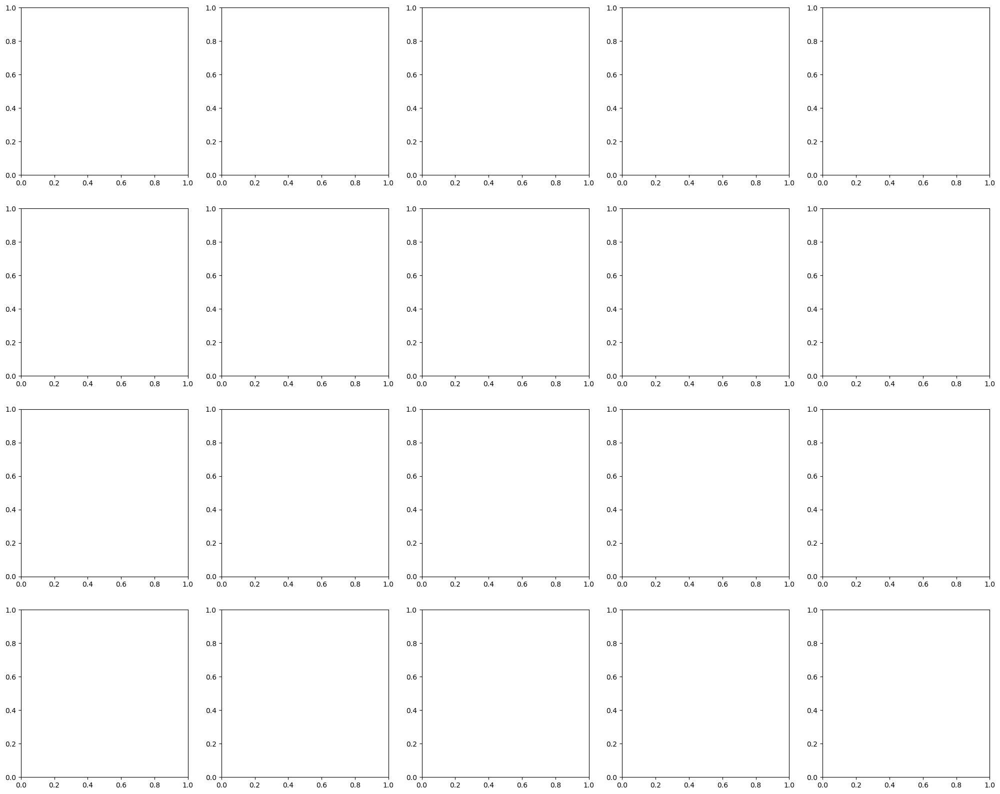

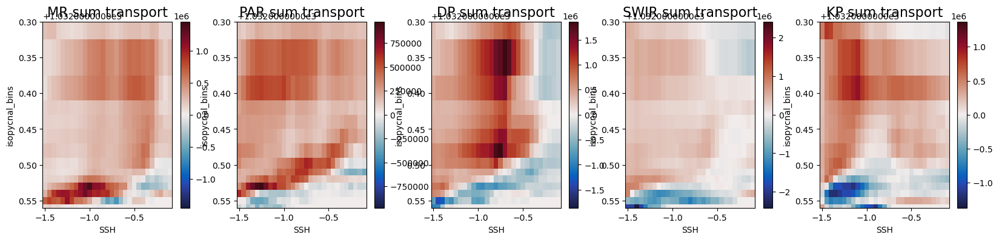

In [22]:
%%time
#10 degrees bigger on either side
#10 degrees bigger on either side, but no overlap
hotspot_dict = OrderedDict([
('PAR',  {'lower_lon':-165,'upper_lon':-100}),
('SWIR',  {'lower_lon':5,'upper_lon':55}),
('DP',  {'lower_lon':-80,'upper_lon':5}),
('MR',  {'lower_lon':-230,'upper_lon':-165}),
('KP1',  {'lower_lon':55,'upper_lon':80}),
('KP2',{'lower_lon':-280,'upper_lon':-230})])#-260
SSHs = np.arange(-0.1,-1.55,-0.05)
densities = 1000+ np.array([1,28,29,30,31,31.5,31.9,32,32.1,32.2,32.25,32.3,
                                        32.35,32.4,32.42,32.44,32.46,32.48,32.50,32.51,
                                        32.52,32.53,32.54,32.55,32.56,32.58,32.6,32.8,33,34,45])
sum_T_array = xr.DataArray(np.zeros((5,31,29)),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP']), densities, SSHs],
                                      dims = ['hotspot', 'isopycnal_bins', 'SSH'],
                                      name = 'sum_T_array')
sum_T_array_masked = xr.DataArray(np.zeros((5,31,29)),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP']), densities, SSHs],
                                      dims = ['hotspot', 'isopycnal_bins', 'SSH'],
                                      name = 'sum_T_array_masked')
# distance_array = xr.DataArray(np.zeros((5,31,29)),
#                                       coords = [np.array(['MR','PAR','DP','SWIR','KP']), densities, SSHs],
#                                       dims = ['hotspot', 'isopycnal_bins', 'SSH'],
#                                       name = 'distance_array')

density_mesh = np.append((densities + np.roll(densities,1))/2,46)
fig, axes = plt.subplots(nrows = 4, ncols = 5, figsize = (25,20))
for k in np.arange(0,29):
    j_contour = np.array(['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'])[k]
    print(j_contour)
    N=10
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
    else:
        suffix = ''
    vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lat_along_contour
    lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lon_along_contour
    isopycnal_bin_contour = vh_eddy*0+vh_eddy.isopycnal_bins
    top_rho1_max_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').top_rho1_max_contour
    bottom_rho1_min_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').bottom_rho1_min_contour
    vh_eddy_masked= vh_eddy.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
    for i in np.arange(31):
        print(i)
        rho = densities[i]
        eddy_notcumsum = (vh_eddy).sel(isopycnal_bins=rho)
        eddy_notcumsum_masked = (vh_eddy_masked).sel(isopycnal_bins=rho)
        y = uniform_filter1d(eddy_notcumsum.fillna(0), size=N)
        y_masked = uniform_filter1d(eddy_notcumsum_masked.fillna(0), size=N)
        
        for j in np.arange(5):
            hotspot = ['MR','PAR','DP','SWIR','KP'][j]

            # load values at hotpots, scaled by max value
            if hotspot == 'KP':
                lower_index1, upper_index1 = find_lower_upper_indices('KP1', j_contour)
                lower_index2, upper_index2 = find_lower_upper_indices('KP2', j_contour)
                z_hot = np.append(-(y)[lower_index1:upper_index1],-(y)[lower_index2:upper_index2])
                z_hot_masked = np.append(-(y_masked)[lower_index1:upper_index1],-(y_masked)[lower_index2:upper_index2])
            else:
                lower_index, upper_index = find_lower_upper_indices(hotspot, j_contour)
                z_hot = -(y)[lower_index:upper_index]
                z_hot_masked = -(y_masked)[lower_index:upper_index]

            sum_T = np.sum(z_hot)
            sum_T_masked = np.sum(z_hot_masked)
            sum_T_array[j,i,k] = sum_T
            sum_T_array_masked[j,i,k] = sum_T_masked
            
save_dir = '/g/data/x77/cy8964/Post_Process/New_SO/'
ds = xr.Dataset({'sum_T_array': sum_T_array,'sum_T_array_masked': sum_T_array_masked})
ds.to_netcdf(save_dir+'sum_TD_over_hotspots_notoverlapping.nc')
            
fig,axes = plt.subplots(nrows = 1, ncols = 5, figsize = (20,4))          
for j in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][j]
    p1 = sum_T_array_masked.sel(hotspot = hotspot).plot(ax = axes[j],cmap = cm.cm.balance, add_colorbar = False)
    plt.colorbar(p1, ax = axes[j])
    axes[j].set_ylim(1032.56,1032.3)
    axes[j].set_title(hotspot+' sum transport', fontsize = 16)

    


A
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
P
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
B
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
Q
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
C
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
R
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
D
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
S
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
E
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
T
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
F
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
U
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
2

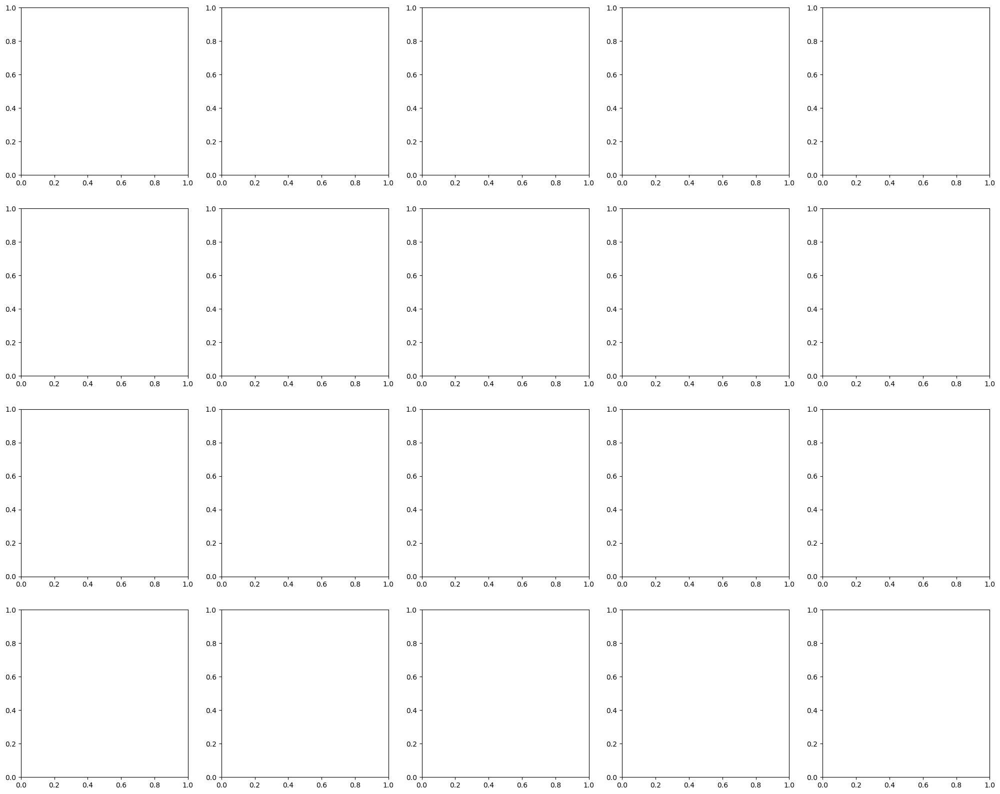

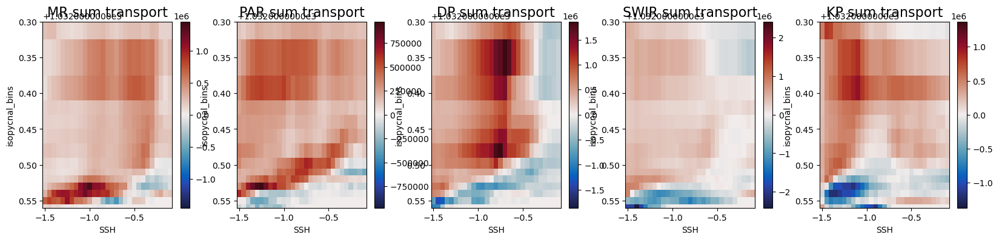

In [22]:
%%time
#10 degrees bigger on either side
#10 degrees bigger on either side, but no overlap
hotspot_dict = OrderedDict([
('PAR',  {'lower_lon':-165,'upper_lon':-100}),
('SWIR',  {'lower_lon':5,'upper_lon':55}),
('DP',  {'lower_lon':-80,'upper_lon':5}),
('MR',  {'lower_lon':-230,'upper_lon':-165}),
('KP1',  {'lower_lon':55,'upper_lon':80}),
('KP2',{'lower_lon':-280,'upper_lon':-230})])#-260
SSHs = np.arange(-0.1,-1.55,-0.05)
densities = 1000+ np.array([1,28,29,30,31,31.5,31.9,32,32.1,32.2,32.25,32.3,
                                        32.35,32.4,32.42,32.44,32.46,32.48,32.50,32.51,
                                        32.52,32.53,32.54,32.55,32.56,32.58,32.6,32.8,33,34,45])
sum_T_array = xr.DataArray(np.zeros((5,31,29)),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP']), densities, SSHs],
                                      dims = ['hotspot', 'isopycnal_bins', 'SSH'],
                                      name = 'sum_T_array')
sum_T_array_masked = xr.DataArray(np.zeros((5,31,29)),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP']), densities, SSHs],
                                      dims = ['hotspot', 'isopycnal_bins', 'SSH'],
                                      name = 'sum_T_array_masked')
# distance_array = xr.DataArray(np.zeros((5,31,29)),
#                                       coords = [np.array(['MR','PAR','DP','SWIR','KP']), densities, SSHs],
#                                       dims = ['hotspot', 'isopycnal_bins', 'SSH'],
#                                       name = 'distance_array')

density_mesh = np.append((densities + np.roll(densities,1))/2,46)
fig, axes = plt.subplots(nrows = 4, ncols = 5, figsize = (25,20))
for k in np.arange(0,29):
    j_contour = np.array(['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'])[k]
    print(j_contour)
    N=10
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
    else:
        suffix = ''
    vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lat_along_contour
    lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lon_along_contour
    isopycnal_bin_contour = vh_eddy*0+vh_eddy.isopycnal_bins
    top_rho1_max_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').top_rho1_max_contour
    bottom_rho1_min_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').bottom_rho1_min_contour
    vh_eddy_masked= vh_eddy.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
    for i in np.arange(31):
        print(i)
        rho = densities[i]
        eddy_notcumsum = (vh_eddy).sel(isopycnal_bins=rho)
        eddy_notcumsum_masked = (vh_eddy_masked).sel(isopycnal_bins=rho)
        y = uniform_filter1d(eddy_notcumsum.fillna(0), size=N)
        y_masked = uniform_filter1d(eddy_notcumsum_masked.fillna(0), size=N)
        
        for j in np.arange(5):
            hotspot = ['MR','PAR','DP','SWIR','KP'][j]

            # load values at hotpots, scaled by max value
            if hotspot == 'KP':
                lower_index1, upper_index1 = find_lower_upper_indices('KP1', j_contour)
                lower_index2, upper_index2 = find_lower_upper_indices('KP2', j_contour)
                z_hot = np.append(-(y)[lower_index1:upper_index1],-(y)[lower_index2:upper_index2])
                z_hot_masked = np.append(-(y_masked)[lower_index1:upper_index1],-(y_masked)[lower_index2:upper_index2])
            else:
                lower_index, upper_index = find_lower_upper_indices(hotspot, j_contour)
                z_hot = -(y)[lower_index:upper_index]
                z_hot_masked = -(y_masked)[lower_index:upper_index]

            sum_T = np.sum(z_hot)
            sum_T_masked = np.sum(z_hot_masked)
            sum_T_array[j,i,k] = sum_T
            sum_T_array_masked[j,i,k] = sum_T_masked
            
save_dir = '/g/data/x77/cy8964/Post_Process/New_SO/'
ds = xr.Dataset({'sum_T_array': sum_T_array,'sum_T_array_masked': sum_T_array_masked})
ds.to_netcdf(save_dir+'sum_TD_over_hotspots_notoverlapping.nc')
            
fig,axes = plt.subplots(nrows = 1, ncols = 5, figsize = (20,4))          
for j in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][j]
    p1 = sum_T_array_masked.sel(hotspot = hotspot).plot(ax = axes[j],cmap = cm.cm.balance, add_colorbar = False)
    plt.colorbar(p1, ax = axes[j])
    axes[j].set_ylim(1032.56,1032.3)
    axes[j].set_title(hotspot+' sum transport', fontsize = 16)

    


In [23]:
%%time
#10 degrees bigger on either side
#10 degrees bigger on either side, but no overlap
hotspot_dict = OrderedDict([
('PAR',  {'lower_lon':-165,'upper_lon':-100}),
('SWIR',  {'lower_lon':5,'upper_lon':55}),
('DP',  {'lower_lon':-80,'upper_lon':5}),
('MR',  {'lower_lon':-230,'upper_lon':-165}),
('KP1',  {'lower_lon':55,'upper_lon':80}),
('KP2',{'lower_lon':-280,'upper_lon':-230})])#-260
SSHs = np.arange(-0.1,-1.55,-0.05)
densities = 1000+ np.array([1,28,29,30,31,31.5,31.9,32,32.1,32.2,32.25,32.3,
                                        32.35,32.4,32.42,32.44,32.46,32.48,32.50,32.51,
                                        32.52,32.53,32.54,32.55,32.56,32.58,32.6,32.8,33,34,45])
sum_T_array = xr.DataArray(np.zeros((6,31,29)),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP','total']), densities, SSHs],
                                      dims = ['hotspot', 'isopycnal_bins', 'SSH'],
                                      name = 'sum_T_array')
sum_T_array_masked = xr.DataArray(np.zeros((6,31,29)),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP','total']), densities, SSHs],
                                      dims = ['hotspot', 'isopycnal_bins', 'SSH'],
                                      name = 'sum_T_array_masked')
# distance_array = xr.DataArray(np.zeros((5,31,29)),
#                                       coords = [np.array(['MR','PAR','DP','SWIR','KP']), densities, SSHs],
#                                       dims = ['hotspot', 'isopycnal_bins', 'SSH'],
#                                       name = 'distance_array')

density_mesh = np.append((densities + np.roll(densities,1))/2,46)
for k in np.arange(0,29):
    j_contour = np.array(['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'])[k]
    print(j_contour)
    N=10
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
    else:
        suffix = ''
    vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lat_along_contour
    lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lon_along_contour
    isopycnal_bin_contour = vh_eddy*0+vh_eddy.isopycnal_bins
    top_rho1_max_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').top_rho1_max_contour
    bottom_rho1_min_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').bottom_rho1_min_contour
    vh_eddy_masked= vh_eddy.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
    for i in np.arange(31):
        print(i)
        rho = densities[i]
        eddy_notcumsum = (vh_eddy).sel(isopycnal_bins=rho)
        eddy_notcumsum_masked = (vh_eddy_masked).sel(isopycnal_bins=rho)
        y = uniform_filter1d(eddy_notcumsum.fillna(0), size=N)
        y_masked = uniform_filter1d(eddy_notcumsum_masked.fillna(0), size=N)
        
#         for j in np.arange(5):
#             hotspot = ['MR','PAR','DP','SWIR','KP'][j]

#             # load values at hotpots, scaled by max value
#             if hotspot == 'KP':
#                 lower_index1, upper_index1 = find_lower_upper_indices('KP1', j_contour)
#                 lower_index2, upper_index2 = find_lower_upper_indices('KP2', j_contour)
#                 z_hot = np.append(-(y)[lower_index1:upper_index1],-(y)[lower_index2:upper_index2])
#                 z_hot_masked = np.append(-(y_masked)[lower_index1:upper_index1],-(y_masked)[lower_index2:upper_index2])
#             else:
#                 lower_index, upper_index = find_lower_upper_indices(hotspot, j_contour)
#                 z_hot = -(y)[lower_index:upper_index]
#                 z_hot_masked = -(y_masked)[lower_index:upper_index]

#             sum_T = np.sum(z_hot)
#             sum_T_masked = np.sum(z_hot_masked)
#             sum_T_array[j,i,k] = sum_T
#             sum_T_array_masked[j,i,k] = sum_T_masked
        sum_T = np.sum(-y)
        sum_T_masked = np.sum(-y_masked)
        sum_T_array[5,i,k] = sum_T
        sum_T_array_masked[5,i,k] = sum_T_masked
        
            
save_dir = '/g/data/x77/cy8964/Post_Process/New_SO/'
ds = xr.Dataset({'sum_T_array': sum_T_array,'sum_T_array_masked': sum_T_array_masked})
ds.to_netcdf(save_dir+'sum_TD_total.nc')
            
# fig,axes = plt.subplots(nrows = 1, ncols = 5, figsize = (20,4))          
# for j in np.arange(5):
#     hotspot = ['MR','PAR','DP','SWIR','KP'][j]
#     p1 = sum_T_array_masked.sel(hotspot = hotspot).plot(ax = axes[j],cmap = cm.cm.balance, add_colorbar = False)
#     plt.colorbar(p1, ax = axes[j])
#     axes[j].set_ylim(1032.56,1032.3)
#     axes[j].set_title(hotspot+' sum transport', fontsize = 16)

    


A
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
P
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
B
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
Q
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
C
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
R
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
D
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
S
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
E
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
T
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
F
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
U
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
2

In [111]:
%%time
#10 degrees bigger on either side
#10 degrees bigger on either side, but no overlap
hotspot_dict = OrderedDict([
('PAR',  {'lower_lon':-165,'upper_lon':-100}),
('SWIR',  {'lower_lon':5,'upper_lon':55}),
('DP',  {'lower_lon':-80,'upper_lon':5}),
('MR',  {'lower_lon':-230,'upper_lon':-165}),
('KP1',  {'lower_lon':55,'upper_lon':80}),
('KP2',{'lower_lon':-280,'upper_lon':-230})])#-260
SSHs = np.arange(-0.1,-1.55,-0.05)
densities = 1000+ np.array([1,28,29,30,31,31.5,31.9,32,32.1,32.2,32.25,32.3,
                                        32.35,32.4,32.42,32.44,32.46,32.48,32.50,32.51,
                                        32.52,32.53,32.54,32.55,32.56,32.58,32.6,32.8,33,34,45])
top_rho = xr.DataArray(np.zeros((6,31,29)),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP','total']), densities, SSHs],
                                      dims = ['hotspot', 'isopycnal_bins', 'SSH'],
                                      name = 'top_rho')
bottom_rho = xr.DataArray(np.zeros((6,31,29)),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP','total']), densities, SSHs],
                                      dims = ['hotspot', 'isopycnal_bins', 'SSH'],
                                      name = 'bottom_rho')
h_array = xr.DataArray(np.zeros((6,31,29)),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP','total']), densities, SSHs],
                                      dims = ['hotspot', 'isopycnal_bins', 'SSH'],
                                      name = 'h')

density_mesh = np.append((densities + np.roll(densities,1))/2,46)
for k in np.arange(0,29):
    j_contour = np.array(['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'])[k]
    print(j_contour)
    N=10
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
    else:
        suffix = ''
    #vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lat_along_contour
    lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lon_along_contour
    isopycnal_bin_contour = vh_eddy*0+vh_eddy.isopycnal_bins
    top_rho1_max_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').top_rho1_max_contour
    bottom_rho1_min_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').bottom_rho1_min_contour
    h_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_dzu_across_contour_binned.nc').dzu_across_contour_binned
    h_contour = h_contour.mean('time')
    #vh_eddy_masked= vh_eddy.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
    for i in np.arange(31):
        print(i)
        rho = densities[i]
        top_rho1_max_contour_i = top_rho1_max_contour#.sel(isopycnal_bins = rho)
        bottom_rho1_min_contour_i = bottom_rho1_min_contour#.sel(isopycnal_bins = rho)
        h_contour_i = h_contour.sel(isopycnal_bins = rho)
         
        for j in np.arange(5):
            hotspot = ['MR','PAR','DP','SWIR','KP'][j]

            # load values at hotpots, scaled by max value
            if hotspot == 'KP':
                lower_index1, upper_index1 = find_lower_upper_indices('KP1', j_contour)
                lower_index2, upper_index2 = find_lower_upper_indices('KP2', j_contour)
                top_rho_j = np.append((top_rho1_max_contour_i)[lower_index1:upper_index1],top_rho1_max_contour_i[lower_index2:upper_index2])
                bottom_rho_j = np.append(bottom_rho1_min_contour_i[lower_index1:upper_index1],bottom_rho1_min_contour_i[lower_index2:upper_index2])
                h_j = np.append(h_contour_i[lower_index1:upper_index1],h_contour_i[lower_index2:upper_index2])
                
            else:
                lower_index, upper_index = find_lower_upper_indices(hotspot, j_contour)
                top_rho_j = (top_rho1_max_contour_i)[lower_index:upper_index]
                bottom_rho_j = bottom_rho1_min_contour_i[lower_index:upper_index]
                h_j = h_contour_i[lower_index:upper_index]

            top_rho[j,i,k] = top_rho_j.mean()#.values
            bottom_rho[j,i,k] = bottom_rho_j.mean()#.values
            h_array[j,i,k] = h_j.mean()#.values
            
        top_rho[5,i,k] = top_rho1_max_contour_i.mean()#.values
        bottom_rho[5,i,k] = bottom_rho1_min_contour_i.mean()#.values
        h_array[5,i,k] = h_contour_i.mean()#.values
        
            
save_dir = '/g/data/x77/cy8964/Post_Process/New_SO/'
ds = xr.Dataset({'top_rho': top_rho,'bottom_rho': bottom_rho, 'h':h_array})
ds.to_netcdf(save_dir+'rho_and_h_on_contours.nc')
            
# fig,axes = plt.subplots(nrows = 1, ncols = 5, figsize = (20,4))          
# for j in np.arange(5):
#     hotspot = ['MR','PAR','DP','SWIR','KP'][j]
#     p1 = sum_T_array_masked.sel(hotspot = hotspot).plot(ax = axes[j],cmap = cm.cm.balance, add_colorbar = False)
#     plt.colorbar(p1, ax = axes[j])
#     axes[j].set_ylim(1032.56,1032.3)
#     axes[j].set_title(hotspot+' sum transport', fontsize = 16)

    


A
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
P
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
B
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
Q
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
C
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
R
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
D
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
S
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
E
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
T
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
F
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
U
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
2

A
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
P
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
B
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
Q
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
C
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
R
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
D
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
S
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
E
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
T
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
F
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
U
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
2

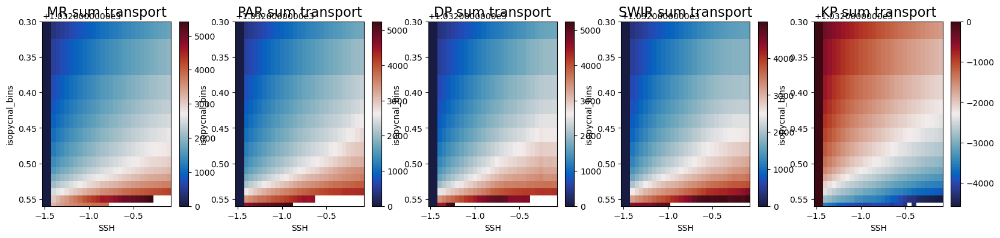

In [21]:
%%time
#save h along contours
hotspot_dict = OrderedDict([
('PAR',  {'lower_lon':-165,'upper_lon':-100}),
('SWIR',  {'lower_lon':5,'upper_lon':55}),
('DP',  {'lower_lon':-80,'upper_lon':5}),
('MR',  {'lower_lon':-230,'upper_lon':-165}),
('KP1',  {'lower_lon':55,'upper_lon':80}),
('KP2',{'lower_lon':-280,'upper_lon':-230})])#-260
SSHs = np.arange(-0.1,-1.55,-0.05)
densities = 1000+ np.array([1,28,29,30,31,31.5,31.9,32,32.1,32.2,32.25,32.3,
                                        32.35,32.4,32.42,32.44,32.46,32.48,32.50,32.51,
                                        32.52,32.53,32.54,32.55,32.56,32.58,32.6,32.8,33,34,45])
sum_T_array_masked = xr.DataArray(np.zeros((5,31,29)),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP']), densities, SSHs],
                                      dims = ['hotspot', 'isopycnal_bins', 'SSH'],
                                      name = 'sum_T_array_masked')

density_mesh = np.append((densities + np.roll(densities,1))/2,46)
for k in np.arange(0,27):
    j_contour = np.array(['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'])[k]
    print(j_contour)
    N=10
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
    else:
        suffix = ''
    h_0 = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_dzu_across_contour_binned.nc').dzu_across_contour_binned
    h_0 = h_0.cumsum('isopycnal_bins').mean('time')
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lat_along_contour
    lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lon_along_contour
    isopycnal_bin_contour = h_0*0+h_0.isopycnal_bins
    top_rho1_max_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').top_rho1_max_contour
    bottom_rho1_min_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').bottom_rho1_min_contour
    vh_eddy_masked= h_0.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour)#.fillna(0)
    for i in np.arange(31):
        print(i)
        rho = densities[i]
        eddy_notcumsum_masked = (vh_eddy_masked).sel(isopycnal_bins=rho)
        #y_masked = uniform_filter1d(eddy_notcumsum_masked.fillna(0), size=N)
        y_masked = eddy_notcumsum_masked.values
        for j in np.arange(5):
            hotspot = ['MR','PAR','DP','SWIR','KP'][j]

            # load values at hotpots, scaled by max value
            if hotspot == 'KP':
                lower_index1, upper_index1 = find_lower_upper_indices('KP1', j_contour)
                lower_index2, upper_index2 = find_lower_upper_indices('KP2', j_contour)
                z_hot_masked = np.append(-(y_masked)[lower_index1:upper_index1],-(y_masked)[lower_index2:upper_index2])
            else:
                lower_index, upper_index = find_lower_upper_indices(hotspot, j_contour)
                z_hot_masked = (y_masked)[lower_index:upper_index]

            sum_T_masked = np.nanmean(z_hot_masked)
            sum_T_array_masked[j,i,k] = sum_T_masked
            
save_dir = '/g/data/x77/cy8964/Post_Process/New_SO/'
ds = xr.Dataset({'mean_h_array_masked': sum_T_array_masked})
ds.to_netcdf(save_dir+'mean_h_over_hotspots_notoverlapping_nozerov2.nc')
            
fig,axes = plt.subplots(nrows = 1, ncols = 5, figsize = (20,4))          
for j in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][j]
    p1 = sum_T_array_masked.sel(hotspot = hotspot).plot(ax = axes[j],cmap = cm.cm.balance, add_colorbar = False)
    plt.colorbar(p1, ax = axes[j])
    axes[j].set_ylim(1032.56,1032.3)
    axes[j].set_title(hotspot+' sum transport', fontsize = 16)

    


save_dir = '/g/data/x77/cy8964/Post_Process/New_SO/'
ds = xr.Dataset({'mean_h_array_masked': sum_T_array_masked})
ds.to_netcdf(save_dir+'mean_h_over_hotspots_notoverlapping.nc')


save_dir = '/g/data/x77/cy8964/Post_Process/New_SO/'
ds = xr.Dataset({'sum_T_array': sum_T_array,'sum_T_array_masked': sum_T_array_masked,'distance_array': distance_array})
ds.to_netcdf(save_dir+'sum_TD_over_hotspots.nc')

In [87]:
sum_T_array=xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/sum_TD_over_hotspots_notoverlapping.nc').sum_T_array
sum_T_array_masked=xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/sum_TD_over_hotspots_notoverlapping.nc').sum_T_array_masked
depth_array=xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/mean_h_over_hotspots_notoverlapping_nozerov2.nc').mean_h_array_masked


In [88]:
sum_T_array_tot=xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/sum_TD_total.nc').sum_T_array.sel(hotspot = 'total')
sum_T_array_tot_masked=xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/sum_TD_total.nc').sum_T_array_masked.sel(hotspot = 'total')


In [89]:

top_rho = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/rho_and_h_on_contours.nc').top_rho
bottom_rho = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/rho_and_h_on_contours.nc').bottom_rho
h = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/rho_and_h_on_contours.nc').h


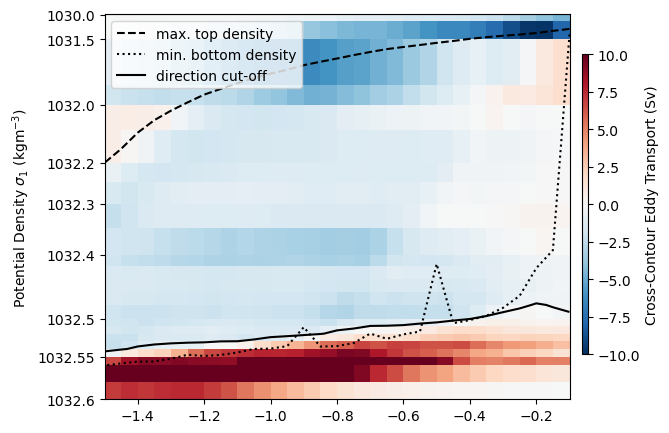

In [31]:
fig = plt.figure(figsize = (6,5))
ax0 = fig.add_subplot()
scfac = 20
p1 = ax0.pcolormesh(sum_T_array_tot.SSH, (sum_T_array_tot.sel(isopycnal_bins = slice(1024,1033)).isopycnal_bins.values-1024)**scfac,
                    (-sum_T_array_tot/1e6).sel(isopycnal_bins = slice(1024,1033)), cmap = 'RdBu_r', vmin = -10,vmax = 10)
rhos = np.array([1030,1031.5,1032,1032.2,1032.3, 1032.4,1032.5,1032.55,1032.6])
ax0.plot(sum_T_array.SSH, (top_rho.sel(hotspot = 'total').isel(isopycnal_bins = 0)-1024)**scfac, color = 'k', linestyle = '--', label = 'max. top density')
ax0.plot(sum_T_array.SSH, (bottom_rho.sel(hotspot = 'total').isel(isopycnal_bins = 0)-1024)**scfac,  color = 'k', linestyle = 'dotted', label = 'min. bottom density')
ax0.plot(sum_T_array.SSH, bottom_rho.sel(hotspot = 'total').isel(isopycnal_bins = 0)-1024,  color = 'k', linestyle = '-', label = 'direction cut-off')
#ax0.hlines(8.2**scfac,-1.5,-0.1,  color = 'grey', linestyle = '-.', label = 'circumpolar up. arm')
#ax0.hlines(8.5**scfac,-1.5,-0.1,  color = 'grey', linestyle = '-.')
#ax0.text(-1.4,8.25**scfac,'circumpolar upwelling arm', color = 'grey')
ax0.set_yticks((rhos-1024)**scfac)
ax0.set_yticklabels(rhos)
ax0.set_ylim(8.6**scfac,5**scfac)
ax_cb = plt.axes([0.92, 0.2, 0.01, 0.6])
fig.colorbar(p1, cax = ax_cb, label = 'Cross-Contour Eddy Transport (Sv)')
ax0.set_ylabel('Potential Density $\sigma_1$ (kgm$^{-3}$)')
mask = sum_T_array_tot.sel(isopycnal_bins = slice(1032.4,1032.57))
ax0.contour(mask.SSH, (mask.isopycnal_bins.values-1024)**scfac, mask, levels = [0.5], colors = 'k', linewidths = 1.5, label = 'bottom water')
ax0.legend(loc = 'upper left', fontsize = 10)


In [90]:
plt.rc('text', usetex=True)
plt.rcParams.update({'font.size': 13})

In [23]:
plt.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]

MR -0.9000000000000002
PAR -1.2500000000000004
DP -0.8000000000000002
SWIR -1.4000000000000006
KP -1.2500000000000004


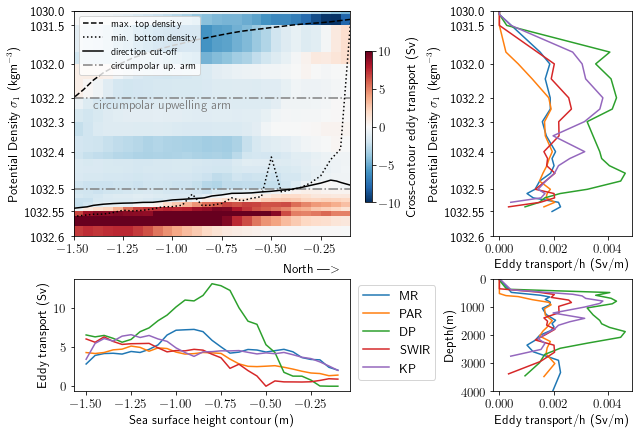

In [96]:
gs = gridspec.GridSpec(2,3,width_ratios=[2, 0.1,1], height_ratios = [2,1]) 
fig = plt.figure(figsize = (10,7))
ax0, ax1, ax2, ax3 = plt.subplot(gs[0,0]), plt.subplot(gs[1,0]), plt.subplot(gs[0,2]), plt.subplot(gs[1,2])
gs.update(wspace = 0.45, hspace = 0.25)

scfac = 20
p1 = ax0.pcolormesh(sum_T_array_tot.SSH, (sum_T_array_tot.sel(isopycnal_bins = slice(1024,1033)).isopycnal_bins.values-1024)**scfac,
                    (-sum_T_array_tot/1e6).sel(isopycnal_bins = slice(1024,1033)), cmap = 'RdBu_r', vmin = -10,vmax = 10)
rhos = np.array([1030,1031.5,1032,1032.2,1032.3, 1032.4,1032.5,1032.55,1032.6])
ax0.plot(sum_T_array.SSH, (top_rho.sel(hotspot = 'total').isel(isopycnal_bins = 0)-1024)**scfac, color = 'k', linestyle = '--', label = 'max. top density')
ax0.plot(sum_T_array.SSH, (bottom_rho.sel(hotspot = 'total').isel(isopycnal_bins = 0)-1024)**scfac,  color = 'k', linestyle = 'dotted', label = 'min. bottom density')
ax0.plot(sum_T_array.SSH, bottom_rho.sel(hotspot = 'total').isel(isopycnal_bins = 0)-1024,  color = 'k', linestyle = '-', label = 'direction cut-off')
ax0.hlines(8.2**scfac,-1.5,-0.1,  color = 'grey', linestyle = '-.', label = 'circumpolar up. arm')
ax0.hlines(8.5**scfac,-1.5,-0.1,  color = 'grey', linestyle = '-.')
ax0.text(-1.4,8.25**scfac,'circumpolar upwelling arm', color = 'grey')
ax0.set_yticks((rhos-1024)**scfac)
ax0.set_yticklabels(rhos)
ax0.set_ylim(8.6**scfac,5**scfac)
ax_cb = plt.axes([0.53, 0.5, 0.01, 0.3])
fig.colorbar(p1, cax = ax_cb, label = 'Cross-contour eddy transport (Sv)')
ax0.set_ylabel('Potential Density $\sigma_1$ (kgm$^{-3}$)')
mask = sum_T_array_tot.sel(isopycnal_bins = slice(1032.4,1032.57))
ax0.contour(mask.SSH, (mask.isopycnal_bins.values-1024)**scfac, mask, levels = [0.5], colors = 'k', linewidths = 1.5, label = 'bottom water')
ax0.legend(loc = 'upper left', fontsize = 10)
for j in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][j]
    color = ['C0','C1','C2','C3','C4'][j]
    top_rho_j = top_rho.sel(hotspot = hotspot)
    bottom_rho_j = bottom_rho.sel(hotspot = hotspot)
    h_j = h.sel(hotspot = hotspot)
    density_array= (sum_T_array.sel(hotspot = hotspot)*0+sum_T_array.isopycnal_bins)
    density_mask = (density_array.where(density_array < bottom_rho_j).where(density_array>top_rho_j)*0+1).fillna(0)
    ax2.plot((sum_T_array/1e6*density_mask/h_j).where(sum_T_array>0).sel(isopycnal_bins = slice(1024,1032.55)).sel(hotspot = hotspot).mean('SSH'),
             (sum_T_array.sel(isopycnal_bins = slice(1024,1032.55)).isopycnal_bins.values-1024)**scfac,
             label = hotspot, color = color)
    if hotspot == 'KP':
        ax3.plot((sum_T_array/1e6*density_mask/h_j).where(sum_T_array>0).sel(isopycnal_bins = slice(1024,1032.55)).sel(hotspot = hotspot).mean('SSH'),
                -depth_array.sel(isopycnal_bins = slice(1024,1032.55)).sel(hotspot = hotspot).mean('SSH'),
             label = hotspot,color = color)
    else:
        ax3.plot((sum_T_array/1e6*density_mask/h_j).where(sum_T_array>0).sel(isopycnal_bins = slice(1024,1032.55)).sel(hotspot = hotspot).mean('SSH'),
                depth_array.sel(isopycnal_bins = slice(1024,1032.55)).sel(hotspot = hotspot).mean('SSH'),
             label = hotspot,color = color)    
    upwelling_arm = (sum_T_array/1e6*density_mask).where(sum_T_array>0).sel(hotspot = hotspot)
    upwelling_arm.sum('isopycnal_bins').plot(color = color,label = hotspot, ax = ax1)
    print(hotspot+' '+str(upwelling_arm.SSH[upwelling_arm.sum('isopycnal_bins').argmax().values].values))
# top_rho_j = top_rho.sel(hotspot = 'total')
# bottom_rho_j = bottom_rho.sel(hotspot = 'total')
# h_j = h.sel(hotspot = 'total')
# density_array= (sum_T_array_tot*0+sum_T_array_tot.isopycnal_bins)
# density_mask = (density_array.where(density_array < bottom_rho_j).where(density_array>top_rho_j)*0+1).fillna(0)

# ax2.plot((sum_T_array_tot*density_mask/1e6/h_j).where(sum_T_array_tot>0).sel(isopycnal_bins = slice(1024,1032.55)).mean('SSH'),
#              (sum_T_array.sel(isopycnal_bins = slice(1024,1032.55)).isopycnal_bins.values-1024)**scfac,
#               color = 'k', label = 'Total')
# upwelling_arm = (sum_T_array_tot*density_mask/1e6).where(sum_T_array_tot>0).sel(isopycnal_bins = slice(1031.8,1032.6))
# upwelling_arm.sum('isopycnal_bins').plot(color = 'k',label = 'Total', ax = ax1)

ax1.legend(bbox_to_anchor=(1.33,1))
ax2.set_ylim(1032.6,1030)
ax2.set_yticks((rhos-1024)**scfac)
ax2.set_yticklabels(rhos)
ax2.set_ylim(8.6**scfac,5**scfac)
ax2.set_ylabel('Potential Density $\sigma_1$ (kgm$^{-3}$)')
ax2.set_xlabel('Eddy transport/h (Sv/m)')
ax1.set_ylabel('Eddy transport (Sv)')
ax1.set_title('')
ax1.set_xlabel('Sea surface height contour (m)')
ax1.text(-0.4,14.5, 'North ---$>$')
ax3.set_ylim(4000,0)
ax3.set_xlabel('Eddy transport/h (Sv/m)')
ax3.set_ylabel('Depth(m)')

fig.savefig('upwelling_details.png',dpi = 400)

# constant upwelling arms

MR -0.6000000000000002
PAR -0.7500000000000002
DP -0.7500000000000002
SWIR -1.4000000000000006
KP -1.2500000000000004
<xarray.DataArray 'sum_T_array' ()>
array(21.65736509)
Coordinates:
    hotspot  <U5 'total'


Text(0, 0.5, 'Depth(m)')

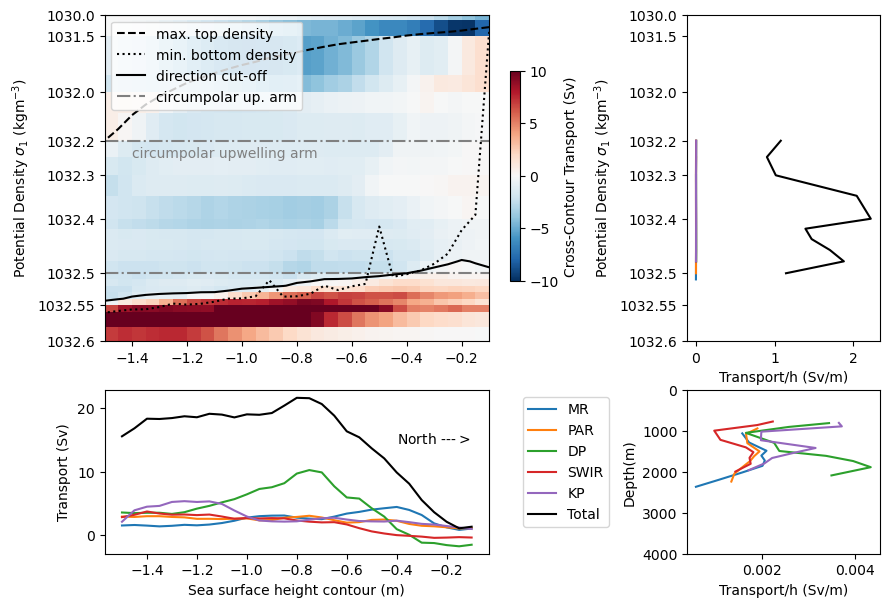

In [35]:
gs = gridspec.GridSpec(2,3,width_ratios=[2, 0.1,1], height_ratios = [2,1]) 
fig = plt.figure(figsize = (10,7))
ax0, ax1, ax2, ax3 = plt.subplot(gs[0,0]), plt.subplot(gs[1,0]), plt.subplot(gs[0,2]), plt.subplot(gs[1,2])
gs.update(wspace = 0.45)

scfac = 20
p1 = ax0.pcolormesh(sum_T_array_tot.SSH, (sum_T_array_tot.sel(isopycnal_bins = slice(1024,1033)).isopycnal_bins.values-1024)**scfac,
                    (-sum_T_array_tot/1e6).sel(isopycnal_bins = slice(1024,1033)), cmap = 'RdBu_r', vmin = -10,vmax = 10)
rhos = np.array([1030,1031.5,1032,1032.2,1032.3, 1032.4,1032.5,1032.55,1032.6])
ax0.plot(sum_T_array.SSH, (top_rho.sel(hotspot = 'total').isel(isopycnal_bins = 0)-1024)**scfac, color = 'k', linestyle = '--', label = 'max. top density')
ax0.plot(sum_T_array.SSH, (bottom_rho.sel(hotspot = 'total').isel(isopycnal_bins = 0)-1024)**scfac,  color = 'k', linestyle = 'dotted', label = 'min. bottom density')
ax0.plot(sum_T_array.SSH, bottom_rho.sel(hotspot = 'total').isel(isopycnal_bins = 0)-1024,  color = 'k', linestyle = '-', label = 'direction cut-off')
ax0.hlines(8.2**scfac,-1.5,-0.1,  color = 'grey', linestyle = '-.', label = 'circumpolar up. arm')
ax0.hlines(8.5**scfac,-1.5,-0.1,  color = 'grey', linestyle = '-.')
ax0.text(-1.4,8.25**scfac,'circumpolar upwelling arm', color = 'grey')
ax0.set_yticks((rhos-1024)**scfac)
ax0.set_yticklabels(rhos)
ax0.set_ylim(8.6**scfac,5**scfac)
ax_cb = plt.axes([0.53, 0.5, 0.01, 0.3])
fig.colorbar(p1, cax = ax_cb, label = 'Cross-Contour Transport (Sv)')
ax0.set_ylabel('Potential Density $\sigma_1$ (kgm$^{-3}$)')
mask = sum_T_array_tot.sel(isopycnal_bins = slice(1032.4,1032.57))
ax0.contour(mask.SSH, (mask.isopycnal_bins.values-1024)**scfac, mask, levels = [0.5], colors = 'k', linewidths = 1.5, label = 'bottom water')
ax0.legend(loc = 'upper left', fontsize = 10)
for j in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][j]
    color = ['C0','C1','C2','C3','C4'][j]
    bottom_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_bottom_density_cutoffs.nc').bottom_cutoff.sel(hotspot = hotspot)
    top_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_top_density_cutoffs.nc').top_cutoff.sel(hotspot = hotspot)
    rhoslice = slice(top_cutoff.max('SSH').values,bottom_cutoff.min('SSH').values)
    h_j = h.sel(hotspot = hotspot)
    ax2.plot((sum_T_array/1e6/h_j).sel(isopycnal_bins = rhoslice).sel(hotspot = hotspot).mean('SSH'),
             (sum_T_array.sel(isopycnal_bins = rhoslice).isopycnal_bins.values-1024)**scfac,
             label = hotspot, color = color)
    if hotspot == 'KP':
        ax3.plot((sum_T_array/1e6/h_j).sel(isopycnal_bins = rhoslice).sel(hotspot = hotspot).mean('SSH'),
                -depth_array.sel(isopycnal_bins = rhoslice).sel(hotspot = hotspot).mean('SSH'),
             label = hotspot,color = color)
    else:
        ax3.plot((sum_T_array/1e6/h_j).sel(isopycnal_bins = rhoslice).sel(hotspot = hotspot).mean('SSH'),
                depth_array.sel(isopycnal_bins = rhoslice).sel(hotspot = hotspot).mean('SSH'),
             label = hotspot,color = color)    
    upwelling_arm = (sum_T_array/1e6).sel(isopycnal_bins = rhoslice).sel(hotspot = hotspot)
    upwelling_arm.sum('isopycnal_bins').plot(color = color,label = hotspot, ax = ax1)
    print(hotspot+' '+str(upwelling_arm.isel(SSH = np.arange(10,29)).SSH[upwelling_arm.isel(SSH = np.arange(10,29)).sum('isopycnal_bins').argmax().values].values))
rhoslice = slice(1032.2,1032.5)
ax2.plot((sum_T_array_tot/1e6).sel(isopycnal_bins = rhoslice).sel(isopycnal_bins = slice(1024,1032.55)).mean('SSH'),
             (sum_T_array.sel(isopycnal_bins = rhoslice).isopycnal_bins.values-1024)**scfac,
              color = 'k', label = 'Total')
upwelling_arm = (sum_T_array_tot/1e6).sel(isopycnal_bins = rhoslice).sel(isopycnal_bins = slice(1031.8,1032.6))
upwelling_arm.sum('isopycnal_bins').plot(color = 'k',label = 'Total', ax = ax1)
print(upwelling_arm.sum('isopycnal_bins').max())
ax1.legend(bbox_to_anchor=(1.33,1))
ax2.set_ylim(1032.6,1030)
ax2.set_yticks((rhos-1024)**scfac)
ax2.set_yticklabels(rhos)
ax2.set_ylim(8.6**scfac,5**scfac)
ax2.set_ylabel('Potential Density $\sigma_1$ (kgm$^{-3}$)')
ax2.set_xlabel('Transport/h (Sv/m)')
ax1.set_ylabel('Transport (Sv)')
ax1.set_title('')
ax1.set_xlabel('Sea surface height contour (m)')
ax1.text(-0.4,14.5, 'North ---$>$')
ax3.set_ylim(4000,0)
ax3.set_xlabel('Transport/h (Sv/m)')
ax3.set_ylabel('Depth(m)')

#fig.savefig('upwelling_details.png',dpi = 400)

Text(-0.4, 34, 'North --->')

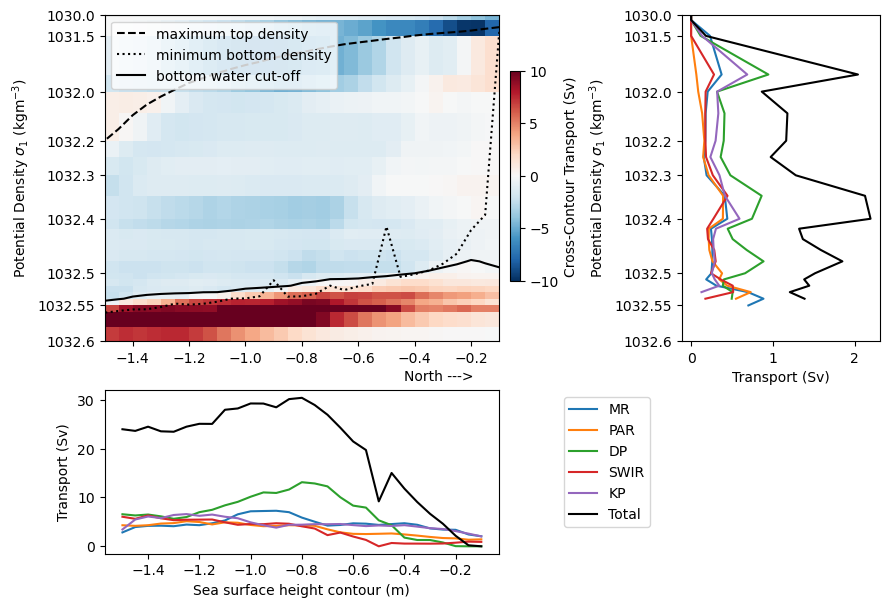

In [175]:
gs = gridspec.GridSpec(2,3,width_ratios=[2, 0.1,1], height_ratios = [2,1]) 
fig = plt.figure(figsize = (10,7))
ax0, ax1, ax2 = plt.subplot(gs[0,0]), plt.subplot(gs[1,0]), plt.subplot(gs[0,2])
gs.update(wspace = 0.4)

scfac = 20
p1 = ax0.pcolormesh(sum_T_array_tot.SSH, (sum_T_array_tot.sel(isopycnal_bins = slice(1024,1033)).isopycnal_bins.values-1024)**scfac,
                    (-sum_T_array_tot/1e6).sel(isopycnal_bins = slice(1024,1033)), cmap = 'RdBu_r', vmin = -10,vmax = 10)
rhos = np.array([1030,1031.5,1032,1032.2,1032.3, 1032.4,1032.5,1032.55,1032.6])
ax0.plot(sum_T_array.SSH, (top_av-1024)**scfac, color = 'k', linestyle = '--', label = 'maximum top density')
ax0.plot(sum_T_array.SSH, (bottom_av-1024)**scfac,  color = 'k', linestyle = 'dotted', label = 'minimum bottom density')
ax0.plot(sum_T_array.SSH, bottom_av-1024,  color = 'k', linestyle = '-', label = 'bottom water cut-off')

ax0.set_yticks((rhos-1024)**scfac)
ax0.set_yticklabels(rhos)
ax0.set_ylim(8.6**scfac,5**scfac)
ax_cb = plt.axes([0.53, 0.5, 0.01, 0.3])
fig.colorbar(p1, cax = ax_cb, label = 'Cross-Contour Transport (Sv)')
ax0.set_ylabel('Potential Density $\sigma_1$ (kgm$^{-3}$)')
mask = sum_T_array_tot.sel(isopycnal_bins = slice(1032.4,1032.57))
ax0.contour(mask.SSH, (mask.isopycnal_bins.values-1024)**scfac, mask, levels = [0.5], colors = 'k', linewidths = 1.5, label = 'bottom water')

ax0.legend(loc = 'upper left')
for j in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][j]
    color = ['C0','C1','C2','C3','C4'][j]
    top_rho_j = top_rho.sel(hotspot = hotspot)
    bottom_rho_j = bottom_rho.sel(hotspot = hotspot)
    h_j = h.sel(hotspot = hotspot)
    density_array= (sum_T_array.sel(hotspot = hotspot)*0+sum_T_array.isopycnal_bins)
    density_mask = (density_array.where(density_array < bottom_rho_j).where(density_array>top_rho_j)*0+1).fillna(0)
    ax2.plot((sum_T_array/1e6*density_mask).where(sum_T_array>0).sel(isopycnal_bins = slice(1024,1032.55)).sel(hotspot = hotspot).mean('SSH'),
             (sum_T_array.sel(isopycnal_bins = slice(1024,1032.55)).isopycnal_bins.values-1024)**scfac,
             label = hotspot, color = color)
    
    upwelling_arm = (sum_T_array/1e6*density_mask).where(sum_T_array>0).sel(hotspot = hotspot)
    upwelling_arm.sum('isopycnal_bins').plot(color = color,label = hotspot, ax = ax1)
top_rho_j = top_rho.sel(hotspot = 'total')
bottom_rho_j = bottom_rho.sel(hotspot = 'total')
h_j = h.sel(hotspot = 'total')
density_array= (sum_T_array_tot*0+sum_T_array_tot.isopycnal_bins)
density_mask = (density_array.where(density_array < bottom_rho_j).where(density_array>top_rho_j)*0+1).fillna(0)

ax2.plot((sum_T_array_tot*density_mask/1e6).where(sum_T_array_tot>0).sel(isopycnal_bins = slice(1024,1032.55)).mean('SSH'),
             (sum_T_array.sel(isopycnal_bins = slice(1024,1032.55)).isopycnal_bins.values-1024)**scfac,
              color = 'k', label = 'Total')
upwelling_arm = (sum_T_array_tot*density_mask/1e6).where(sum_T_array_tot>0).sel(isopycnal_bins = slice(1031.8,1032.6))
upwelling_arm.sum('isopycnal_bins').plot(color = 'k',label = 'Total', ax = ax1)

ax1.legend(bbox_to_anchor=(1.4,1))
ax2.set_ylim(1032.6,1030)
ax2.set_yticks((rhos-1024)**scfac)
ax2.set_yticklabels(rhos)
ax2.set_ylim(8.6**scfac,5**scfac)
ax2.set_ylabel('Potential Density $\sigma_1$ (kgm$^{-3}$)')
ax2.set_xlabel('Transport (Sv)')
ax1.set_ylabel('Transport (Sv)')
ax1.set_title('')
ax1.set_xlabel('Sea surface height contour (m)')
ax1.text(-0.4,34, 'North --->')



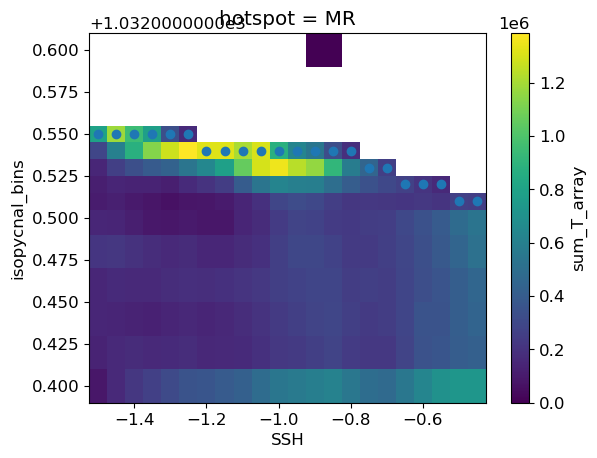

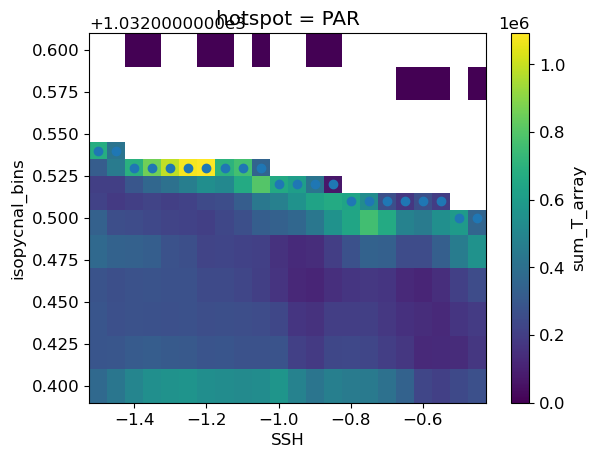

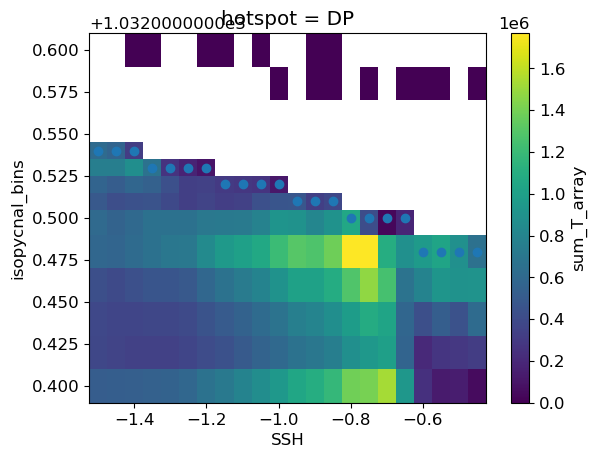

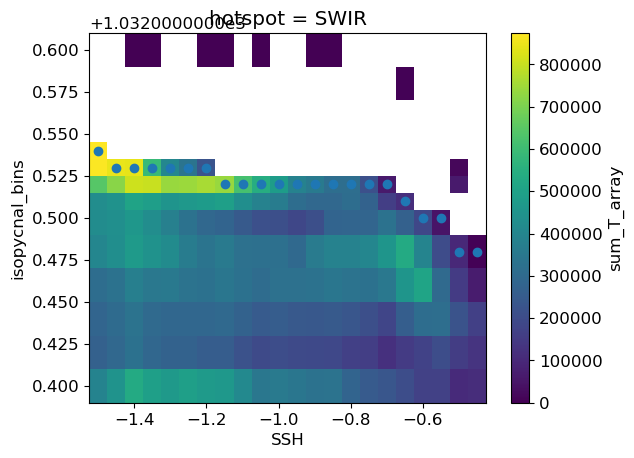

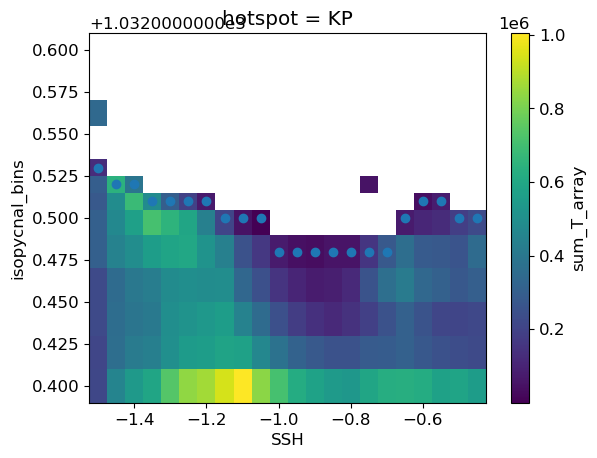

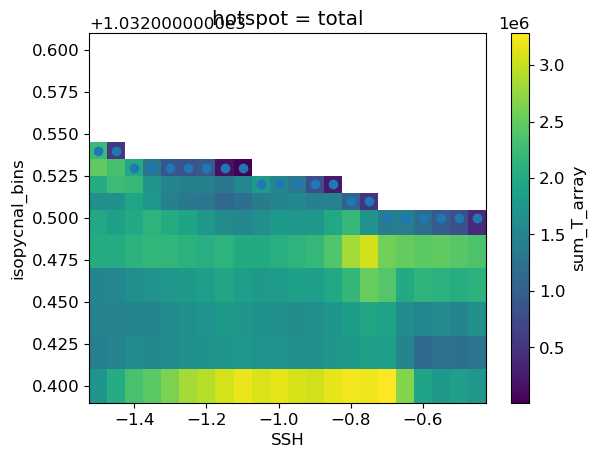

In [150]:
bottom_cutoff = xr.DataArray(np.zeros((6,22)),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP','total']), np.arange(-1.5,-0.44,0.05)],
                                      dims = ['hotspot', 'SSH'],
                                      name = 'bottom_cutoff')

for k in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][k]

    sum_T_array_bottom = sum_T_array.sel(hotspot = hotspot).sel(isopycnal_bins = slice(1032.4,1032.6)).isel(SSH = np.arange(7,29) )
    sum_T_array_bottom.where(sum_T_array_bottom >0).plot()
    #sum_T_array.sel(hotspot = hotspot).plot()
    for i in np.arange(len(sum_T_array_bottom.SSH)):
        for j in np.arange(len(sum_T_array_bottom.isopycnal_bins)):
            if np.isnan(sum_T_array_bottom.where(sum_T_array_bottom >0)[j,i])==True:
                if bottom_cutoff[k,21-i]==0:
                    bottom_cutoff[k,21-i] = sum_T_array_bottom.isopycnal_bins[j-1]
    plt.scatter(bottom_cutoff.SSH.values,bottom_cutoff[k,:])
    plt.show()
hotspot = 'total'
sum_T_array_bottom = sum_T_array_tot.sel(isopycnal_bins = slice(1032.4,1032.6)).isel(SSH = np.arange(7,29) )
sum_T_array_bottom.where(sum_T_array_bottom >0).plot()
#sum_T_array.sel(hotspot = hotspot).plot()
for i in np.arange(len(sum_T_array_bottom.SSH)):
    for j in np.arange(len(sum_T_array_bottom.isopycnal_bins)):
        if np.isnan(sum_T_array_bottom.where(sum_T_array_bottom >0)[j,i])==True:
            if bottom_cutoff[5,21-i]==0:
                bottom_cutoff[5,21-i] = sum_T_array_bottom.isopycnal_bins[j-1]
plt.scatter(bottom_cutoff.SSH.values,bottom_cutoff[5,:])
plt.show()

In [151]:
top_cutoff = xr.DataArray(np.flip(top_rho.isel(isopycnal_bins = 0).isel(SSH = np.arange(7,29)).values, axis = 1),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP','total']), bottom_cutoff.SSH.values],
                                      dims = ['hotspot', 'SSH'],
                                      name = 'top_cutoff')


In [152]:
save_dir = '/g/data/x77/cy8964/Post_Process/New_SO/'
ds = xr.Dataset({'top_cutoff': top_cutoff})
ds.to_netcdf(save_dir+'hotspot_top_density_cutoffs.nc')

In [24]:
top_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_top_density_cutoffs.nc').top_cutoff
bottom_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_bottom_density_cutoffs.nc').bottom_cutoff

bottom_cutoff.min('SSH')#.sel(SSH = slice(-0.86,-0.84)).sel(hotspot = 'total')#.values[1]

<xarray.DataArray 'bottom_cutoff' (hotspot: 6)>
array([1032.51, 1032.5 , 1032.48, 1032.48, 1032.48, 1032.5 ])
Coordinates:
  * hotspot  (hotspot) object 'MR' 'PAR' 'DP' 'SWIR' 'KP' 'total'

In [25]:
top_cutoff.max('SSH')

<xarray.DataArray 'top_cutoff' (hotspot: 6)>
array([1032.2962295 , 1032.22305317, 1032.13010113, 1032.13490907,
       1032.19249245, 1032.20006365])
Coordinates:
  * hotspot  (hotspot) object 'MR' 'PAR' 'DP' 'SWIR' 'KP' 'total'

this has upwelling arm varying between contours but not within (top and bottom density are averages along the contour)

add depth as text in right subplot??

In [88]:
total = sum_T_array_tot.sel(isopycnal_bins = slice(1032.2,1032.5)).sum('isopycnal_bins').mean('SSH')
for j in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][j]
    print(hotspot)
    hotpercent = sum_T_array.sel(hotspot= hotspot).sel(isopycnal_bins = slice(1032.2,1032.5)).sum('isopycnal_bins').mean('SSH')/total
    print(hotpercent.values)

MR
0.17613090126268324
PAR
0.16622331719851816
DP
0.29365169694723764
SWIR
0.13354986823921453
KP
0.20650206397341955


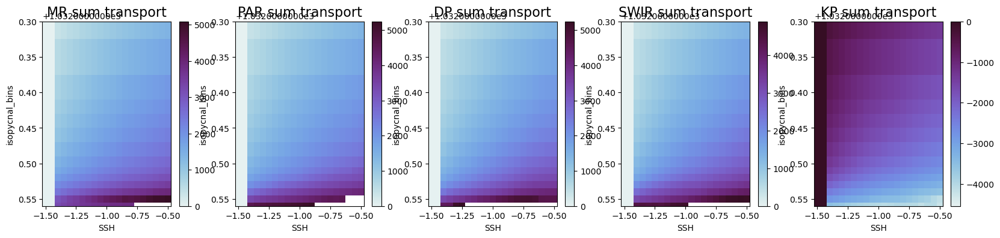

In [28]:
fig,axes = plt.subplots(nrows = 1, ncols = 5, figsize = (20,4))          
for j in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][j]
    p1 = depth_array.sel(hotspot = hotspot).isel(SSH = np.arange(8,29)).plot(ax = axes[j],cmap = cm.cm.dense, add_colorbar = False)
    plt.colorbar(p1, ax = axes[j])
    axes[j].set_ylim(1032.56,1032.3)
    axes[j].set_title(hotspot+' sum transport', fontsize = 16)

    

(1032.6, 1032.0)

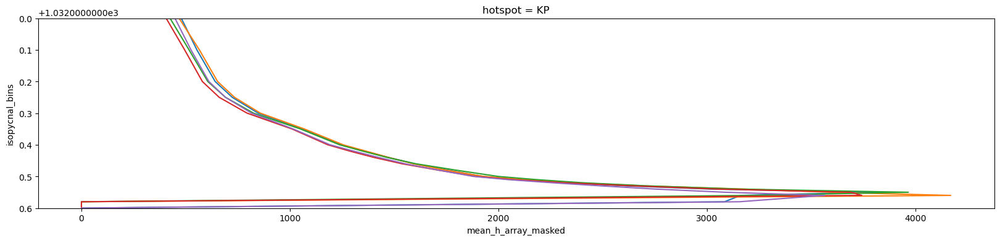

In [31]:
fig = plt.figure(figsize = (20,4))          
for j in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][j]
    if j==4:
        yeet = -1
    else:
        yeet = 1
    p1 = (yeet*depth_array).sel(hotspot = hotspot).isel(SSH = np.arange(8,29)).mean('SSH').plot(y = 'isopycnal_bins',label = hotspot)

plt.ylim(1032.6,1032)

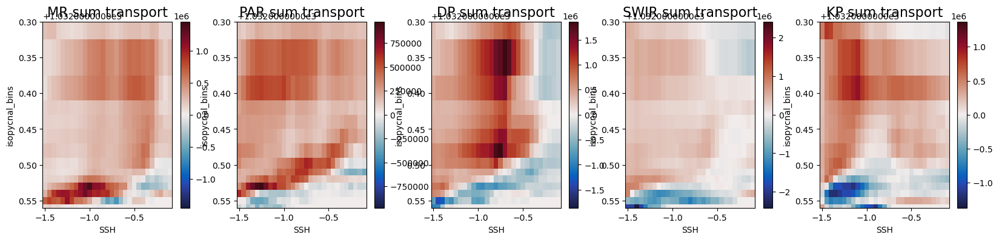

In [24]:
fig,axes = plt.subplots(nrows = 1, ncols = 5, figsize = (20,4))          
for j in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][j]
    p1 = sum_T_array_masked.sel(hotspot = hotspot).plot(ax = axes[j],cmap = cm.cm.balance, add_colorbar = False)
    plt.colorbar(p1, ax = axes[j])
    axes[j].set_ylim(1032.56,1032.3)
    axes[j].set_title(hotspot+' sum transport', fontsize = 16)

    

(1032.6, 1031.0)

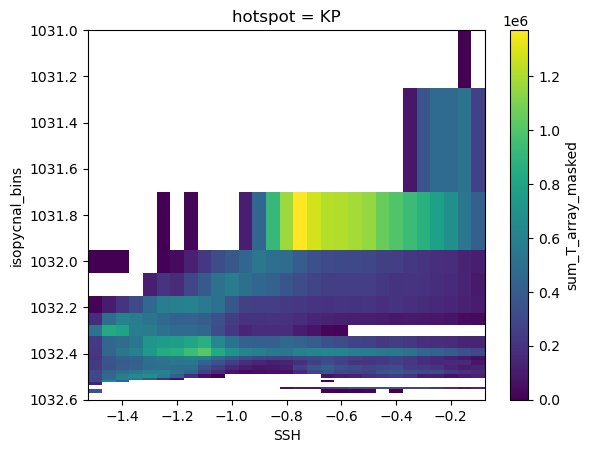

In [25]:
hotspot = 'MR'
isopycnal_bins = sum_T_array_masked.isopycnal_bins.values
upwelling_arm = sum_T_array_masked.where(sum_T_array_masked>0).sel(hotspot = 'KP')#.sel(isopycnal_bins = slice(1031.8,1032.6))
upwelling_arm.plot()
plt.ylim(1032.6,1031)

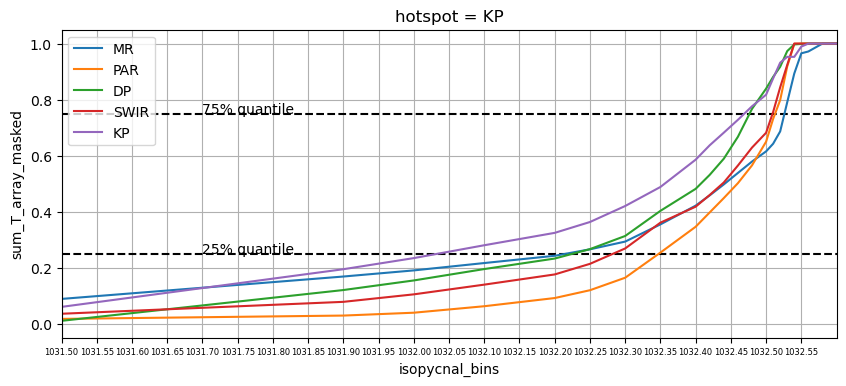

In [26]:
fig = plt.figure(figsize = (10,4))
# over all SSH contours
for j in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][j]
    upwelling_arm = sum_T_array_masked.where(sum_T_array_masked>0).sel(hotspot = hotspot)#.sel(isopycnal_bins = slice(1031.8,1032.6))
    (upwelling_arm.mean('SSH').cumsum('isopycnal_bins')/upwelling_arm.mean('SSH').sum('isopycnal_bins')).plot(label = hotspot)
plt.legend()
plt.hlines([0.25,0.75,],1031,1032.6, color = 'k', linestyle = '--')
plt.text(1031.7,0.75, '75% quantile')
plt.text(1031.7,0.25, '25% quantile')
plt.xlim(1031.5,1032.6)
plt.xticks(np.arange(1031.5,1032.6,0.05), fontsize = 6)
plt.grid()

In [ ]:
hotspot_dict = OrderedDict([
('PAR',  {'lower_lon':-165,'upper_lon':-100,'lower_lat':-60,'upper_lat':-50}),
('SWIR',  {'lower_lon':5,'upper_lon':55,'lower_lat':-55,'upper_lat':-45}),
('DP',  {'lower_lon':-80,'upper_lon':5,'lower_lat':-60,'upper_lat':-40}),
('MR',  {'lower_lon':-230,'upper_lon':-165,'lower_lat':-60,'upper_lat':-45}),
('KP1',  {'lower_lon':55,'upper_lon':80,'lower_lat':-60,'upper_lat':-40}),
('KP2',{'lower_lon':-280,'upper_lon':-230,'lower_lat':-60,'upper_lat':-40})])

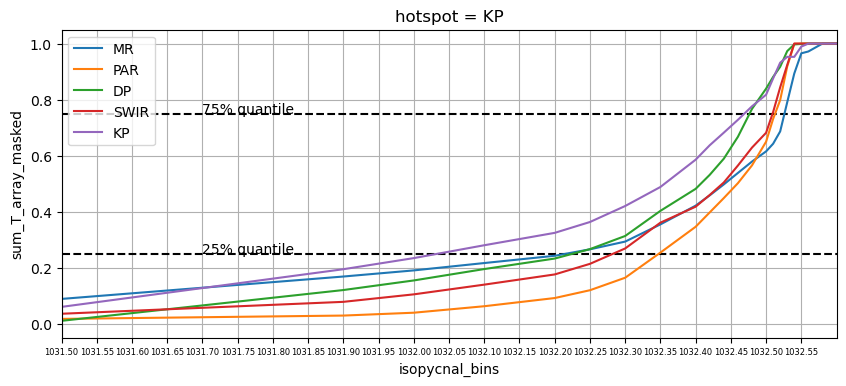

In [26]:
h_bar = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/h_bar_10yr.nc').h_bar


MR
transport at max SSH is<xarray.DataArray 'sum_T_array_masked' ()>
array(7606884.86958584)
Coordinates:
    hotspot  <U2 'MR'
<xarray.DataArray 'vh_eddy' ()>
array(25905213.49930267)
Coordinates:
    hotspot  <U2 'MR'
    SSH      float64 -0.9
ratio=0.2936430101141844
PAR
transport at max SSH is<xarray.DataArray 'sum_T_array_masked' ()>
array(4485069.03439003)
Coordinates:
    hotspot  <U3 'PAR'
<xarray.DataArray 'vh_eddy' ()>
array(22605188.49826648)
Coordinates:
    hotspot  <U3 'PAR'
    SSH      float64 -1.25
ratio=0.19840883143858679
DP
transport at max SSH is<xarray.DataArray 'sum_T_array_masked' ()>
array(13572150.57364077)
Coordinates:
    hotspot  <U2 'DP'
<xarray.DataArray 'vh_eddy' ()>
array(29117903.24509205)
Coordinates:
    hotspot  <U2 'DP'
    SSH      float64 -0.8
ratio=0.46611016114041154
SWIR
transport at max SSH is<xarray.DataArray 'sum_T_array_masked' ()>
array(6318501.91757118)
Coordinates:
    hotspot  <U4 'SWIR'
<xarray.DataArray 'vh_eddy' ()>
array(23209354.8

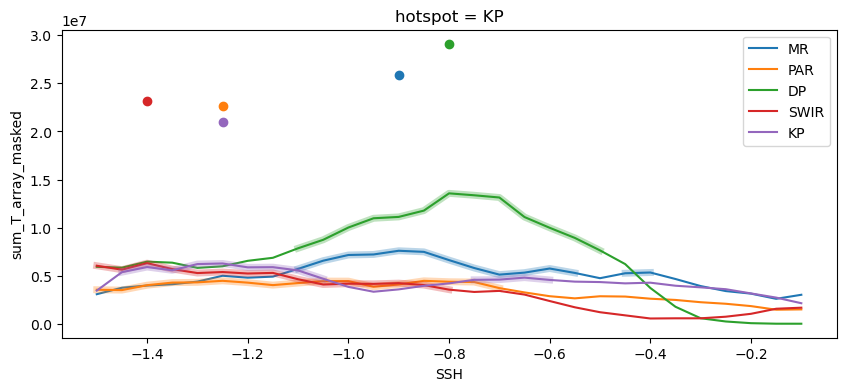

In [28]:
SSHs = np.arange(-0.1,-1.55,-0.05)
# contours with transport above the mean transport
fig = plt.figure(figsize = (10,4))
for j in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][j]
    print(hotspot)
    color = ['C0','C1','C2','C3','C4'][j]
    upwelling_arm = sum_T_array_masked.where(sum_T_array_masked>0).sel(hotspot = hotspot)#.sel(isopycnal_bins = slice(1031.8,1032.6))
    upwelling_arm.sum('isopycnal_bins').plot(color = color,label = hotspot)
    SSH_mask = upwelling_arm.sum('isopycnal_bins').mean('SSH')
    upwelling_arm.sum('isopycnal_bins').where(upwelling_arm.sum('isopycnal_bins')>SSH_mask).plot(color = color,linewidth = 5, alpha = 0.3)
    SSH_max = upwelling_arm.sum('isopycnal_bins').max('SSH')
    SSH_argmax = upwelling_arm.sum('isopycnal_bins').argmax('SSH')
    sum_T_array_masked.sum('hotspot').sum('isopycnal_bins')
    print('transport at max SSH is'+str(SSH_max))
    
    j_contour = np.array(['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'])[SSH_argmax.values]
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
    else:
        suffix = ''
    vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lat_along_contour
    lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lon_along_contour
    segment_length = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_segment_length'+suffix+'.nc').segment_length
    isopycnal_bin_contour = vh_eddy*0+vh_eddy.isopycnal_bins
    top_rho1_max_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').top_rho1_max_contour
    bottom_rho1_min_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'bottom_min_top_max_rho1_contour'+suffix+'.nc').bottom_rho1_min_contour
    vh_eddy_masked= vh_eddy.where(isopycnal_bin_contour > top_rho1_max_contour).where(isopycnal_bin_contour <bottom_rho1_min_contour).fillna(0)
    mask = vh_eddy_masked*0+sum_T_array_masked.sel(hotspot=hotspot).sel(SSH = SSHs[SSH_argmax.values])
    eddy_notcumsum_masked = (-vh_eddy_masked.where(mask >0))
    plt.scatter(SSHs[SSH_argmax.values],eddy_notcumsum_masked.sum('isopycnal_bins').sum('contour_index'))
    
    print(eddy_notcumsum_masked.sum('isopycnal_bins').sum('contour_index'))
    print('ratio='+str((SSH_max/eddy_notcumsum_masked.sum('isopycnal_bins').sum('contour_index')).values))
    
plt.legend()

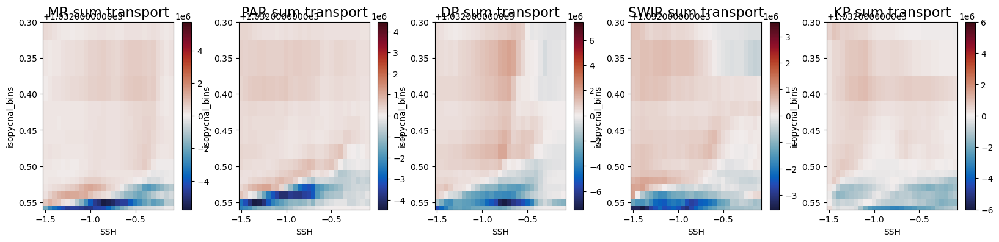

In [21]:
fig,axes = plt.subplots(nrows = 1, ncols = 5, figsize = (20,4))          
for j in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][j]
    p1 = sum_T_array.sel(hotspot = hotspot).plot(ax = axes[j],cmap = cm.cm.balance, add_colorbar = False)
    plt.colorbar(p1, ax = axes[j])
    axes[j].set_ylim(1032.56,1032.3)
    axes[j].set_title(hotspot+' sum transport', fontsize = 16)

    

# do a percentile thing on this!!! also fix distance sign

MR
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
PAR
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
DP
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
SWIR
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
KP
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
CPU times: user 2h 12min 54s, sys: 1min 46s, total: 2h 14min 40s
Wall time: 2h 13min 26s


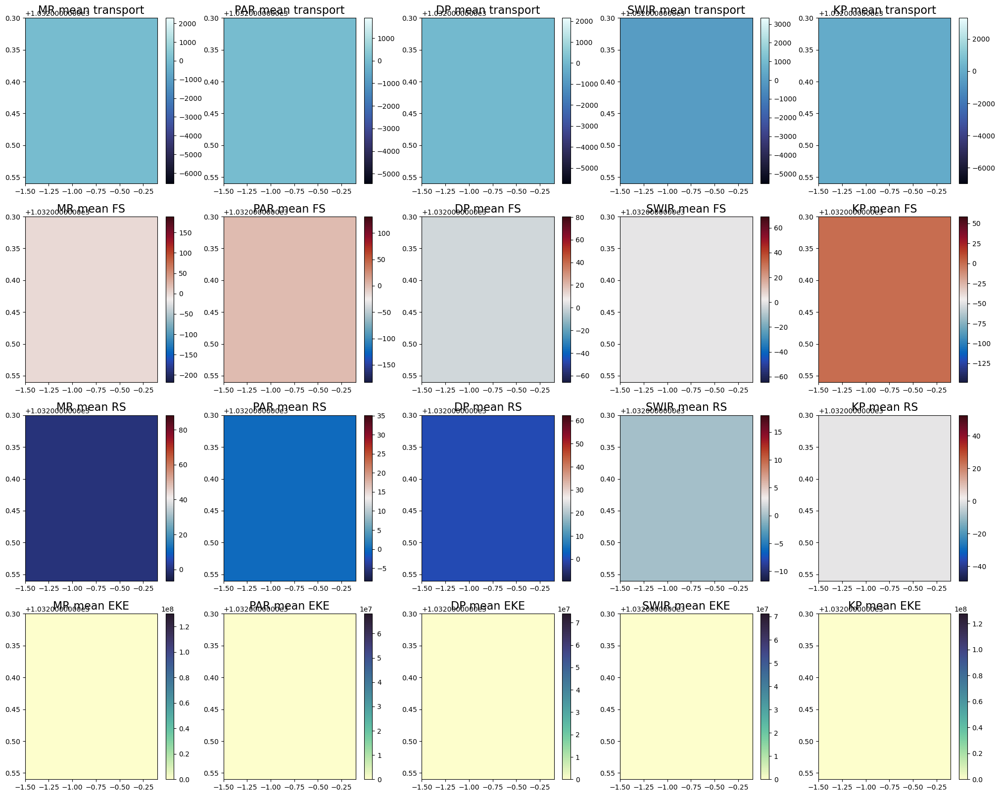

In [19]:
%%time
SSHs = np.arange(-0.1,-1.55,-0.05)
densities = 1000+ np.array([1,28,29,30,31,31.5,31.9,32,32.1,32.2,32.25,32.3,
                                        32.35,32.4,32.42,32.44,32.46,32.48,32.50,32.51,
                                        32.52,32.53,32.54,32.55,32.56,32.58,32.6,32.8,33,34,45])
mean_T_array = xr.DataArray(np.zeros((5,31,29)),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP']), densities, SSHs],
                                      dims = ['hotspot', 'isopycnal_bins', 'SSH'],
                                      name = 'mean_T_array')
mean_FS_array = xr.DataArray(np.zeros((5,31,29)),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP']), densities, SSHs],
                                      dims = ['hotspot', 'isopycnal_bins', 'SSH'],
                                      name = 'mean_FS_array')
mean_RS_array = xr.DataArray(np.zeros((5,31,29)),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP']), densities, SSHs],
                                      dims = ['hotspot', 'isopycnal_bins', 'SSH'],
                                      name = 'mean_RS_array')
mean_EKE_array = xr.DataArray(np.zeros((5,31,29)),
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP']), densities, SSHs],
                                      dims = ['hotspot', 'isopycnal_bins', 'SSH'],
                                      name = 'mean_EKE_array')

density_mesh = np.append((densities + np.roll(densities,1))/2,46)
fig, axes = plt.subplots(nrows = 4, ncols = 5, figsize = (25,20))
for j in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][j]
    print(hotspot)
    for i in np.arange(31):
        print(i)
        rho = densities[i]
        mean_T, mean_FS, mean_RS, mean_EKE =find_mean_TFRS_contour(hotspot, rho)
        mean_T_array[j,i,:] = mean_T
        mean_FS_array[j,i,:] = mean_FS
        mean_RS_array[j,i,:] = mean_RS
        mean_EKE_array[j,i,:] = mean_EKE
    p1 = axes[0,j].pcolormesh(SSHs, density_mesh, mean_T_array[j,...], cmap = cm.cm.ice)
    plt.colorbar(p1, ax = axes[0,j])
    axes[0,j].set_ylim(1032.56,1032.3)
    axes[0,j].set_title(hotspot+' mean transport', fontsize = 16)

    p1 = axes[1,j].pcolormesh(SSHs, density_mesh, mean_FS_array[j,...], cmap = cm.cm.balance)
    plt.colorbar(p1, ax = axes[1,j])
    axes[1,j].set_ylim(1032.56,1032.3)
    axes[1,j].set_title(hotspot+' mean FS', fontsize = 16)

    p1 = axes[2,j].pcolormesh(SSHs, density_mesh, mean_RS_array[j,...], cmap = cm.cm.balance)
    plt.colorbar(p1, ax = axes[2,j])
    axes[2,j].set_ylim(1032.56,1032.3)
    axes[2,j].set_title(hotspot+' mean RS', fontsize = 16)

    p1 = axes[3,j].pcolormesh(SSHs, density_mesh, mean_EKE_array[j,...], cmap = cm.cm.deep)
    plt.colorbar(p1, ax = axes[3,j])
    axes[3,j].set_ylim(1032.56,1032.3)
    axes[3,j].set_title(hotspot+' mean EKE', fontsize = 16)
    
# save_dir = '/g/data/x77/cy8964/Post_Process/New_SO/'
# ds = xr.Dataset({'mean_T_array': mean_T_array,'mean_FS_array': mean_FS_array,'mean_RS_array': mean_RS_array,'mean_EKE_array': mean_EKE_array,})
# ds.to_netcdf(save_dir+'avg_TFRE_over_hotspots.nc')


MR
PAR
DP
SWIR
KP
CPU times: user 942 ms, sys: 70.9 ms, total: 1.01 s
Wall time: 914 ms


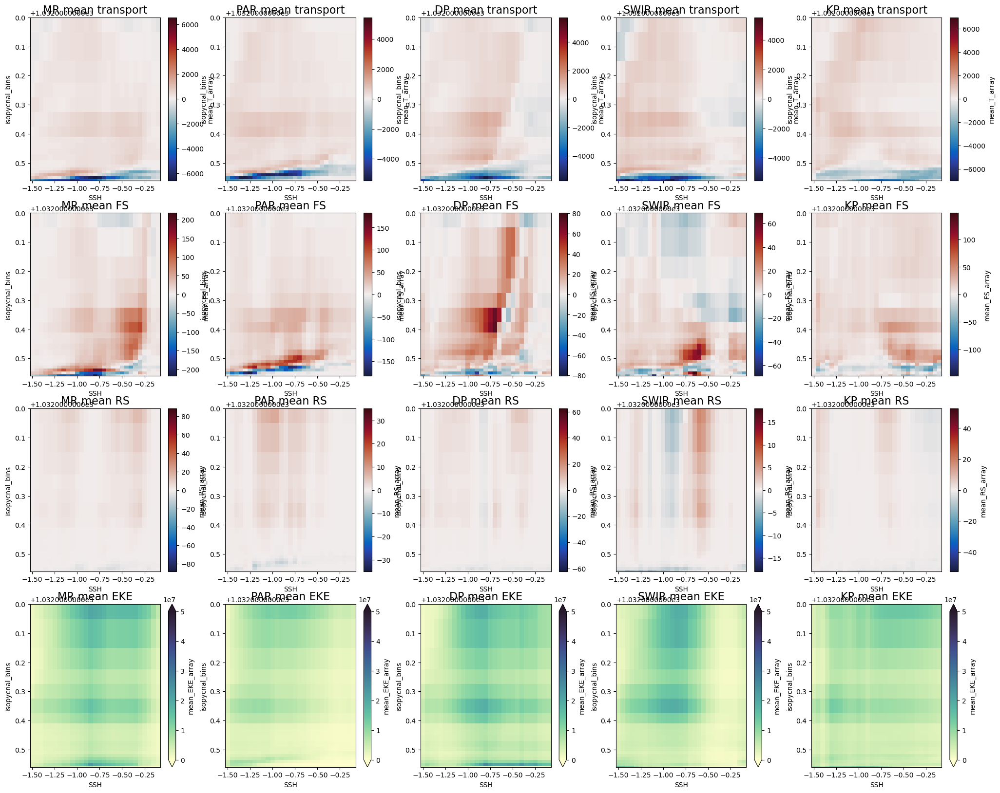

In [103]:
%%time

density_mesh = np.append((densities + np.roll(densities,1))/2,46)
fig, axes = plt.subplots(nrows = 4, ncols = 5, figsize = (25,20))
for j in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][j]
    print(hotspot)
    mean_T_array = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/avg_TFRE_over_hotspots.nc').mean_T_array.sel(hotspot = hotspot)
    mean_FS_array = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/avg_TFRE_over_hotspots.nc').mean_FS_array.sel(hotspot = hotspot)
    mean_RS_array = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/avg_TFRE_over_hotspots.nc').mean_RS_array.sel(hotspot = hotspot)
    mean_EKE_array = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/avg_TFRE_over_hotspots.nc').mean_EKE_array.sel(hotspot = hotspot)
    
    p1 = mean_T_array.plot(ax = axes[0,j],cmap = cm.cm.balance)
#    plt.colorbar(p1, ax = axes[0,j])
    axes[0,j].set_ylim(1032.56,1032)
    axes[0,j].set_title(hotspot+' mean transport', fontsize = 16)

    p1 = mean_FS_array.plot(ax = axes[1,j],cmap = cm.cm.balance)
#    plt.colorbar(p1, ax = axes[1,j])
    axes[1,j].set_ylim(1032.56,1032)
    axes[1,j].set_title(hotspot+' mean FS', fontsize = 16)

    p1 = mean_RS_array.plot(ax = axes[2,j],cmap = cm.cm.balance)
#    plt.colorbar(p1, ax = axes[2,j])
    axes[2,j].set_ylim(1032.56,1032)
    axes[2,j].set_title(hotspot+' mean RS', fontsize = 16)

    p1 = mean_EKE_array.plot(ax = axes[3,j],cmap = cm.cm.deep, vmax = 5e7, vmin = 0)
#    plt.colorbar(p1, ax = axes[3,j])
    axes[3,j].set_ylim(1032.56,1032)
    axes[3,j].set_title(hotspot+' mean EKE', fontsize = 16)

<xarray.DataArray 'mean_T_array' ()>
array(17)
Coordinates:
    hotspot  <U2 'KP'
1032.48 1030.0


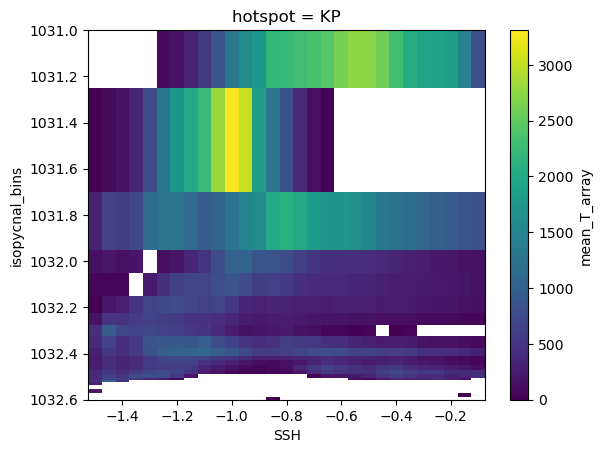

In [94]:
hotspot = 'KP'
mean_T_array = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/avg_TFRE_over_hotspots.nc').mean_T_array.sel(hotspot = hotspot)
mean_T_array.where(mean_T_array>0).plot()
plt.ylim(1032.6,1031)
max_contour= mean_T_array.where(mean_T_array>0).sum('isopycnal_bins')[1:].argmax('SSH')
print(max_contour)
max_dens = mean_T_array.isel(SSH = max_contour).where(mean_T_array.isel(SSH = max_contour)>0).where(mean_T_array.isopycnal_bins < 1032.55)*0+mean_T_array.isopycnal_bins
max_dens = max_dens.max('isopycnal_bins').values
min_dens = mean_T_array.isel(SSH = max_contour).where(mean_T_array.isel(SSH = max_contour)>0).where(mean_T_array.isopycnal_bins < 1032.55)*0+ mean_T_array.isopycnal_bins
min_dens = min_dens.min('isopycnal_bins').values
print(max_dens, min_dens)


MR: SSH = 15, 1030 to 1032.54
PAR:SSH = 22, 1030 to 1032.53
DP:SSH=14, 1029 to 1032.51
SWIR: SSH = 25, 1031 to 1032.53
KP: SSH = 17, 1030 to 1032.48



In [21]:
def find_best_contour(hotspot, rhoslice):
    biggest_r_FS = np.zeros(29)
    biggest_r_RS = np.zeros(29)
    biggest_r_EKE= np.zeros(29)
    
    for i in np.arange(29):
        j_contour = np.array(['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'])[i]
        z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E = compute_corr_FRS(hotspot,j_contour,rhoslice)
        biggest_r_FS[i] = np.max(corr_combined_F)
        biggest_r_RS[i] = np.max(corr_combined_R)
        biggest_r_EKE[i] = np.max(corr_combined_E)
        
    return biggest_r_FS, biggest_r_RS, biggest_r_EKE


MR
3.056187937780143
14.02563614972362 22.756371952007708
0.8208339724737447
18.623453733246198 26.996782013409735
-0.2668279084156188
12.55742708807356 17.455233175235303
1.1034191437592087
18.663048675764557 32.643892573380434
0.8802177133927653
24.76242848228538 38.607228790299814
-0.6416069570441049
14.750330730744937 24.410627353052412
1.5849477430860308
29.518612562183613 57.20615829467217
1.2450531993288043
27.432179352892074 54.511827380947494
-0.12604864183495973
31.958503356111812 59.32968412414129
2.479240871209983
36.31045811732032 91.44636163033998
2.9141697347921087
37.41011592978812 92.5152826494394
1.1949452283290793
46.897940211373154 104.07452073654905
3.3286623478140074
30.06685133243123 52.36907994099479
3.78488213474799
32.064248707816226 54.42290534261797
1.6345710177764377
37.859366959421976 61.82458651198187
6.693445658942364
37.76343631402618 55.686430667477126
2.7054501662832857
40.234862212470205 58.24395386274758
1.4023778127218212
41.74389051086826 59.72172

Text(0.5, 0, 'SSH contour')

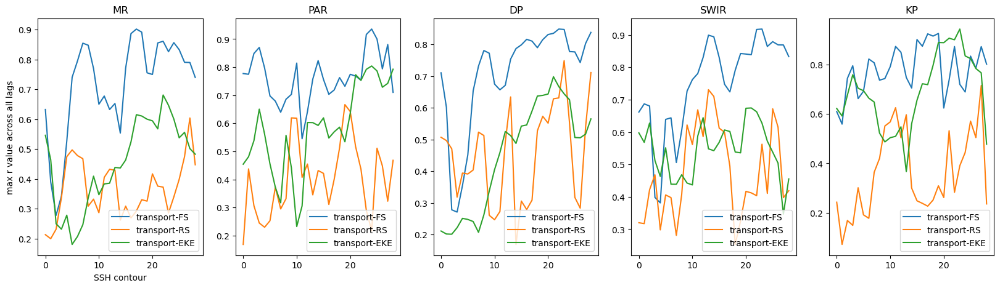

In [19]:
fig, axes = plt.subplots(nrows = 1, ncols = 5, figsize = (20,5))
for i in np.arange(5):
    hotspot=['MR','PAR','DP','SWIR','KP'][i]
    print(hotspot)
    a,b,c = find_best_contour(hotspot,slice(1032.3,1032.5))
    axes[i].plot(a, label = 'transport-FS')
    axes[i].plot(b, label = 'transport-RS')
    axes[i].plot(c, label = 'transport-EKE')
    axes[i].legend(loc = 'lower right')
    axes[i].set_title(hotspot)
axes[0].set_ylabel('max r value across all lags')
axes[0].set_xlabel('SSH contour')

method is find best correlation for r of FS + r of EKE, or max FS correlation (see line index=np.argmax(a))

# manually chosen max southward transport contours and densities

## BEST OPTION:

In [35]:
#original
hotspot_dict = OrderedDict([
('PAR',  {'lower_lon':-160,'upper_lon':-110}),
('SWIR',  {'lower_lon':10,'upper_lon':50}),
('DP',  {'lower_lon':-70,'upper_lon':0}),
('MR',  {'lower_lon':-220,'upper_lon':-170}),
('KP1',  {'lower_lon':60,'upper_lon':80}),
('KP2',{'lower_lon':-280,'upper_lon':-240})])#-260

In [37]:
#10 degrees bigger on either side
hotspot_dict = OrderedDict([
('PAR',  {'lower_lon':-170,'upper_lon':-100}),
('SWIR',  {'lower_lon':0,'upper_lon':60}),
('DP',  {'lower_lon':-80,'upper_lon':10}),
('MR',  {'lower_lon':-230,'upper_lon':-160}),
('KP1',  {'lower_lon':50,'upper_lon':80}),
('KP2',{'lower_lon':-280,'upper_lon':-230})])#-260

In [19]:
#10 degrees bigger on either side, but no overlap
hotspot_dict = OrderedDict([
('PAR',  {'lower_lon':-165,'upper_lon':-100}),
('SWIR',  {'lower_lon':5,'upper_lon':55}),
('DP',  {'lower_lon':-80,'upper_lon':5}),
('MR',  {'lower_lon':-230,'upper_lon':-165}),
('KP1',  {'lower_lon':55,'upper_lon':80}),
('KP2',{'lower_lon':-280,'upper_lon':-230})])#-260

3.917818677176166
10.443281774920523 11.779580205832234
0.4165983988776582
12.281745901161024 13.967532068413123
2.6138378842883703
11.016741845130662 13.08656294247795
2.9886886898354224
10.05983730106953 10.909109819562135
1.5778761179941767
12.899086735028396 13.82582496875841
3.5181741593140554
14.038029408898474 17.76542531874634
4.966366520066867
20.788007861618766 23.34370936036759
1.6495480438994858
25.35047066329446 28.482946480997043
2.927445638236863
17.422189021718445 20.18224902548281
7.386204632005093
16.22928730930514 16.607160249058836
3.8306499147761635
16.35344711171937 16.747912281653104
2.1999667232610163
10.786227984004869 11.604044570104032
7.684988075484937
7.41390603607955 7.633195657368814
0.08229715644972467
10.41150084498292 10.821027988439285
3.4429493816853354
7.849568414593195 8.669376787574844


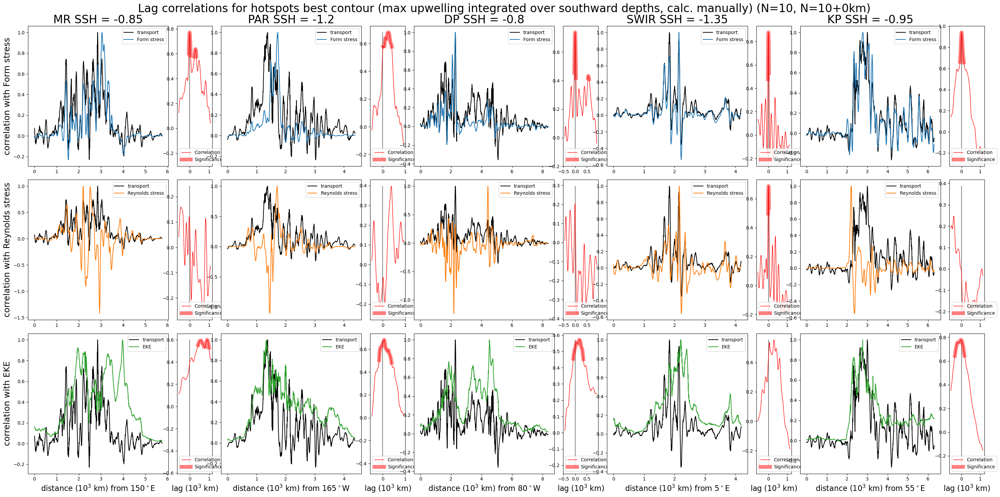

In [21]:
lon_start = ['150$^\circ$E','165$^\circ$W','80$^\circ$W','5$^\circ$E','55$^\circ$E']
fig, axes = plt.subplots(nrows = 3, ncols = 10, figsize = (30,15),gridspec_kw={'width_ratios': [1,0.25,1,0.25,1,0.25,1,0.25,1,0.25]})

for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    #a,b,c = find_best_contour(hotspot,rhoslice)
    rhoslice = [slice(1030,1032.54),slice(1030,1032.53),slice(1029,1032.51),slice(1031,1032.53),slice(1030,1032.48)][i]
    index = [15,22,14,25,17][i]
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][index]
    # load calculated smoothed quantities and correlations
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E, distance_h, distance_corr = compute_corr_FRS(hotspot,j_contour,rhoslice)
    # plot
    N_middle = int((len(distance_corr)-1)/2)
    axes[0,2*i].plot(distance_h,z_scaled, color = 'k', label = 'transport')
    axes[0,2*i].plot(distance_h,Form_scaled, color = 'C0', label = 'Form stress')
    #axes[0,2*i+1].yaxis.tick_right()
    axes[0,2*i+1].plot(distance_corr[N_middle-100:N_middle+200],corr_combined_F[N_middle-100:N_middle+200],'-r',linewidth=1,label='Correlation')
    axes[0,2*i+1].plot(distance_corr[N_middle-100:N_middle+200],(corr_combined_F*sig_combined_F)[N_middle-100:N_middle+200],color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[0,2*i+1].vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
    axes[0,2*i+1].legend(loc = 'lower left')
    axes[0,2*i].legend(loc = 'upper right')
    axes[0,2*i].set_title(hotspot+' SSH = '+str(contour_dict[j_contour]['SSH']), fontsize = 24)
    
    axes[1,2*i].plot(distance_h,z_scaled, color = 'k', label = 'transport')
    axes[1,2*i].plot(distance_h,Reynolds_scaled, color = 'C1', label = 'Reynolds stress')
    #axes[1,2*i+1].yaxis.tick_right()
    axes[1,2*i+1].plot(distance_corr[N_middle-100:N_middle+200],corr_combined_R[N_middle-100:N_middle+200],'-r',linewidth=1,label='Correlation')
    axes[1,2*i+1].plot(distance_corr[N_middle-100:N_middle+200],(corr_combined_R*sig_combined_R)[N_middle-100:N_middle+200],color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[1,2*i+1].vlines(0,np.min(corr_combined_R),np.max(corr_combined_R), color = 'grey')
    axes[1,2*i+1].legend(loc = 'lower left')
    axes[1,2*i].legend(loc = 'upper right')

    axes[2,2*i].plot(distance_h,z_scaled, color = 'k', label = 'transport')
    axes[2,2*i].plot(distance_h,EKE_scaled, color = 'C2', label = 'EKE')
    #axes[2,2*i+1].yaxis.tick_right()
    axes[2,2*i+1].plot(distance_corr[N_middle-100:N_middle+200],corr_combined_E[N_middle-100:N_middle+200],'-r',linewidth=1,label='Correlation')
    axes[2,2*i+1].plot(distance_corr[N_middle-100:N_middle+200],(corr_combined_E*sig_combined_E)[N_middle-100:N_middle+200],color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[2,2*i+1].vlines(0,np.min(corr_combined_E),np.max(corr_combined_E), color = 'grey')
    axes[2,2*i].legend(loc = 'upper right')
    axes[2,2*i+1].legend(loc = 'lower left')
    axes[2,2*i].set_xlabel('distance (10$^3$ km) from '+lon_start[i], fontsize = 16)
    axes[2,2*i+1].set_xlabel('lag (10$^3$ km)', fontsize = 16)

axes[0,0].set_ylabel('correlation with Form stress', fontsize = 18)
axes[1,0].set_ylabel('correlation with Reynolds stress', fontsize = 18)
axes[2,0].set_ylabel('correlation with EKE', fontsize = 18)


fig.suptitle('Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)', fontsize = 24)
#plt.savefig('temp.png',dpi = 400)
plt.tight_layout()
plt.subplots_adjust(wspace = 0.1)

MR -0.9000000000000002

PAR -1.2500000000000004

DP -0.8000000000000002

SWIR -1.4000000000000006

KP -1.2500000000000004


4.83404156249563
11.09251605568356 12.496521818277662
0.5086146467815295
13.11369636433527 14.712292424696217
2.6041234460198575
9.273053876558553 10.535376524682063
3.831629553853971
7.085971684023546 7.815183988106302
0.6706456415096678
11.824313752305327 13.193987614417395
3.7500378861291623
7.097095505485139 8.121400606775858
5.000127761741645
20.490425415516174 22.86247874018933
1.6117439473816009
24.840315804255823 27.63901614483769
2.8193259906389168
16.518836359507006 19.251769224987388
6.80262623257696
16.296227363410065 16.815894185731363
3.1926455960863867
16.006757722384034 16.534960083069617
2.0336377575226554
10.754253671024214 11.432164532786715
3.949260675500607
9.346506235661279 9.764091566949832
1.429073368899247
12.615718518353697 12.91809284871962
5.789244736368348
5.412898200481217 5.506125480673163


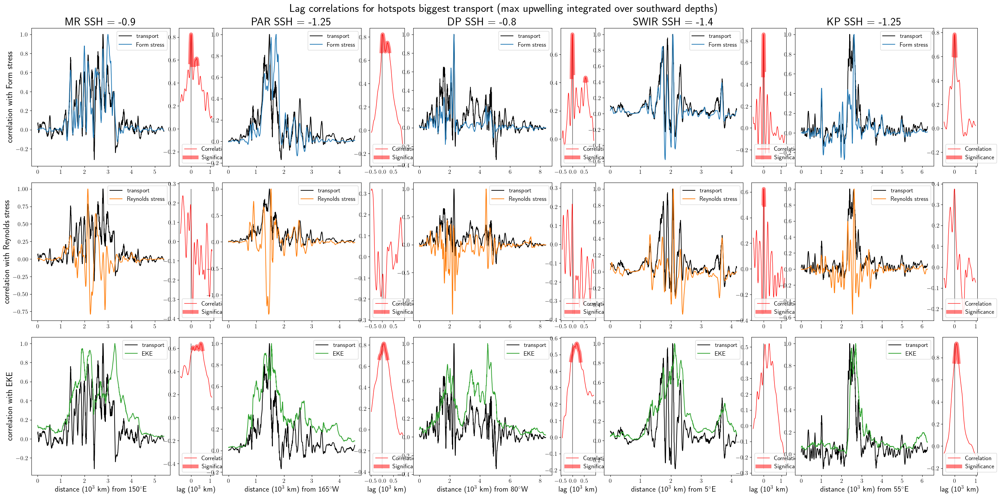

In [65]:
lon_start = ['150$^\circ$E','165$^\circ$W','80$^\circ$W','5$^\circ$E','55$^\circ$E']
fig, axes = plt.subplots(nrows = 3, ncols = 10, figsize = (30,15),gridspec_kw={'width_ratios': [1,0.25,1,0.25,1,0.25,1,0.25,1,0.25]})

for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    #a,b,c = find_best_contour(hotspot,rhoslice)
    index = [16,23,14,26,23][i]
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][index]
    # load calculated smoothed quantities and correlations
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E, distance_h, distance_corr = compute_corr_FRS_average_rho_range(hotspot,j_contour)
    # plot
    N_middle = int((len(distance_corr)-1)/2)
    axes[0,2*i].plot(distance_h,z_scaled, color = 'k', label = 'transport')
    axes[0,2*i].plot(distance_h,Form_scaled, color = 'C0', label = 'Form stress')
    #axes[0,2*i+1].yaxis.tick_right()
    axes[0,2*i+1].plot(distance_corr[N_middle-100:N_middle+200],corr_combined_F[N_middle-100:N_middle+200],'-r',linewidth=1,label='Correlation')
    axes[0,2*i+1].plot(distance_corr[N_middle-100:N_middle+200],(corr_combined_F*sig_combined_F)[N_middle-100:N_middle+200],color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[0,2*i+1].vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
    axes[0,2*i+1].legend(loc = 'lower left')
    axes[0,2*i].legend(loc = 'upper right')
    axes[0,2*i].set_title(hotspot+' SSH = '+str(contour_dict[j_contour]['SSH']), fontsize = 24)
    
    axes[1,2*i].plot(distance_h,z_scaled, color = 'k', label = 'transport')
    axes[1,2*i].plot(distance_h,Reynolds_scaled, color = 'C1', label = 'Reynolds stress')
    #axes[1,2*i+1].yaxis.tick_right()
    axes[1,2*i+1].plot(distance_corr[N_middle-100:N_middle+200],corr_combined_R[N_middle-100:N_middle+200],'-r',linewidth=1,label='Correlation')
    axes[1,2*i+1].plot(distance_corr[N_middle-100:N_middle+200],(corr_combined_R*sig_combined_R)[N_middle-100:N_middle+200],color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[1,2*i+1].vlines(0,np.min(corr_combined_R),np.max(corr_combined_R), color = 'grey')
    axes[1,2*i+1].legend(loc = 'lower left')
    axes[1,2*i].legend(loc = 'upper right')

    axes[2,2*i].plot(distance_h,z_scaled, color = 'k', label = 'transport')
    axes[2,2*i].plot(distance_h,EKE_scaled, color = 'C2', label = 'EKE')
    #axes[2,2*i+1].yaxis.tick_right()
    axes[2,2*i+1].plot(distance_corr[N_middle-100:N_middle+200],corr_combined_E[N_middle-100:N_middle+200],'-r',linewidth=1,label='Correlation')
    axes[2,2*i+1].plot(distance_corr[N_middle-100:N_middle+200],(corr_combined_E*sig_combined_E)[N_middle-100:N_middle+200],color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[2,2*i+1].vlines(0,np.min(corr_combined_E),np.max(corr_combined_E), color = 'grey')
    axes[2,2*i].legend(loc = 'upper right')
    axes[2,2*i+1].legend(loc = 'lower left')
    axes[2,2*i].set_xlabel('distance (10$^3$ km) from '+lon_start[i], fontsize = 16)
    axes[2,2*i+1].set_xlabel('lag (10$^3$ km)', fontsize = 16)

axes[0,0].set_ylabel('correlation with Form stress', fontsize = 18)
axes[1,0].set_ylabel('correlation with Reynolds stress', fontsize = 18)
axes[2,0].set_ylabel('correlation with EKE', fontsize = 18)


fig.suptitle('Lag correlations for hotspots biggest transport (max upwelling integrated over southward depths)', fontsize = 24)
#plt.savefig('temp.png',dpi = 400)
plt.tight_layout()
plt.subplots_adjust(wspace = 0.1)

# calculate downstream metric
two ways:
- find maximum correlated distance for every contour, ignore if not significant. take mean across contours and stdev/N where N is no. contours
- find all significant distances for each each contour, ignore if not significant. take mean across all distances and contours and stdev/N where N is no. distances that are significant (this has a very small error, maybe not right)

total
9
slice(array(1032.20006365), array(1032.5), None)
8.329022960413521
97.82777060846884 101.6605047054675
1.2207232515051247
114.92978433667065 120.1713708900992
3.508396360585382
94.28927545972708 98.10336386755445
10
slice(array(1032.20006365), array(1032.5), None)
8.116869040477116
93.92526016091735 98.27389044930936
1.3100862975107397
105.4496337953103 111.04631621158063
3.7045651719729302
87.4555818695972 90.51178240733859
11
slice(array(1032.20006365), array(1032.5), None)
8.637629733485825
120.67192506398014 132.6844276846691
2.960784832689423
128.35203087719697 139.15745251671578
5.794414080292386
112.78214426684384 122.13207708137688
12
slice(array(1032.20006365), array(1032.5), None)
6.475352673122495
52.45805353339261 58.62395872270047
3.5070600767308875
68.37704731255218 74.56419587236016
4.895724698594872
51.27661418693268 57.306542538545244
13
slice(array(1032.20006365), array(1032.5), None)
7.226750666885978
42.09194113941362 46.62822409732959
3.5749664945443445
64.

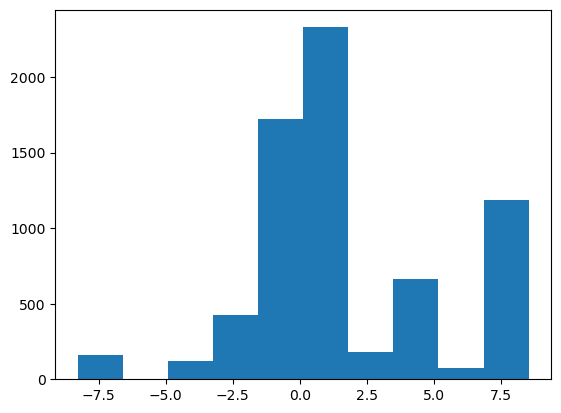

In [23]:
EKE_downstream = np.zeros((6,22))
EKE_downstream_all = [[]]
FS_downstream = np.zeros((6,22))
RS_downstream = np.zeros((6,22))

for i in np.array([5]):#np.arange(6):
    hotspot = ['MR','PAR','DP','SWIR','KP','total'][i]
    print(hotspot)
    EKE_downstream_all = []
    for j in np.arange(9,29):
        print(j)
        j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][j]
        # load calculated smoothed quantities and correlations
        z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E, distance_h, distance_corr = compute_corr_FRS_average_rho_range(hotspot,j_contour)
        sig_corr_region = corr_combined_E[np.isfinite(sig_combined_E)]
        sig_corr_region_distance = distance_corr[np.isfinite(sig_combined_E)]
        if len(sig_corr_region)==0:
            max_corr_dist = 0
        else:
            max_corr_dist = np.argmax(sig_corr_region)
            EKE_downstream[i,j-7]=sig_corr_region_distance[max_corr_dist]
            EKE_downstream_all = np.append(EKE_downstream_all, sig_corr_region_distance)

        sig_corr_region = corr_combined_F[np.isfinite(sig_combined_F)]
        sig_corr_region_distance = distance_corr[np.isfinite(sig_combined_F)]
        if len(sig_corr_region)==0:
            max_corr_dist = 0
        else:
            max_corr_dist = np.argmax(sig_corr_region)
            FS_downstream[i,j-7]=sig_corr_region[max_corr_dist]

        sig_corr_region = corr_combined_R[np.isfinite(sig_combined_R)]
        sig_corr_region_distance = distance_corr[np.isfinite(sig_combined_R)]
        if len(sig_corr_region)==0:
            max_corr_dist = 0
        else:
            max_corr_dist = np.argmax(sig_corr_region)
            RS_downstream[i,j-7]=sig_corr_region[max_corr_dist]
            
            
    print('mean')
    print(np.mean(EKE_downstream_all))
    print('stdev')
    print(np.std(EKE_downstream_all))
    print('N')
    print(len(EKE_downstream_all))
    print('stev/sqrtN')
    print(np.std(EKE_downstream_all)/np.sqrt(len(EKE_downstream_all)))
    plt.hist(EKE_downstream_all)
    plt.show()
        

In [24]:
EKE_downstream_dataset = xr.DataArray(EKE_downstream,
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP','total']), np.arange(-0.45,-1.51,-0.05)],
                                      dims = ['hotspot', 'SSH'],
                                      name = 'downstream_dist')
FS_downstream_dataset = xr.DataArray(FS_downstream,
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP','total']), np.arange(-0.45,-1.51,-0.05)],
                                      dims = ['hotspot', 'SSH'],
                                      name = 'downstream_dist')
RS_downstream_dataset = xr.DataArray(RS_downstream,
                                      coords = [np.array(['MR','PAR','DP','SWIR','KP','total']), np.arange(-0.45,-1.51,-0.05)],
                                      dims = ['hotspot', 'SSH'],
                                      name = 'downstream_dist')


MR
PAR
DP
SWIR
KP


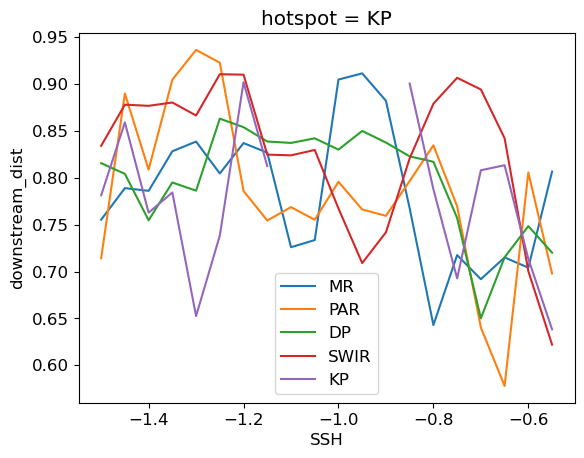

In [72]:
for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    print(hotspot)

    FS_downstream_dataset.where(FS_downstream_dataset!=0).sel(hotspot = hotspot).plot(label = hotspot)
plt.legend()

MR
PAR
DP
SWIR
KP


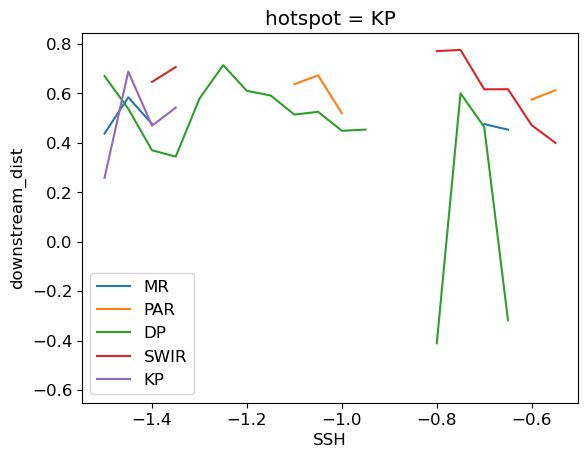

In [73]:
for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    print(hotspot)

    RS_downstream_dataset.where(RS_downstream_dataset!=0).sel(hotspot = hotspot).plot(label = hotspot)
plt.legend()

MR
0.014835180157001027
13.0
0.0568623499418954
PAR
0.06220002252604206
15.0
0.011392990663560977
DP
0.11588718630642338
18.0
0.01450979922992691
SWIR
0.36956152783203206
3.0
0.03688095653989799
KP
0.08847961360677085
9.0
0.017791706685064673


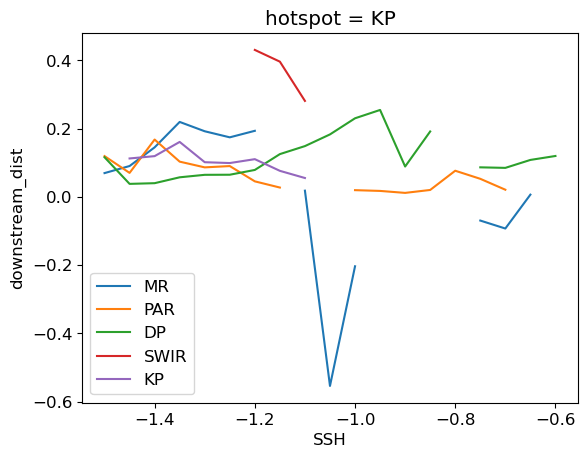

In [74]:
for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    print(hotspot)

    EKE_downstream_dataset.where(EKE_downstream_dataset!=0).sel(hotspot = hotspot).plot(label = hotspot)
    print(EKE_downstream_dataset.where(EKE_downstream_dataset!=0).sel(hotspot = hotspot).mean().values)
    N = (EKE_downstream_dataset.where(EKE_downstream_dataset!=0).sel(hotspot =hotspot)*0+1).sum()
    print(N.values)
    print(EKE_downstream_dataset.where(EKE_downstream_dataset!=0).sel(hotspot = hotspot).std().values/np.sqrt(N.values))
plt.legend()

total
0.12828120587479439
19.0
0.02357757383001165


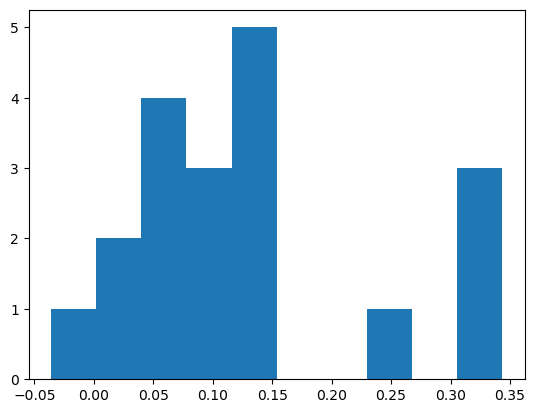

In [29]:
for i in np.arange(1):
    hotspot = 'total'#['MR','PAR','DP','SWIR','KP','total'][i]
    print(hotspot)

    plt.hist(EKE_downstream_dataset.where(EKE_downstream_dataset!=0).where(EKE_downstream_dataset<3).sel(hotspot = hotspot).values)
    print(EKE_downstream_dataset.where(EKE_downstream_dataset!=0).where(EKE_downstream_dataset<3).sel(hotspot = hotspot).mean().values)
    N = (EKE_downstream_dataset.where(EKE_downstream_dataset!=0).where(EKE_downstream_dataset<3).sel(hotspot =hotspot)*0+1).sum()
    print(N.values)
    print(EKE_downstream_dataset.where(EKE_downstream_dataset!=0).where(EKE_downstream_dataset<3).sel(hotspot = hotspot).std().values/np.sqrt(N.values))
    plt.show()

MR
0.014835180157001027
13.0
0.0568623499418954


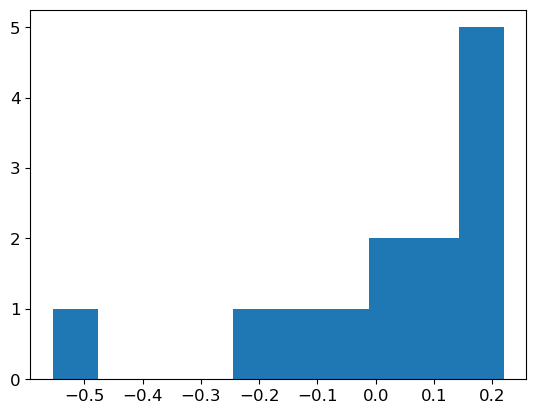

PAR
0.06220002252604206
15.0
0.011392990663560977


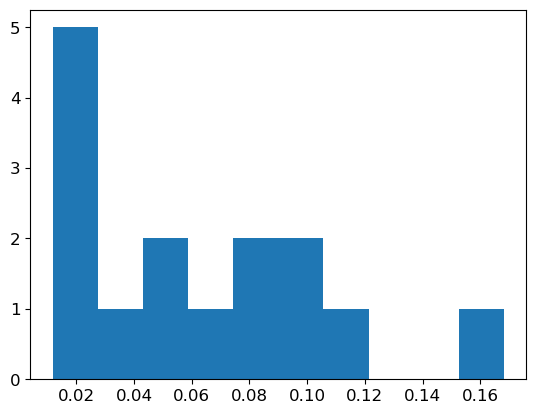

DP
0.11588718630642338
18.0
0.01450979922992691


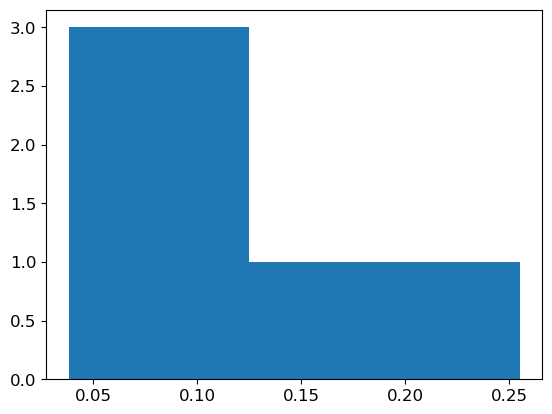

SWIR
0.36956152783203206
3.0
0.03688095653989799


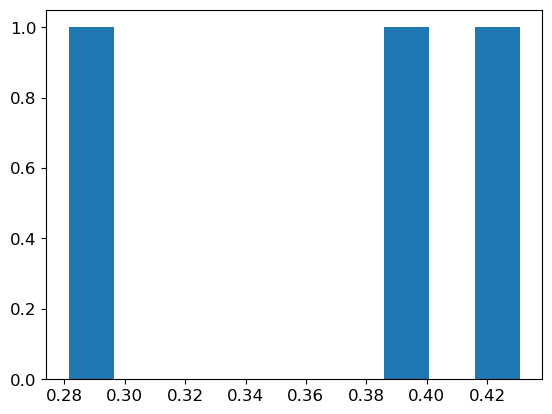

KP
0.08847961360677085
9.0
0.017791706685064673


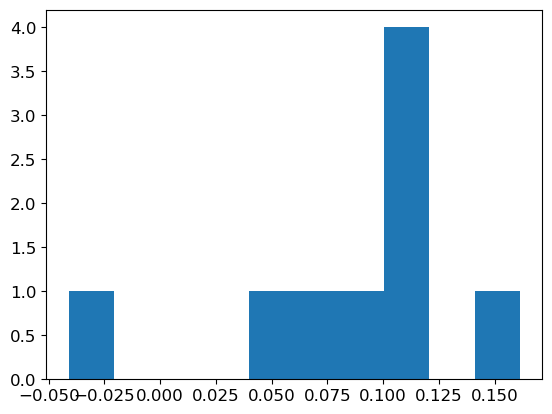

In [76]:
for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    print(hotspot)

    plt.hist(EKE_downstream_dataset.where(EKE_downstream_dataset!=0).sel(hotspot = hotspot).values)
    print(EKE_downstream_dataset.where(EKE_downstream_dataset!=0).sel(hotspot = hotspot).mean().values)
    N = (EKE_downstream_dataset.where(EKE_downstream_dataset!=0).sel(hotspot =hotspot)*0+1).sum()
    print(N.values)
    print(EKE_downstream_dataset.where(EKE_downstream_dataset!=0).sel(hotspot = hotspot).std().values/np.sqrt(N.values))
    plt.show()

In [21]:
def compute_corr_FRS_average_rho_range(hotspot,j_contour):
    N=10
    if contour_dict[j_contour]['shifted']==True:
        suffix = '_shiftedback'
        segment_length = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'segment_length'+suffix+'.nc').segment_length
    else:
        suffix = ''
        segment_length = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_segment_length'+suffix+'.nc').segment_length

    vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lat_along_contour
    lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon'+suffix+'.nc').lon_along_contour
    Form_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').Form_contour
    EKE_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').EKE_contour
    Reynolds_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').Reynolds_contour
    bottom_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_bottom_density_cutoffs.nc').bottom_cutoff.sel(hotspot = hotspot)
    top_cutoff = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/hotspot_top_density_cutoffs.nc').top_cutoff.sel(hotspot = hotspot)
    # mask out water that touches surface or bottom on average
    SSH = contour_dict[j_contour]['SSH']
    #if SSH > -0.45:
        #print('SSH too big!!')
    #rhoslice = slice(top_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0],bottom_cutoff.sel(SSH=slice(SSH-0.01,SSH+0.01)).values[0])
    #print(rhoslice)
    rhoslice = slice(top_cutoff.max('SSH').values,bottom_cutoff.min('SSH').values)
    print(rhoslice)
    # smooth by N running average
    eddy_notcumsum = (vh_eddy).sel(isopycnal_bins=rhoslice).sum('isopycnal_bins')
    y = uniform_filter1d(eddy_notcumsum, size=N)/segment_length.values
    y[y==np.inf]=0
    y[y==-np.inf]=0    
    y[y==np.nan]=0        
    Form_smoothed = uniform_filter1d(Form_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins'), size=N)/segment_length.values
    Form_smoothed[Form_smoothed==np.inf]=0
    Form_smoothed[Form_smoothed==-np.inf]=0  
    Form_smoothed[Form_smoothed==np.nan]=0  
    Reynolds_smoothed = uniform_filter1d(Reynolds_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins'), size=N)/segment_length.values
    Reynolds_smoothed[Reynolds_smoothed==np.inf]=0
    Reynolds_smoothed[Reynolds_smoothed==-np.inf]=0  
    Reynolds_smoothed[Reynolds_smoothed==np.nan]=0      
    EKE_smoothed = EKE_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins').values/segment_length.values
    EKE_smoothed[EKE_smoothed==np.inf]=0
    EKE_smoothed[EKE_smoothed==-np.inf]=0      
    EKE_smoothed[EKE_smoothed==np.nan]=0  

    # load values at hotpoTS
    if hotspot =='total':
        z_hot = -y
        z_scaled = z_hot/np.max(z_hot)
        Form_hot = Form_smoothed
        Form_scaled = Form_hot/np.max(Form_hot)
        Reynolds_hot = (Reynolds_smoothed)
        Reynolds_scaled = Reynolds_hot/np.max(Reynolds_hot)
        EKE_hot = (EKE_smoothed)
        EKE_scaled = EKE_hot/np.max(EKE_hot)
        
    elif hotspot == 'KP':
        lower_index1, upper_index1 = find_lower_upper_indices('KP1', j_contour)
        lower_index2, upper_index2 = find_lower_upper_indices('KP2', j_contour)
        z_hot = np.append(-(y)[lower_index1:upper_index1],-(y)[lower_index2:upper_index2])
        z_scaled = z_hot/np.max(z_hot)
        Form_hot = np.append((Form_smoothed)[lower_index1:upper_index1],(Form_smoothed)[lower_index2:upper_index2])
        Form_scaled = Form_hot/np.max(Form_hot)
        Reynolds_hot = np.append((Reynolds_smoothed)[lower_index1:upper_index1],(Reynolds_smoothed)[lower_index2:upper_index2])
        Reynolds_scaled = Reynolds_hot/np.max(Reynolds_hot)
        EKE_hot = np.append((EKE_smoothed)[lower_index1:upper_index1],(EKE_smoothed)[lower_index2:upper_index2])
        EKE_scaled = EKE_hot/np.max(EKE_hot)
    else:
        lower_index, upper_index = find_lower_upper_indices(hotspot, j_contour)
        z_hot = -(y)[lower_index:upper_index]
        z_scaled = z_hot/np.max(z_hot)
        Form_hot = (Form_smoothed)[lower_index:upper_index]
        Form_scaled = Form_hot/np.max(Form_hot)
        Reynolds_hot = (Reynolds_smoothed)[lower_index:upper_index]
        Reynolds_scaled = Reynolds_hot/np.max(Reynolds_hot)
        EKE_hot = (EKE_smoothed)[lower_index:upper_index]
        EKE_scaled = EKE_hot/np.max(EKE_hot)
        
    #compute correlations and combine negative and positive lags
    c_cor = Compute_Correlation(z_scaled, Form_scaled)
    c_cor2 = Compute_Correlation(Form_scaled,z_scaled)
    corr,sig,t,N = c_cor.cor_series()
    print(max(t))
    print(min(N), max(N))
    corr2,sig2,t2,N2 = c_cor2.cor_series()
    corr_combined_F = np.append(np.flip(corr2[1:]),corr)
    sig_combined_F = np.append(np.flip(sig2[1:]),sig)

    c_cor = Compute_Correlation(z_scaled, Reynolds_scaled)
    c_cor2 = Compute_Correlation(Reynolds_scaled,z_scaled)
    corr,sig,t,N = c_cor.cor_series()
    print(max(t))
    print(min(N),max(N))
    corr2,sig2,t2,N2 = c_cor2.cor_series()
    corr_combined_R = np.append(np.flip(corr2[1:]),corr)
    sig_combined_R = np.append(np.flip(sig2[1:]),sig)

    c_cor = Compute_Correlation(z_scaled,EKE_scaled)
    c_cor2 = Compute_Correlation(EKE_scaled,z_scaled)
    corr,sig,t,N = c_cor.cor_series()
    print(max(t))
    print(min(N),max(N))
    corr2,sig2,t2,N2 = c_cor2.cor_series()
    corr_combined_E = np.append(np.flip(corr2[1:]),corr)
    sig_combined_E = np.append(np.flip(sig2[1:]),sig)
    
    if hotspot =='total':
        distance_h = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_distance_along_contour.nc').distance
    else:
        distance_h = distance(hotspot,j_contour)
    distance_small = distance_h[0:int((len(corr_combined_F)+1)/2)]
    distance_combined = np.append(-np.flip(distance_small)[:-1],distance_small)
    
    return z_hot, Form_hot, Reynolds_hot, EKE_hot, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E, distance_h, distance_combined


In [67]:
plt.rc('text', usetex=False)
plt.rcParams.update({'font.size': 12})


slice(array(1032.2962295), array(1032.51), None)
5.971197765746918
10.159135574928115 11.525906516663174
0.9037098494768248
12.494713572608227 13.823964364284677
2.075004258204364
8.28476236955834 9.584768212841855
slice(array(1032.22305317), array(1032.5), None)
5.780891747259511
5.827662736639889 6.2201627744782995
0.5910934503088847
9.50898571914709 10.446316814425684
2.7973088761651264
5.3918602000017515 6.00367827369871
slice(array(1032.13010113), array(1032.48), None)
5.009656739239448
12.650407411968189 14.284431670347077
1.5283356615086376
21.60975815817041 23.44945463256254
2.165868049223246
11.304530785967694 13.13730820342161
slice(array(1032.13490907), array(1032.48), None)
7.702225642324606
17.834045333336682 18.444390610155082
3.5082777704890358
17.17411444678074 17.773960806022487
1.9310953404456965
11.999225618770067 12.719480281778631
slice(array(1032.19249245), array(1032.48), None)
3.5650195231668387
10.197099502689298 10.650670270292139
1.4007455555515196
13.4010267

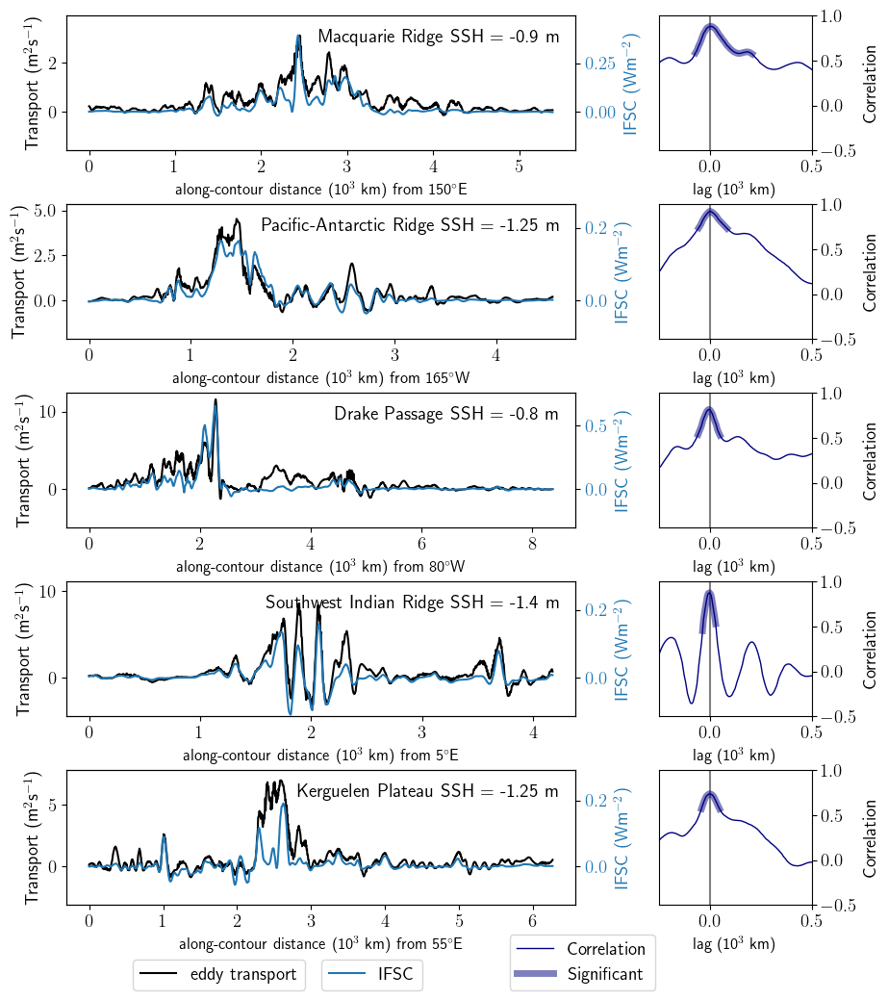

In [38]:
lon_start = ['150$^\circ$E','165$^\circ$W','80$^\circ$W','5$^\circ$E','55$^\circ$E']
fig, axes = plt.subplots(nrows = 5, ncols = 2, figsize = (10,12),gridspec_kw={'width_ratios': [1,0.3]})

for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    hotspotname = ['Macquarie Ridge','Pacific-Antarctic Ridge','Drake Passage','Southwest Indian Ridge','Kerguelen Plateau'][i]
    index = [16,23,14,26,23][i]
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][index]
    # load calculated smoothed quantities and correlations
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E, distance_h, distance_corr = compute_corr_FRS_average_rho_range(hotspot,j_contour)

    # plot FS
    N_middle = int((len(distance_corr)-1)/2)
    axes[i,0].plot(distance_h,z_scaled, color = 'k', label = 'eddy transport')
    axes[i,0].set_ylabel('Transport (m$^2$s$^{-1}$)')
    #axes[0,2*i+1].yaxis.tick_right()
    axes[i,1].plot(distance_corr[N_middle-100:N_middle+200],corr_combined_F[N_middle-100:N_middle+200],color = 'navy',linewidth=1,label='Correlation')
    axes[i,1].plot(distance_corr[N_middle-100:N_middle+200],(corr_combined_F*sig_combined_F)[N_middle-100:N_middle+200],color='navy',linewidth=5,alpha=0.5,label="Significant")
    axes[i,1].vlines(0,-0.5,1, color = 'grey')
    axes[i,0].text(0.97,0.8,hotspotname+'    SSH = '+str(contour_dict[j_contour]['SSH'])+' m', 
                   fontsize = 14, transform=axes[i,0].transAxes, ha = 'right')
    ax2 = axes[i,0].twinx()  # instantiate a second axes that shares the same x-axis
    ax2.set_ylabel('IFSC (Wm$^{-2}$)', color='C0')  # we already handled the x-label with ax1
    ax2.tick_params(axis='y', labelcolor='C0')
    ax2.plot(distance_h,Form_scaled, color = 'C0', label = 'IFSC')
    axes[i,1].yaxis.tick_right()
    axes[i,1].yaxis.set_label_position("right")
    axes[i,1].set_ylabel('Correlation')
    axes[i,1].set_ylim(-0.5,1)
    axes[i,1].set_xlim(-0.25,0.5)
    if i ==3:
        axes[i,0].set_ylim(-(z_scaled.max()+2.5)/2.5,z_scaled.max()+2.5)
        ax2.set_ylim(-(Form_scaled.max()+0.125)/2.5,Form_scaled.max()+0.125)        
    else:
        axes[i,0].set_ylim(-(z_scaled.max()+0.8)/2.5,z_scaled.max()+0.8)
        ax2.set_ylim(-(Form_scaled.max()+0.1)/2.5,Form_scaled.max()+0.1)
    
#     # plot RS
#     axes[i,2].plot(distance_h,z_scaled, color = 'k', label = 'transport')
#     axes[i,2].plot(distance_h,Reynolds_scaled, color = 'C1', label = 'Reynolds stress')
#     #axes[1,2*i+1].yaxis.tick_right()
#     axes[i,3].plot(distance_corr[N_middle-100:N_middle+200],corr_combined_R[N_middle-100:N_middle+200],color = 'C1',linewidth=1,label='Corr')
#     axes[i,3].plot(distance_corr[N_middle-100:N_middle+200],(corr_combined_R*sig_combined_R)[N_middle-100:N_middle+200],color='C1',linewidth=8,alpha=0.5,label="Sig")
#     axes[i,3].vlines(0,np.min(corr_combined_R),np.max(corr_combined_R), color = 'grey')
#     axes[i,3].legend(loc = 'lower left')
#     axes[i,2].legend(loc = 'upper right')

#     # plot EKE
#     axes[i,4].plot(distance_h,z_scaled, color = 'k', label = 'transport')
#     axes[i,4].plot(distance_h,EKE_scaled, color = 'C2', label = 'EKE')
#     #axes[2,2*i+1].yaxis.tick_right()
#     axes[i,5].plot(distance_corr[N_middle-100:N_middle+200],corr_combined_E[N_middle-100:N_middle+200],color = 'C2',linewidth=1,label='Corr')
#     axes[i,5].plot(distance_corr[N_middle-100:N_middle+200],(corr_combined_E*sig_combined_E)[N_middle-100:N_middle+200],color='C2',linewidth=8,alpha=0.5,label="Sig")
#     axes[i,5].vlines(0,np.min(corr_combined_E),np.max(corr_combined_E), color = 'grey')
#     axes[i,4].legend(loc = 'upper right')
#     axes[i,5].legend(loc = 'lower left')

    # axes labels
    axes[i,0].set_xlabel('along-contour distance (10$^3$ km) from '+lon_start[i], fontsize = 12)
    axes[i,1].set_xlabel('lag (10$^3$ km)', fontsize = 12)
#     axes[i,2].set_xlabel('distance (10$^3$ km) from '+lon_start[i], fontsize = 12)
#     axes[i,3].set_xlabel('lag (10$^3$ km)', fontsize = 12)    
#    axes[i,4].set_xlabel('distance (10$^3$ km) from '+lon_start[i], fontsize = 12)
#    axes[i,5].set_xlabel('lag (10$^3$ km)', fontsize = 12)
axes[4,1].legend(bbox_to_anchor = (-0.5,-0.7), loc = 'lower center')
ax2.legend(bbox_to_anchor = (0.6,-0.7), loc = 'lower center')
axes[4,0].legend(bbox_to_anchor = (0.3,-0.7), loc = 'lower center')

#axes[0,0].set_title('correlation with Form stress', fontsize = 18)
# axes[0,2].set_title('correlation with Reynolds stress', fontsize = 18)
#axes[0,4].set_title('correlation with EKE', fontsize = 18)


#fig.suptitle('Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)', fontsize = 24)
#plt.savefig('temp.png',dpi = 400)
#plt.tight_layout()
plt.subplots_adjust(hspace = 0.4)
plt.subplots_adjust(wspace = 0.25)

fig.savefig('FScorr.png')

slice(array(1032.2962295), array(1032.51), None)
5.971197765746918
10.159135574928115 11.525906516663174
0.9037098494768248
12.494713572608227 13.823964364284677
2.075004258204364
8.28476236955834 9.584768212841855
slice(array(1032.22305317), array(1032.5), None)
5.780891747259511
5.827662736639889 6.2201627744782995
0.5910934503088847
9.50898571914709 10.446316814425684
2.7973088761651264
5.3918602000017515 6.00367827369871
slice(array(1032.13010113), array(1032.48), None)
5.009656739239448
12.650407411968189 14.284431670347077
1.5283356615086376
21.60975815817041 23.44945463256254
2.165868049223246
11.304530785967694 13.13730820342161
slice(array(1032.13490907), array(1032.48), None)
7.702225642324606
17.834045333336682 18.444390610155082
3.5082777704890358
17.17411444678074 17.773960806022487
1.9310953404456965
11.999225618770067 12.719480281778631
slice(array(1032.19249245), array(1032.48), None)
3.5650195231668387
10.197099502689298 10.650670270292139
1.4007455555515196
13.4010267

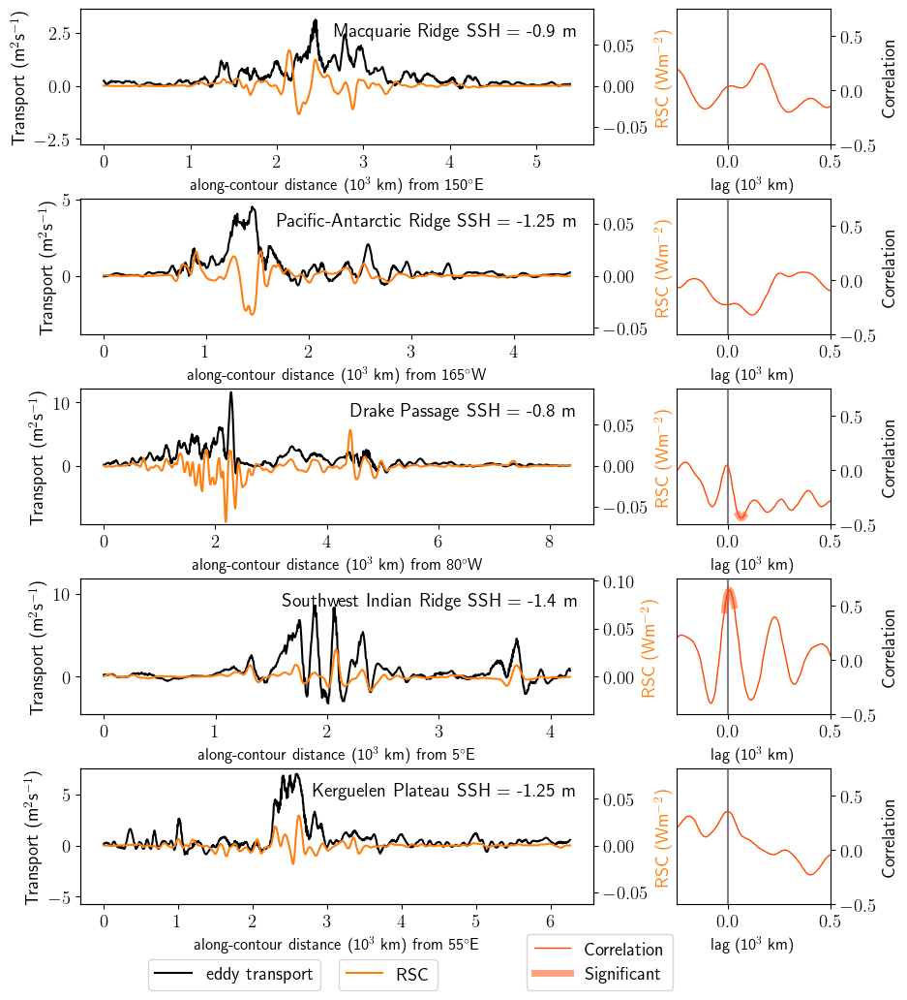

In [39]:
lon_start = ['150$^\circ$E','165$^\circ$W','80$^\circ$W','5$^\circ$E','55$^\circ$E']
fig, axes = plt.subplots(nrows = 5, ncols = 2, figsize = (10,12),gridspec_kw={'width_ratios': [1,0.3]})

for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    hotspotname = ['Macquarie Ridge','Pacific-Antarctic Ridge','Drake Passage','Southwest Indian Ridge','Kerguelen Plateau'][i]

    index = [16,23,14,26,23][i]
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][index]
    # load calculated smoothed quantities and correlations
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E, distance_h, distance_corr = compute_corr_FRS_average_rho_range(hotspot,j_contour)

    # plot FS
    N_middle = int((len(distance_corr)-1)/2)
    axes[i,0].plot(distance_h,z_scaled, color = 'k', label = 'eddy transport')
    axes[i,0].set_ylabel('Transport (m$^2$s$^{-1}$)')
    #axes[0,2*i+1].yaxis.tick_right()
    axes[i,1].plot(distance_corr[N_middle-100:N_middle+200],corr_combined_R[N_middle-100:N_middle+200],color = 'orangered',linewidth=1,label='Correlation')
    axes[i,1].plot(distance_corr[N_middle-100:N_middle+200],(corr_combined_R*sig_combined_R)[N_middle-100:N_middle+200],color='orangered',linewidth=5,alpha=0.5,label="Significant")
    axes[i,1].vlines(0,-1,1, color = 'grey')
    axes[i,0].text(0.97,0.8,hotspotname+'    SSH = '+str(contour_dict[j_contour]['SSH'])+' m', 
                   fontsize = 14, transform=axes[i,0].transAxes, ha = 'right')
    ax2 = axes[i,0].twinx()  # instantiate a second axes that shares the same x-axis
    ax2.set_ylabel('RSC (Wm$^{-2}$)', color='C1')  # we already handled the x-label with ax1
    ax2.tick_params(axis='y', labelcolor='k')
    ax2.plot(distance_h,Reynolds_scaled, color = 'C1', label = 'RSC')
    axes[i,1].yaxis.tick_right()
    axes[i,1].yaxis.set_label_position("right")
    axes[i,1].set_ylabel('Correlation')
    axes[i,1].set_ylim(-0.5,0.75)
    axes[i,1].set_xlim(-0.25,0.5)
    if i==3:
        axes[i,0].set_ylim(-(z_scaled.max()+0.5)/2,(z_scaled.max()+0.5)*1.3)
        ax2.set_ylim(-(Reynolds_scaled.max()+0.05)/2,(Reynolds_scaled.max()+0.05)*1.3)      
    else:
        axes[i,0].set_ylim(-(z_scaled.max()+0.5)/1.3,z_scaled.max()+0.5)
        ax2.set_ylim(-(Reynolds_scaled.max()+0.05)/1.3,Reynolds_scaled.max()+0.05)

#     # plot RS
#     axes[i,2].plot(distance_h,z_scaled, color = 'k', label = 'transport')
#     axes[i,2].plot(distance_h,Reynolds_scaled, color = 'C1', label = 'Reynolds stress')
#     #axes[1,2*i+1].yaxis.tick_right()
#     axes[i,3].plot(distance_corr[N_middle-100:N_middle+200],corr_combined_R[N_middle-100:N_middle+200],color = 'C1',linewidth=1,label='Corr')
#     axes[i,3].plot(distance_corr[N_middle-100:N_middle+200],(corr_combined_R*sig_combined_R)[N_middle-100:N_middle+200],color='C1',linewidth=8,alpha=0.5,label="Sig")
#     axes[i,3].vlines(0,np.min(corr_combined_R),np.max(corr_combined_R), color = 'grey')
#     axes[i,3].legend(loc = 'lower left')
#     axes[i,2].legend(loc = 'upper right')

#     # plot EKE
#     axes[i,4].plot(distance_h,z_scaled, color = 'k', label = 'transport')
#     axes[i,4].plot(distance_h,EKE_scaled, color = 'C2', label = 'EKE')
#     #axes[2,2*i+1].yaxis.tick_right()
#     axes[i,5].plot(distance_corr[N_middle-100:N_middle+200],corr_combined_E[N_middle-100:N_middle+200],color = 'C2',linewidth=1,label='Corr')
#     axes[i,5].plot(distance_corr[N_middle-100:N_middle+200],(corr_combined_E*sig_combined_E)[N_middle-100:N_middle+200],color='C2',linewidth=8,alpha=0.5,label="Sig")
#     axes[i,5].vlines(0,np.min(corr_combined_E),np.max(corr_combined_E), color = 'grey')
#     axes[i,4].legend(loc = 'upper right')
#     axes[i,5].legend(loc = 'lower left')

    # axes labels
    axes[i,0].set_xlabel('along-contour distance (10$^3$ km) from '+lon_start[i], fontsize = 12)
    axes[i,1].set_xlabel('lag (10$^3$ km)', fontsize = 12)
#     axes[i,2].set_xlabel('distance (10$^3$ km) from '+lon_start[i], fontsize = 12)
#     axes[i,3].set_xlabel('lag (10$^3$ km)', fontsize = 12)    
#    axes[i,4].set_xlabel('distance (10$^3$ km) from '+lon_start[i], fontsize = 12)
#    axes[i,5].set_xlabel('lag (10$^3$ km)', fontsize = 12)
axes[4,1].legend(bbox_to_anchor = (-0.5,-0.7), loc = 'lower center')
ax2.legend(bbox_to_anchor = (0.6,-0.7), loc = 'lower center')
axes[4,0].legend(bbox_to_anchor = (0.3,-0.7), loc = 'lower center')

#axes[0,0].set_title('correlation with Form stress', fontsize = 18)
# axes[0,2].set_title('correlation with Reynolds stress', fontsize = 18)
#axes[0,4].set_title('correlation with EKE', fontsize = 18)


#fig.suptitle('Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)', fontsize = 24)
#plt.savefig('temp.png',dpi = 400)
#plt.tight_layout()
plt.subplots_adjust(hspace = 0.4)
plt.subplots_adjust(wspace = 0.25)

fig.savefig('RScorr.png')

slice(array(1032.2962295), array(1032.51), None)
5.971197765746918
10.159135574928115 11.525906516663174
0.9037098494768248
12.494713572608227 13.823964364284677
2.075004258204364
8.28476236955834 9.584768212841855
slice(array(1032.22305317), array(1032.5), None)
5.780891747259511
5.827662736639889 6.2201627744782995
0.5910934503088847
9.50898571914709 10.446316814425684
2.7973088761651264
5.3918602000017515 6.00367827369871
slice(array(1032.13010113), array(1032.48), None)
5.009656739239448
12.650407411968189 14.284431670347077
1.5283356615086376
21.60975815817041 23.44945463256254
2.165868049223246
11.304530785967694 13.13730820342161
slice(array(1032.13490907), array(1032.48), None)
7.702225642324606
17.834045333336682 18.444390610155082
3.5082777704890358
17.17411444678074 17.773960806022487
1.9310953404456965
11.999225618770067 12.719480281778631
slice(array(1032.19249245), array(1032.48), None)
3.5650195231668387
10.197099502689298 10.650670270292139
1.4007455555515196
13.4010267

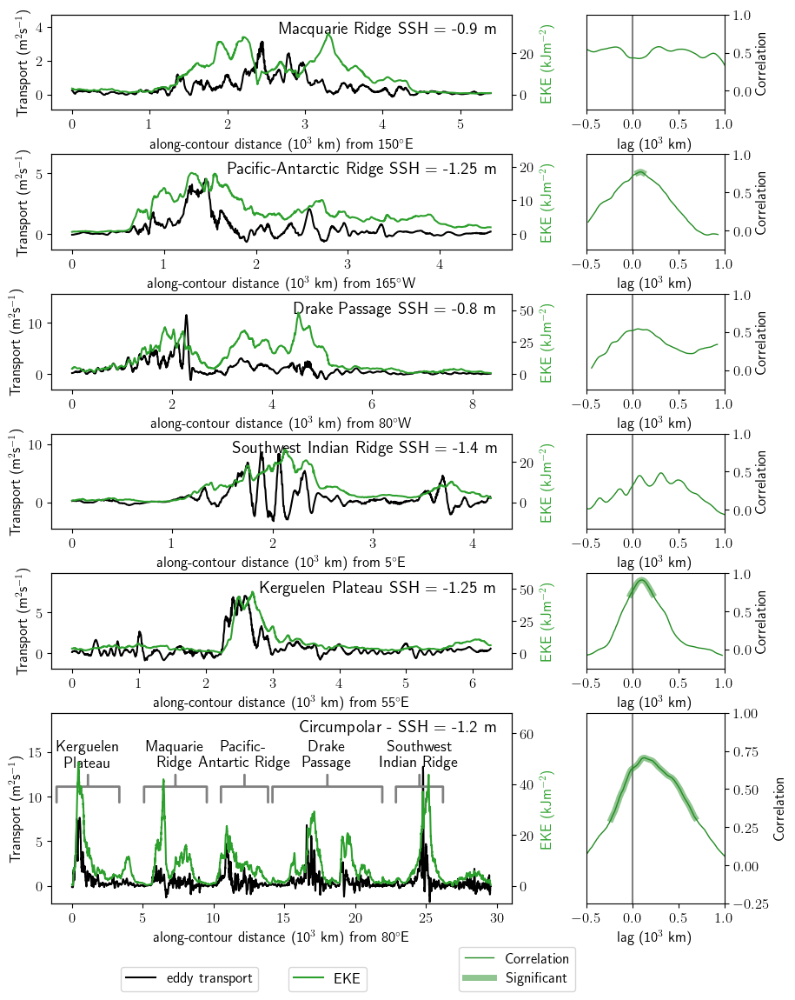

In [45]:
lon_start = ['150$^\circ$E','165$^\circ$W','80$^\circ$W','5$^\circ$E','55$^\circ$E']
fig, axes = plt.subplots(nrows = 6, ncols = 2, figsize = (10,14),gridspec_kw={'width_ratios': [1,0.3], 'height_ratios':[1,1,1,1,1,2]})

for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    hotspotname = ['Macquarie Ridge','Pacific-Antarctic Ridge','Drake Passage','Southwest Indian Ridge','Kerguelen Plateau'][i]

    index = [16,23,14,26,23][i]
#    index = [10,13,13,26,23][i]
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][index]
    # load calculated smoothed quantities and correlations
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E, distance_h, distance_corr = compute_corr_FRS_average_rho_range(hotspot,j_contour)

    # plot FS
    N_middle = int((len(distance_corr)-1)/2)
    axes[i,0].plot(distance_h,z_scaled, color = 'k', label = 'eddy transport')
    axes[i,0].set_ylabel('Transport (m$^2$s$^{-1}$)')
    #axes[0,2*i+1].yaxis.tick_right()
    axes[i,1].plot(distance_corr[N_middle-100:N_middle+200],corr_combined_E[N_middle-100:N_middle+200],color = 'forestgreen',linewidth=1,label='Correlation')
    axes[i,1].plot(distance_corr[N_middle-100:N_middle+200],(corr_combined_E*sig_combined_E)[N_middle-100:N_middle+200],color='forestgreen',linewidth=5,alpha=0.5,label="Significant")
    axes[i,1].vlines(0,-1,1, color = 'grey')
    axes[i,0].text(0.97,0.8,hotspotname+'    SSH = '+str(contour_dict[j_contour]['SSH'])+' m', 
                   fontsize = 14, transform=axes[i,0].transAxes, ha = 'right')
    ax2 = axes[i,0].twinx()  # instantiate a second axes that shares the same x-axis
    ax2.set_ylabel('EKE (kJm$^{-2}$)', color='C2')  # we already handled the x-label with ax1
    ax2.tick_params(axis='y', labelcolor='k')
    ax2.plot(distance_h,EKE_scaled/1e3, color = 'C2', label = 'EKE')
    axes[i,1].yaxis.tick_right()
    axes[i,1].yaxis.set_label_position("right")
    axes[i,1].set_ylabel('Correlation')
    axes[i,1].set_ylim(-0.25,1)
    axes[i,1].set_xlim(-0.5,1)
    axes[i,0].set_ylim(-(z_scaled.max()+0.5)/4,(z_scaled.max()+0.5)*1.3)
    ax2.set_ylim(-((EKE_scaled/1e3).max()+0.05)/4,((EKE_scaled/1e3).max()+0.05)*1.3)
    if i ==3:
        axes[i,0].set_ylim(-(z_scaled.max()+0.5)/2,(z_scaled.max()+0.5)*1.3)
        ax2.set_ylim(-((EKE_scaled/1e3).max()+0.05)/2,((EKE_scaled/1e3).max()+0.05)*1.3)

    # axes labels
    axes[i,0].set_xlabel('along-contour distance (10$^3$ km) from '+lon_start[i], fontsize = 12)
    axes[i,1].set_xlabel('lag (10$^3$ km)', fontsize = 12)


j_contour ='L'
rhoslice = slice(1032.2,1032.5)
N= 10
if contour_dict[j_contour]['shifted']==True:
    suffix = '_shiftedback'
else:
    suffix = ''
vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+suffix+'.nc').vh_eddy
SSH = contour_dict[j_contour]['SSH']
print(str(rhoslice))
eddy_notcumsum = -(vh_eddy).sel(isopycnal_bins=rhoslice).sum('isopycnal_bins')
segment_length = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_segment_length'+suffix+'.nc').segment_length
y = uniform_filter1d(eddy_notcumsum, size=N)/segment_length.values
z_scaled = y
EKE_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies'+suffix+'.nc').EKE_contour
EKE_scaled = EKE_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins').values/segment_length.values
c_cor = Compute_Correlation(z_scaled,EKE_scaled)
c_cor2 = Compute_Correlation(EKE_scaled,z_scaled)
corr,sig,t,N = c_cor.cor_series()
print(max(t))
print(min(N),max(N))
corr2,sig2,t2,N2 = c_cor2.cor_series()
corr_combined_E = np.append(np.flip(corr2[1:]),corr)
sig_combined_E = np.append(np.flip(sig2)[1:],sig)
distance_h = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_distance_along_contour.nc').distance
distance_small = distance_h[0:len(corr)]
distance_corr = np.append(-np.flip(distance_small)[:-1],distance_small)

i = 5
N_middle = int((len(distance_corr)-1)/2)
axes[i,0].plot(distance_h,z_scaled, color = 'k', label = 'eddy transport')
axes[i,0].set_ylabel('Transport (m$^2$s$^{-1}$)')
#axes[0,2*i+1].yaxis.tick_right()
axes[i,1].plot(distance_corr[N_middle-100:N_middle+200],corr_combined_E[N_middle-100:N_middle+200],color = 'forestgreen',linewidth=1,label='Correlation')
axes[i,1].plot(distance_corr[N_middle-100:N_middle+200],(corr_combined_E*sig_combined_E)[N_middle-100:N_middle+200],color='forestgreen',linewidth=5,alpha=0.5,label="Significant")
axes[i,1].vlines(0,-1,1, color = 'grey')
axes[i,0].text(0.97,0.9,'Circumpolar - SSH = '+str(contour_dict[j_contour]['SSH'])+' m', 
               fontsize = 14, transform=axes[i,0].transAxes, ha = 'right')
ax2 = axes[i,0].twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_ylabel('EKE (kJm$^{-2}$)', color='C2')  # we already handled the x-label with ax1
ax2.tick_params(axis='y', labelcolor='k')
ax2.plot(distance_h,EKE_scaled/1e3, color = 'C2', label = 'EKE')
axes[i,1].yaxis.tick_right()
axes[i,1].yaxis.set_label_position("right")
axes[i,1].set_ylabel('Correlation')
axes[i,1].set_ylim(-0.25,1)
axes[i,1].set_xlim(-0.5,1)
axes[i,0].set_ylim(-(z_scaled.max()+0.5)/7,(z_scaled.max()+0.5)*1.4)
ax2.set_ylim(-((EKE_scaled/1e3).max()+0.05)/7,((EKE_scaled/1e3).max()+0.05)*1.4)

# axes labels
axes[i,0].set_xlabel('along-contour distance (10$^3$ km) from 80$^\circ$E', fontsize = 12)
axes[i,1].set_xlabel('lag (10$^3$ km)', fontsize = 12)
#ax.set_title('contour SSH=-1.2m, $\sigma_1$=(1032,1032.5)')
#plt.subplots_adjust(wspace = 0)
axes[i,0].annotate('Kerguelen \n Plateau', xy=(0.08, 0.60), xytext=(0.08, 0.7), xycoords='axes fraction', 
            fontsize=13, ha='center', va='bottom',
            #bbox=dict(boxstyle='square', fc='white'),
            arrowprops=dict(arrowstyle='-[, widthB=2.0, lengthB=1', lw=2.0, color = 'grey'))
axes[i,0].annotate('Maquarie \n Ridge', xy=(0.27, 0.60), xytext=(0.27, 0.7), xycoords='axes fraction', 
            fontsize=13, ha='center', va='bottom',
            #bbox=dict(boxstyle='square', fc='white'),
            arrowprops=dict(arrowstyle='-[, widthB=2.0, lengthB=1', lw=2.0, color = 'grey'))
axes[i,0].annotate('Pacific-\n Antartic Ridge', xy=(0.42, 0.60), xytext=(0.42, 0.7), xycoords='axes fraction', 
            fontsize=13, ha='center', va='bottom',
            #bbox=dict(boxstyle='square', fc='white'),
            arrowprops=dict(arrowstyle='-[, widthB=1.5, lengthB=1', lw=2.0, color = 'grey'))
axes[i,0].annotate('Drake \n Passage', xy=(0.6, 0.60), xytext=(0.6, 0.7), xycoords='axes fraction', 
            fontsize=13, ha='center', va='bottom',
            #bbox=dict(boxstyle='square', fc='white'),
            arrowprops=dict(arrowstyle='-[, widthB=3.5, lengthB=1', lw=2.0, color = 'grey'))
axes[i,0].annotate('Southwest \n Indian Ridge', xy=(0.8, 0.60), xytext=(0.8, 0.7), xycoords='axes fraction', 
            fontsize=13, ha='center', va='bottom',
            #bbox=dict(boxstyle='square', fc='white'),
            arrowprops=dict(arrowstyle='-[, widthB=1.5, lengthB=1', lw=2.0, color = 'grey'))
plt.subplots_adjust(hspace = 0.4, wspace = 0.25, bottom = 0.15)

axes[5,1].legend(bbox_to_anchor = (-0.5,-0.5), loc = 'lower center')
ax2.legend(bbox_to_anchor = (0.6,-0.5), loc = 'lower center')
axes[5,0].legend(bbox_to_anchor = (0.3,-0.5), loc = 'lower center')

fig.savefig('EKE_hotspots_corr.png',dpi = 400)

# justification/choices of contour, density, smoothing, width

- chose contour with maximum eddy transport (masking out mean northward transport and densities that toouch surface/bottom)
- then chose max density of deepest southward transport and shallowest southward transport (alternative: **1032** is good - justified by min rho of strong southward eddy trans? from overturning)
- smoothed eddy trans by 1 degrees to get rid of fuzziness (N=10) 
- smoothed FS and RS (but **not** EKE) by the same
- robust PATTERN to different lengths, densities (FS best correlated, EKE less except SWIR Reynolds is correlated) -> but SIGNIFICANCE varies

# 5years:

3.638141006914305
11.982355816078517 12.71311443969631
1.6289231446700025
12.93409630445436 13.967164666172735
1.4972657457198442
10.00722557955507 10.815557649256519
3.6781940509980746
12.370796947774219 13.316787756902853
1.6283861000883944
12.809567456688045 13.782132949889386
2.9437553976352
12.553700628484794 14.02893989587718
4.462453054832274
19.757867961754496 23.174649476135805
1.5178832870798797
20.2770458731794 23.68159061090137
1.9679410257157923
14.72568463305678 16.01086422886906
6.08284935326479
15.855256621947955 16.32026761518823
4.757570407284324
16.261868791483444 16.66487530833746
1.9619169461551773
12.203130220811326 13.056215206334294
3.7818792596273547
7.884805452910843 8.17827026800288
0.7813541430937608
7.244819598661538 7.49903650123137
2.395872370275851
3.8143885071949497 4.082866498990731


Text(0.5, 0.98, 'Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)')

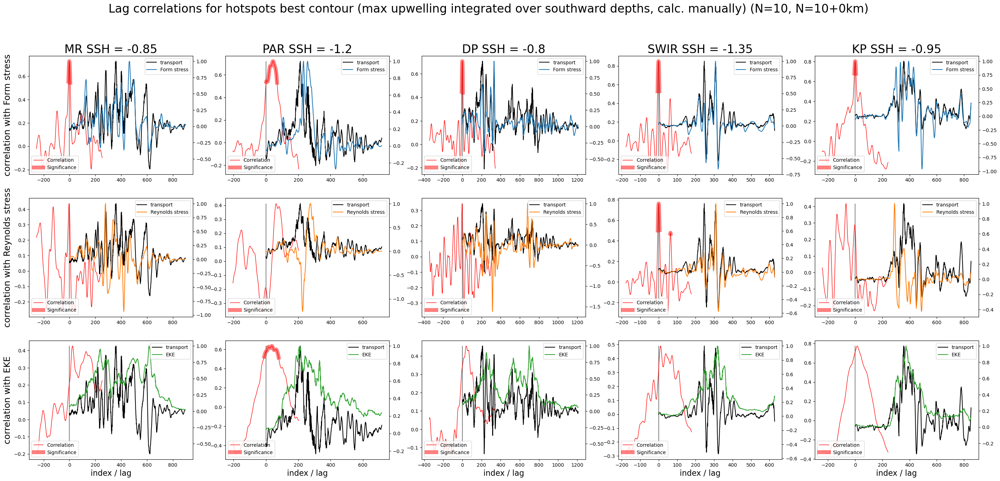

In [27]:
rhoslice = slice(1032.3,1032.5)

fig, axes = plt.subplots(nrows = 3, ncols = 5, figsize = (35,15))
for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    #a,b,c = find_best_contour(hotspot,rhoslice)
    rhoslice = [slice(1030,1032.54),slice(1030,1032.53),slice(1029,1032.51),slice(1031,1032.53),slice(1030,1032.48)][i]
    index = [15,22,14,25,17][i]
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][index]
    # load calculated smoothed quantities and correlations
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E = compute_corr_FRS(hotspot,j_contour,rhoslice)
    # plot
    ax2 = axes[0,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Form_scaled, color = 'C0', label = 'Form stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F,'-r',linewidth=1,label='Correlation')
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F*sig_combined_F,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[0,i].vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
    axes[0,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')
    axes[0,i].set_title(hotspot+' SSH = '+str(contour_dict[j_contour]['SSH']), fontsize = 24)
    
    ax2 = axes[1,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Reynolds_scaled, color = 'C1', label = 'Reynolds stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R,'-r',linewidth=1,label='Correlation')
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R*sig_combined_R,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[1,i].vlines(0,np.min(corr_combined_R),np.max(corr_combined_R), color = 'grey')
    axes[1,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')

    ax2 = axes[2,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(EKE_scaled, color = 'C2', label = 'EKE')
    ax2.spines.right.set_position(("axes", 1))
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E,'-r',linewidth=1,label='Correlation')
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E*sig_combined_E,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[2,i].vlines(0,np.min(corr_combined_E),np.max(corr_combined_E), color = 'grey')
    ax2.legend(loc = 'upper right')
    axes[2,i].legend(loc = 'lower left')

axes[0,0].set_ylabel('correlation with Form stress', fontsize = 18)
axes[1,0].set_ylabel('correlation with Reynolds stress', fontsize = 18)
axes[2,0].set_ylabel('correlation with EKE', fontsize = 18)
axes[2,0].set_xlabel('index / lag', fontsize = 16)
axes[2,1].set_xlabel('index / lag', fontsize = 16)
axes[2,2].set_xlabel('index / lag', fontsize = 16)
axes[2,3].set_xlabel('index / lag', fontsize = 16)
axes[2,4].set_xlabel('index / lag', fontsize = 16)

fig.suptitle('Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)', fontsize = 24)
#plt.savefig('temp.png',dpi = 400)

# 1 yr

3.1062344248021287
9.15955402782217 9.391997545650828
2.4162509722172736
9.471208130010334 9.643766721641098
1.5854774311059134
8.823668705198289 9.099229044523655
2.0607448897533733
19.89099494892606 21.048100046344214
1.1844290236655823
18.93254288031517 19.982209726332766
2.831458076615792
18.88519872779253 21.83782093098778
3.1642678304784058
19.89845948168327 21.668077672702847
1.2472330869305839
22.228382805749593 24.206325235107116
1.6128251536827192
16.282636622953305 16.916663011897253
6.475971897392246
19.69208754644632 20.24606153514905
4.451083374558671
17.515728545848425 18.046519725020723
3.2759263874800095
18.194286023857096 19.377763995584424
1.1810290366012723
15.55674321724931 16.04352527710033
2.1098838708701617
12.81651111608852 13.304284012304665
1.966004131424469
9.687998220689378 10.466640783125056


Text(0.5, 0.98, 'Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)')

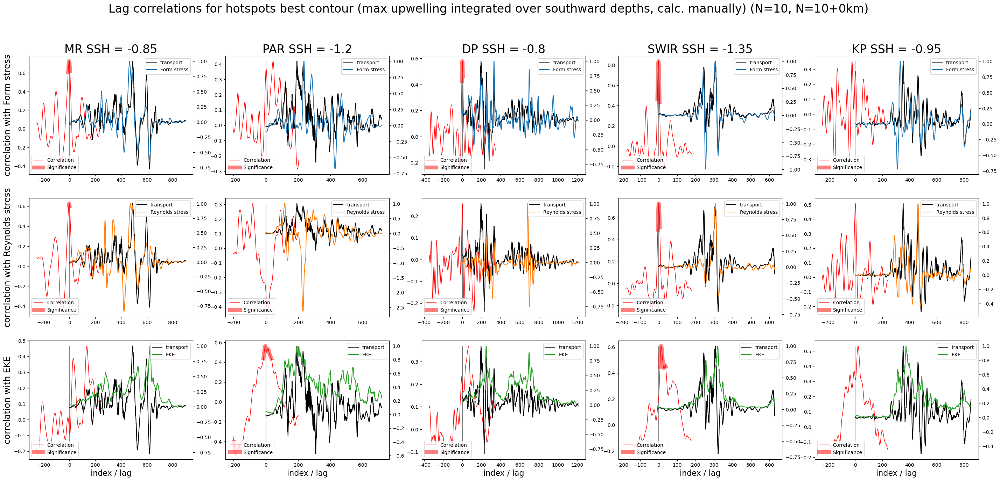

In [20]:
rhoslice = slice(1032.3,1032.5)

fig, axes = plt.subplots(nrows = 3, ncols = 5, figsize = (35,15))
for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    #a,b,c = find_best_contour(hotspot,rhoslice)
    rhoslice = [slice(1030,1032.54),slice(1030,1032.53),slice(1029,1032.51),slice(1031,1032.53),slice(1030,1032.48)][i]
    index = [15,22,14,25,17][i]
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][index]
    # load calculated smoothed quantities and correlations
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E = compute_corr_FRS(hotspot,j_contour,rhoslice)
    # plot
    ax2 = axes[0,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Form_scaled, color = 'C0', label = 'Form stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F,'-r',linewidth=1,label='Correlation')
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F*sig_combined_F,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[0,i].vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
    axes[0,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')
    axes[0,i].set_title(hotspot+' SSH = '+str(contour_dict[j_contour]['SSH']), fontsize = 24)
    
    ax2 = axes[1,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Reynolds_scaled, color = 'C1', label = 'Reynolds stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R,'-r',linewidth=1,label='Correlation')
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R*sig_combined_R,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[1,i].vlines(0,np.min(corr_combined_R),np.max(corr_combined_R), color = 'grey')
    axes[1,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')

    ax2 = axes[2,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(EKE_scaled, color = 'C2', label = 'EKE')
    ax2.spines.right.set_position(("axes", 1))
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E,'-r',linewidth=1,label='Correlation')
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E*sig_combined_E,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[2,i].vlines(0,np.min(corr_combined_E),np.max(corr_combined_E), color = 'grey')
    ax2.legend(loc = 'upper right')
    axes[2,i].legend(loc = 'lower left')

axes[0,0].set_ylabel('correlation with Form stress', fontsize = 18)
axes[1,0].set_ylabel('correlation with Reynolds stress', fontsize = 18)
axes[2,0].set_ylabel('correlation with EKE', fontsize = 18)
axes[2,0].set_xlabel('index / lag', fontsize = 16)
axes[2,1].set_xlabel('index / lag', fontsize = 16)
axes[2,2].set_xlabel('index / lag', fontsize = 16)
axes[2,3].set_xlabel('index / lag', fontsize = 16)
axes[2,4].set_xlabel('index / lag', fontsize = 16)

fig.suptitle('Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)', fontsize = 24)
#plt.savefig('temp.png',dpi = 400)

# smaller density range (1032+)

3.306832567239783
8.559824057188116 9.489064366343918
0.8147684411307925
12.171900399171605 13.085277721411146
1.9852081347530846
7.439630255039478 8.38319455200889
3.8614730846432828
11.608327701737764 12.36546192582847
1.635525542455881
14.314599697759093 15.016981733669898
3.910205784551457
11.68205143867689 12.881717687705803
4.626263041332766
18.21899136688847 20.4680061768196
1.4819642248461227
27.30726124605691 29.99003944670786
3.2488877186614213
15.69522134708026 18.12598271105322
9.475959242168338
27.283881795458992 27.698703434474133
5.100007202072044
27.021725241097823 27.46269153525959
2.9561256879396662
17.42684735648239 18.05687080643476
7.179533297242076
6.137266369150072 6.34019892771191
0.1582716903278477
11.012946334945834 11.220599546685065
3.464378831506603
4.60201867517643 4.755382228412967


Text(0.5, 0.98, 'Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)')

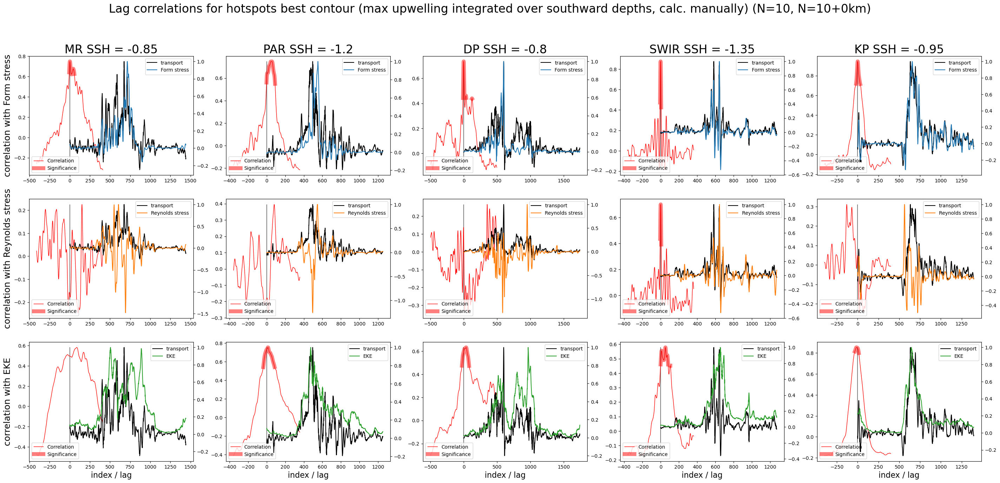

In [29]:
rhoslice = slice(1032,1032.5)

fig, axes = plt.subplots(nrows = 3, ncols = 5, figsize = (35,15))
for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    #a,b,c = find_best_contour(hotspot,rhoslice)
    #rhoslice = [slice(1030,1032.54),slice(1030,1032.53),slice(1029,1032.51),slice(1031,1032.53),slice(1030,1032.48)][i]
    rhoslice = [slice(1032,1032.54),slice(1032,1032.53),slice(1032,1032.51),slice(1032,1032.53),slice(1032,1032.48)][i]
    
    index = [15,22,14,25,17][i]
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][index]
    # load calculated smoothed quantities and correlations
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E = compute_corr_FRS(hotspot,j_contour,rhoslice)
    # plot
    ax2 = axes[0,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Form_scaled, color = 'C0', label = 'Form stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F,'-r',linewidth=1,label='Correlation')
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F*sig_combined_F,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[0,i].vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
    axes[0,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')
    axes[0,i].set_title(hotspot+' SSH = '+str(contour_dict[j_contour]['SSH']), fontsize = 24)
    
    ax2 = axes[1,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Reynolds_scaled, color = 'C1', label = 'Reynolds stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R,'-r',linewidth=1,label='Correlation')
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R*sig_combined_R,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[1,i].vlines(0,np.min(corr_combined_R),np.max(corr_combined_R), color = 'grey')
    axes[1,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')

    ax2 = axes[2,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(EKE_scaled, color = 'C2', label = 'EKE')
    ax2.spines.right.set_position(("axes", 1))
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E,'-r',linewidth=1,label='Correlation')
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E*sig_combined_E,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[2,i].vlines(0,np.min(corr_combined_E),np.max(corr_combined_E), color = 'grey')
    ax2.legend(loc = 'upper right')
    axes[2,i].legend(loc = 'lower left')

axes[0,0].set_ylabel('correlation with Form stress', fontsize = 18)
axes[1,0].set_ylabel('correlation with Reynolds stress', fontsize = 18)
axes[2,0].set_ylabel('correlation with EKE', fontsize = 18)
axes[2,0].set_xlabel('index / lag', fontsize = 16)
axes[2,1].set_xlabel('index / lag', fontsize = 16)
axes[2,2].set_xlabel('index / lag', fontsize = 16)
axes[2,3].set_xlabel('index / lag', fontsize = 16)
axes[2,4].set_xlabel('index / lag', fontsize = 16)

fig.suptitle('Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)', fontsize = 24)
#plt.savefig('temp.png',dpi = 400)

# even smaller density range (1032.2+)

2.147560659242068
5.857518016515212 6.23012188189602
1.0765657500698205
8.604326161880426 9.087176546731154
1.0900023292563528
5.62050171630832 6.1028137295676395
2.9521443383424
7.132092468717136 7.884805514990806
1.3816052810335535
9.708960906057841 10.50193117245549
3.5515243685748974
8.258451686507795 10.234296270926967
3.733363371922808
11.897823452441092 18.804564020516217
0.8242662606609714
18.343964697791844 21.67554326828636
2.1139379483773584
10.894059431900255 12.61063565021505
6.952773455487865
13.669369188947996 14.190489263748493
3.3875042066174674
13.77714838529492 14.319743271746843
2.114598695714422
8.983566326967418 9.888740476877757
3.912012012881867
2.523972801299839 2.566862223516996
0.22939586519689206
5.918848212261504 6.02194052603501
1.3376621196134524
1.9180436491266035 1.948579236985319


Text(0.5, 0.98, 'Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)')

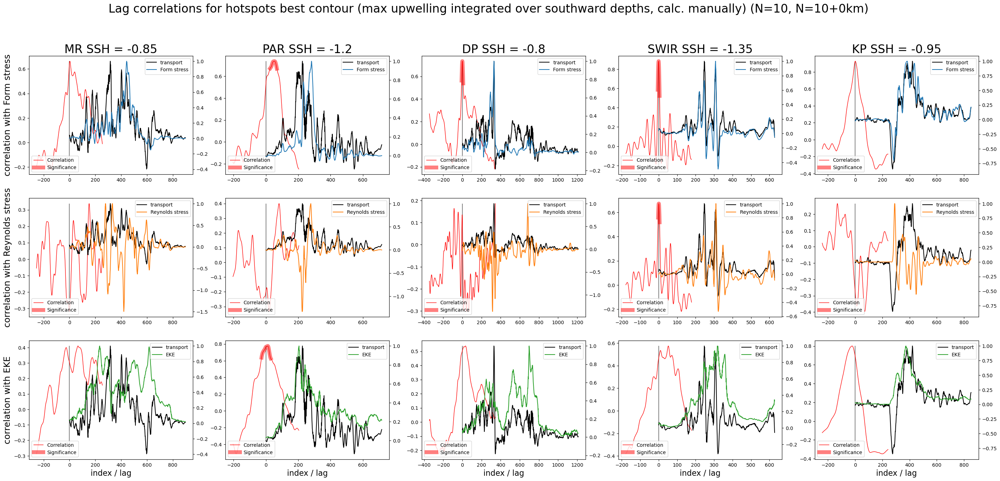

In [22]:
rhoslice = slice(1032.3,1032.5)

fig, axes = plt.subplots(nrows = 3, ncols = 5, figsize = (35,15))
for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    #a,b,c = find_best_contour(hotspot,rhoslice)
    #rhoslice = [slice(1030,1032.54),slice(1030,1032.53),slice(1029,1032.51),slice(1031,1032.53),slice(1030,1032.48)][i]
    rhoslice = [slice(1032.2,1032.54),slice(1032.2,1032.53),slice(1032.2,1032.51),slice(1032.2,1032.53),slice(1032.2,1032.48)][i]
    
    index = [15,22,14,25,17][i]
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][index]
    # load calculated smoothed quantities and correlations
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E = compute_corr_FRS(hotspot,j_contour,rhoslice)
    # plot
    ax2 = axes[0,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Form_scaled, color = 'C0', label = 'Form stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F,'-r',linewidth=1,label='Correlation')
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F*sig_combined_F,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[0,i].vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
    axes[0,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')
    axes[0,i].set_title(hotspot+' SSH = '+str(contour_dict[j_contour]['SSH']), fontsize = 24)
    
    ax2 = axes[1,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Reynolds_scaled, color = 'C1', label = 'Reynolds stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R,'-r',linewidth=1,label='Correlation')
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R*sig_combined_R,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[1,i].vlines(0,np.min(corr_combined_R),np.max(corr_combined_R), color = 'grey')
    axes[1,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')

    ax2 = axes[2,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(EKE_scaled, color = 'C2', label = 'EKE')
    ax2.spines.right.set_position(("axes", 1))
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E,'-r',linewidth=1,label='Correlation')
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E*sig_combined_E,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[2,i].vlines(0,np.min(corr_combined_E),np.max(corr_combined_E), color = 'grey')
    ax2.legend(loc = 'upper right')
    axes[2,i].legend(loc = 'lower left')

axes[0,0].set_ylabel('correlation with Form stress', fontsize = 18)
axes[1,0].set_ylabel('correlation with Reynolds stress', fontsize = 18)
axes[2,0].set_ylabel('correlation with EKE', fontsize = 18)
axes[2,0].set_xlabel('index / lag', fontsize = 16)
axes[2,1].set_xlabel('index / lag', fontsize = 16)
axes[2,2].set_xlabel('index / lag', fontsize = 16)
axes[2,3].set_xlabel('index / lag', fontsize = 16)
axes[2,4].set_xlabel('index / lag', fontsize = 16)

fig.suptitle('Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)', fontsize = 24)
#plt.savefig('temp.png',dpi = 400)

# smaller latitude range

In [23]:
hotspot_dict = OrderedDict([
('PAR',  {'lower_lon':-150,'upper_lon':-100}),
('SWIR',  {'lower_lon':20,'upper_lon':40}),
('DP',  {'lower_lon':-80,'upper_lon':-10}),
('MR',  {'lower_lon':-210,'upper_lon':-180}),
('KP1',  {'lower_lon':70,'upper_lon':80}),
('KP2',{'lower_lon':-280,'upper_lon':-250})])#-260


4.130123644203837
9.200854530657798 11.26195606169074
1.2831160720128023
9.267552029684941 11.467611665622595
1.3111697420459352
7.78835733787659 10.236143721532214
3.0172966964868686
9.355506047360688 13.673743057765801
2.419164701889044
9.46683515429513 12.402237897073057
2.540886432009685
9.08259913939897 10.420126772340076
5.231456891878778
21.691651846545323 24.47185707131491
1.3694146437404273
22.56777048703348 25.665497920057355
2.2273733527901576
16.189965001832164 19.10359536249494
7.052162132602246
8.434656404314136 9.084756790706892
3.253574074044005
8.49173138972733 8.958700056228869
1.2335713355542888
6.30370695076145 6.860924121633444
5.708789781377989
3.8879012815077894 4.160760294653738
0.5693961256367668
4.918352807416466 6.208657333518734
2.3779801191130274
2.695945797959268 2.8681509165445997


Text(0.5, 0.98, 'Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)')

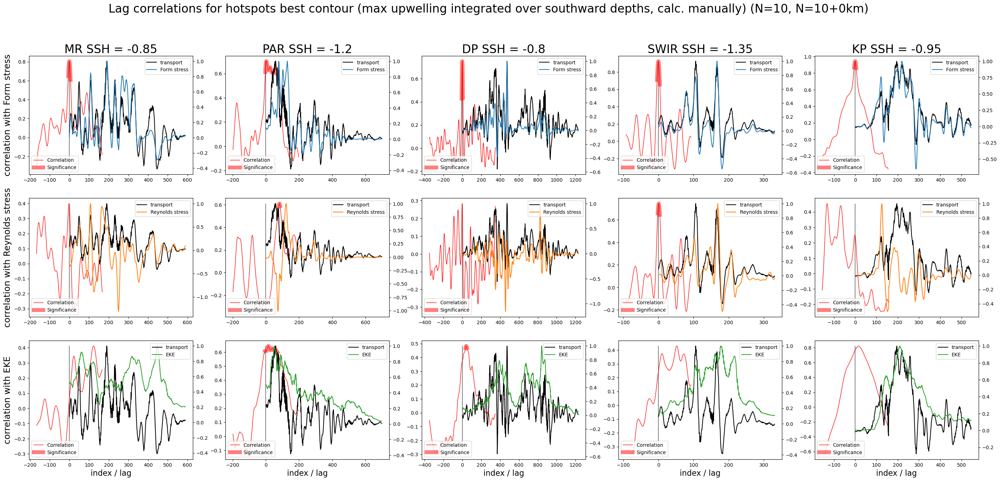

In [24]:
fig, axes = plt.subplots(nrows = 3, ncols = 5, figsize = (35,15))
for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    #a,b,c = find_best_contour(hotspot,rhoslice)
    rhoslice = [slice(1030,1032.54),slice(1030,1032.53),slice(1029,1032.51),slice(1031,1032.53),slice(1030,1032.48)][i]
    index = [15,22,14,25,17][i]
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][index]
    # load calculated smoothed quantities and correlations
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E = compute_corr_FRS(hotspot,j_contour,rhoslice)
    # plot
    ax2 = axes[0,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Form_scaled, color = 'C0', label = 'Form stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F,'-r',linewidth=1,label='Correlation')
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F*sig_combined_F,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[0,i].vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
    axes[0,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')
    axes[0,i].set_title(hotspot+' SSH = '+str(contour_dict[j_contour]['SSH']), fontsize = 24)
    
    ax2 = axes[1,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Reynolds_scaled, color = 'C1', label = 'Reynolds stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R,'-r',linewidth=1,label='Correlation')
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R*sig_combined_R,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[1,i].vlines(0,np.min(corr_combined_R),np.max(corr_combined_R), color = 'grey')
    axes[1,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')

    ax2 = axes[2,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(EKE_scaled, color = 'C2', label = 'EKE')
    ax2.spines.right.set_position(("axes", 1))
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E,'-r',linewidth=1,label='Correlation')
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E*sig_combined_E,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[2,i].vlines(0,np.min(corr_combined_E),np.max(corr_combined_E), color = 'grey')
    ax2.legend(loc = 'upper right')
    axes[2,i].legend(loc = 'lower left')

axes[0,0].set_ylabel('correlation with Form stress', fontsize = 18)
axes[1,0].set_ylabel('correlation with Reynolds stress', fontsize = 18)
axes[2,0].set_ylabel('correlation with EKE', fontsize = 18)
axes[2,0].set_xlabel('index / lag', fontsize = 16)
axes[2,1].set_xlabel('index / lag', fontsize = 16)
axes[2,2].set_xlabel('index / lag', fontsize = 16)
axes[2,3].set_xlabel('index / lag', fontsize = 16)
axes[2,4].set_xlabel('index / lag', fontsize = 16)

fig.suptitle('Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)', fontsize = 24)
#plt.savefig('temp.png',dpi = 400)

# bigger latitude range

In [39]:
hotspot_dict = OrderedDict([
('PAR',  {'lower_lon':-170,'upper_lon':-100}),
('SWIR',  {'lower_lon':0,'upper_lon':60}),
('DP',  {'lower_lon':-80,'upper_lon':10}),
('MR',  {'lower_lon':-230,'upper_lon':-160}),
('KP1',  {'lower_lon':50,'upper_lon':80}),
('KP2',{'lower_lon':-280,'upper_lon':-230})])#-260


6.090858051033765
16.0256154920142 17.052911930088946
1.6152982070129784
16.161074073878282 17.48594417753955
1.8963737771638083
12.76100408122684 13.61668848285866
3.6447667858760058
12.680477742959567 13.20059401119928
1.8049191540748866
13.168908479391082 13.64504539110388
2.9408855026851044
11.92948583381929 12.81739921902233
5.766772082299667
25.010957456325496 27.417909276988823
1.3188039634576965
26.220659491723275 29.061442109835305
2.666052805109056
18.412771478300826 20.675754327814346
9.588360472507029
20.644767333293498 21.091611949139857
4.88368187826018
20.64662960902281 21.122511346635733
2.388597101770077
13.800210404939516 14.556442154621061
8.021321925702932
7.147983536645754 7.310980894567926
0.8104222065263857
9.307104307363039 9.55164196622607
3.3033832529215115
4.600321976173249 4.767534795741318


Text(0.5, 0.98, 'Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)')

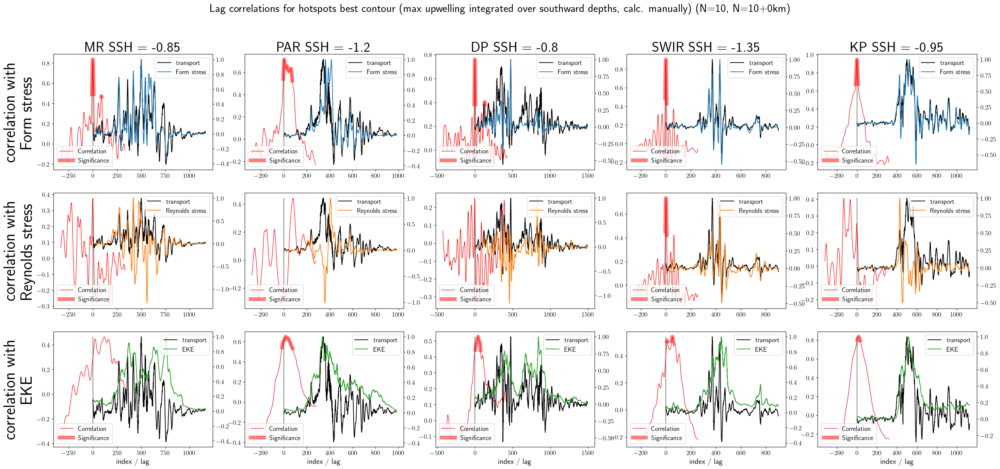

In [44]:
rhoslice = slice(1032.3,1032.5)

fig, axes = plt.subplots(nrows = 3, ncols = 5, figsize = (35,15))
for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    #a,b,c = find_best_contour(hotspot,rhoslice)
    rhoslice = [slice(1030,1032.54),slice(1030,1032.53),slice(1029,1032.51),slice(1031,1032.53),slice(1030,1032.48)][i]
    index = [15,22,14,25,17][i]
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][index]
    # load calculated smoothed quantities and correlations
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E = compute_corr_FRS(hotspot,j_contour,rhoslice)
    # plot
    ax2 = axes[0,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Form_scaled, color = 'C0', label = 'Form stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F,'-r',linewidth=1,label='Correlation')
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F*sig_combined_F,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[0,i].vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
    axes[0,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')
    axes[0,i].set_title(hotspot+' SSH = '+str(contour_dict[j_contour]['SSH']), fontsize = 30)
    
    ax2 = axes[1,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Reynolds_scaled, color = 'C1', label = 'Reynolds stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R,'-r',linewidth=1,label='Correlation')
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R*sig_combined_R,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[1,i].vlines(0,np.min(corr_combined_R),np.max(corr_combined_R), color = 'grey')
    axes[1,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')

    ax2 = axes[2,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(EKE_scaled, color = 'C2', label = 'EKE')
    ax2.spines.right.set_position(("axes", 1))
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E,'-r',linewidth=1,label='Correlation')
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E*sig_combined_E,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[2,i].vlines(0,np.min(corr_combined_E),np.max(corr_combined_E), color = 'grey')
    ax2.legend(loc = 'upper right')
    axes[2,i].legend(loc = 'lower left')

axes[0,0].set_ylabel('correlation with \n Form stress', fontsize = 35)
axes[1,0].set_ylabel('correlation with \n Reynolds stress', fontsize = 35)
axes[2,0].set_ylabel('correlation with \n EKE', fontsize = 35)
axes[2,0].set_xlabel('index / lag', fontsize = 16)
axes[2,1].set_xlabel('index / lag', fontsize = 16)
axes[2,2].set_xlabel('index / lag', fontsize = 16)
axes[2,3].set_xlabel('index / lag', fontsize = 16)
axes[2,4].set_xlabel('index / lag', fontsize = 16)

fig.suptitle('Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)', fontsize = 24)
#plt.savefig('temp.png',dpi = 400)

# even bigger range

In [23]:
hotspot_dict = OrderedDict([
('PAR',  {'lower_lon':-180,'upper_lon':-90}),
('SWIR',  {'lower_lon':-10,'upper_lon':70}),
('DP',  {'lower_lon':-90,'upper_lon':20}),
('MR',  {'lower_lon':-240,'upper_lon':-150}),
('KP1',  {'lower_lon':40,'upper_lon':80}),
('KP2',{'lower_lon':-280,'upper_lon':-220})])#-260


4.485577116423982
13.048122794379838 14.29288791208095
0.47392667328062804
15.58242145285901 17.060460953329674
3.1336506805469275
13.286545206339087 14.892252286307098
3.4193256360266777
12.606528762898371 13.40596939619551
1.7234223441680894
16.50667607420051 17.274218020678383
4.096239200732899
16.235182958007552 19.413465186056342
5.463554525148851
23.94395122012179 26.63451207961861
1.701886422639024
29.5668831018587 32.75981099410967
3.429361663242186
19.82258416528279 22.520914099999896
9.042073195800803
26.079396548705816 26.35483059756948
4.57403498108262
26.105722668450692 26.48116802092675
2.931856122834912
16.803758456012535 17.277303523556274
8.873915340417373
10.336767899514763 10.783114101748362
0.17950413940460336
14.35471484952045 14.793135456245466
3.6276677762769083
10.72683624175939 11.193018498400175


Text(0.5, 0.98, 'Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)')

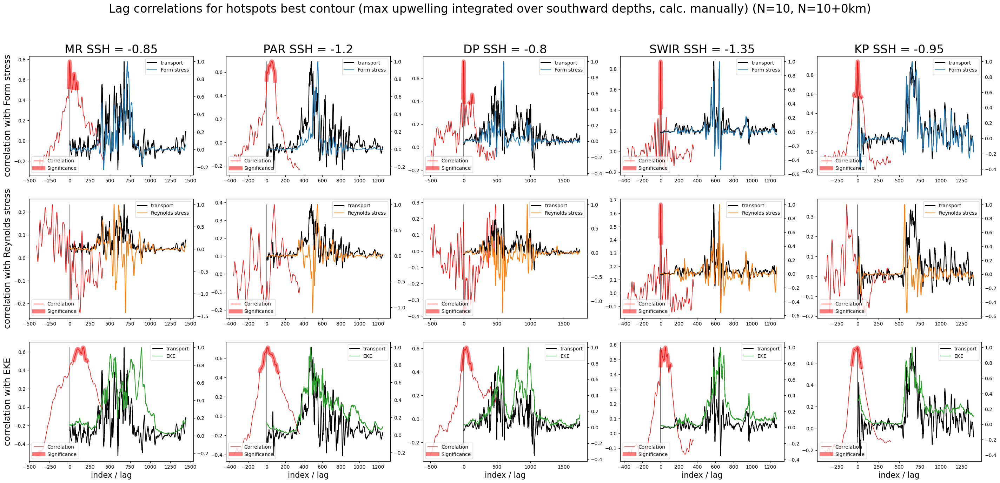

In [24]:
fig, axes = plt.subplots(nrows = 3, ncols = 5, figsize = (35,15))
for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    #a,b,c = find_best_contour(hotspot,rhoslice)
    rhoslice = [slice(1030,1032.54),slice(1030,1032.53),slice(1029,1032.51),slice(1031,1032.53),slice(1030,1032.48)][i]
    index = [15,22,14,25,17][i]
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][index]
    # load calculated smoothed quantities and correlations
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E = compute_corr_FRS(hotspot,j_contour,rhoslice)
    # plot
    ax2 = axes[0,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Form_scaled, color = 'C0', label = 'Form stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F,'-r',linewidth=1,label='Correlation')
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F*sig_combined_F,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[0,i].vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
    axes[0,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')
    axes[0,i].set_title(hotspot+' SSH = '+str(contour_dict[j_contour]['SSH']), fontsize = 24)
    
    ax2 = axes[1,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Reynolds_scaled, color = 'C1', label = 'Reynolds stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R,'-r',linewidth=1,label='Correlation')
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R*sig_combined_R,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[1,i].vlines(0,np.min(corr_combined_R),np.max(corr_combined_R), color = 'grey')
    axes[1,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')

    ax2 = axes[2,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(EKE_scaled, color = 'C2', label = 'EKE')
    ax2.spines.right.set_position(("axes", 1))
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E,'-r',linewidth=1,label='Correlation')
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E*sig_combined_E,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[2,i].vlines(0,np.min(corr_combined_E),np.max(corr_combined_E), color = 'grey')
    ax2.legend(loc = 'upper right')
    axes[2,i].legend(loc = 'lower left')

axes[0,0].set_ylabel('correlation with Form stress', fontsize = 18)
axes[1,0].set_ylabel('correlation with Reynolds stress', fontsize = 18)
axes[2,0].set_ylabel('correlation with EKE', fontsize = 18)
axes[2,0].set_xlabel('index / lag', fontsize = 16)
axes[2,1].set_xlabel('index / lag', fontsize = 16)
axes[2,2].set_xlabel('index / lag', fontsize = 16)
axes[2,3].set_xlabel('index / lag', fontsize = 16)
axes[2,4].set_xlabel('index / lag', fontsize = 16)

fig.suptitle('Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)', fontsize = 24)
#plt.savefig('temp.png',dpi = 400)

# no smoothing on RS or FS:

6.588818381639201
21.55529733922809 23.063907868001888
1.8187337191697828
20.20490771401326 22.28038820342071
1.5049785567174645
10.305215015460025 11.36961289206483
3.7205557388762087
15.651383948036704 16.358868157468773
2.2730647453121344
22.785507436414857 23.797063992124006
2.638052736067047
9.717527592633129 10.809452862805465
6.083796811013721
27.865881370111577 44.457600648895514
1.5314117584073301
29.487766932754962 41.686657804725236
2.2906873848499463
15.911262778695043 17.813343393276448
9.919494593281026
37.80579428098454 38.552073434131685
5.503525018235592
38.46048031645471 39.308800870755476
2.006297776610204
9.976714555187652 10.725898169194044
9.01973332020908
14.81789254558666 15.718560838057108
0.9324735444774641
13.210479664072606 13.410849547291877
2.856223509260442
3.657269669865604 3.815192655359286


Text(0.5, 0.98, 'Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)')

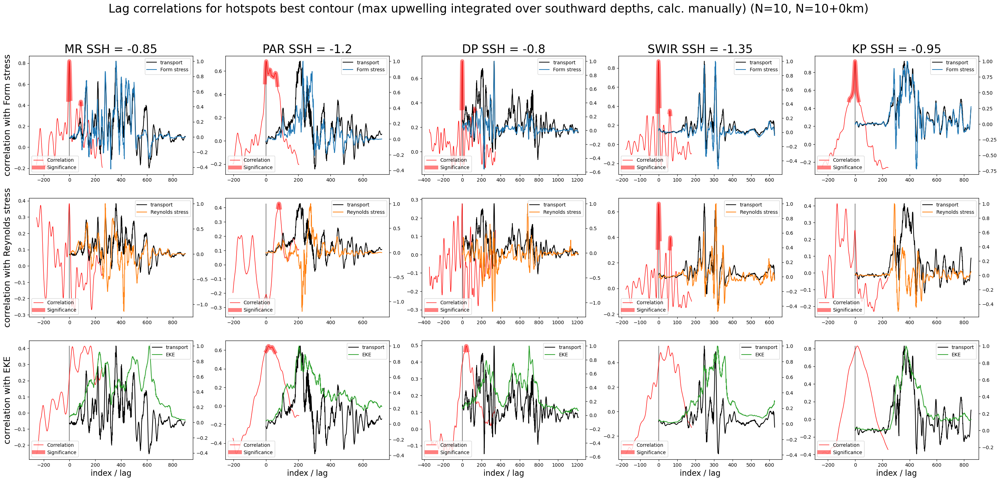

In [23]:
rhoslice = slice(1032.3,1032.5)

fig, axes = plt.subplots(nrows = 3, ncols = 5, figsize = (35,15))
for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    #a,b,c = find_best_contour(hotspot,rhoslice)
    rhoslice = [slice(1030,1032.54),slice(1030,1032.53),slice(1029,1032.51),slice(1031,1032.53),slice(1030,1032.48)][i]
    index = [15,22,14,25,17][i]
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][index]
    # load calculated smoothed quantities and correlations
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E = compute_corr_FRS(hotspot,j_contour,rhoslice)
    # plot
    ax2 = axes[0,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Form_scaled, color = 'C0', label = 'Form stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F,'-r',linewidth=1,label='Correlation')
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F*sig_combined_F,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[0,i].vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
    axes[0,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')
    axes[0,i].set_title(hotspot+' SSH = '+str(contour_dict[j_contour]['SSH']), fontsize = 24)
    
    ax2 = axes[1,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Reynolds_scaled, color = 'C1', label = 'Reynolds stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R,'-r',linewidth=1,label='Correlation')
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R*sig_combined_R,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[1,i].vlines(0,np.min(corr_combined_R),np.max(corr_combined_R), color = 'grey')
    axes[1,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')

    ax2 = axes[2,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(EKE_scaled, color = 'C2', label = 'EKE')
    ax2.spines.right.set_position(("axes", 1))
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E,'-r',linewidth=1,label='Correlation')
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E*sig_combined_E,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[2,i].vlines(0,np.min(corr_combined_E),np.max(corr_combined_E), color = 'grey')
    ax2.legend(loc = 'upper right')
    axes[2,i].legend(loc = 'lower left')

axes[0,0].set_ylabel('correlation with Form stress', fontsize = 18)
axes[1,0].set_ylabel('correlation with Reynolds stress', fontsize = 18)
axes[2,0].set_ylabel('correlation with EKE', fontsize = 18)
axes[2,0].set_xlabel('index / lag', fontsize = 16)
axes[2,1].set_xlabel('index / lag', fontsize = 16)
axes[2,2].set_xlabel('index / lag', fontsize = 16)
axes[2,3].set_xlabel('index / lag', fontsize = 16)
axes[2,4].set_xlabel('index / lag', fontsize = 16)

fig.suptitle('Lag correlations for hotspots best contour (max upwelling integrated over southward depths, calc. manually) (N=10, N=10+0km)', fontsize = 24)
#plt.savefig('temp.png',dpi = 400)

# summary of parameters effect on correlation: 
#### (max upwelling SSH contour, for upwelling densities and same smoothing for upwelling as Reynolds and Form but not for EKE)

- increases with increased distance covered
- increases from top of ocean to 1032+, then decreases correlation (unfortunately 1032 doesn't mean much)
- decreases a little with extra smoothing (but hard to visually see with no smoothing) - but pattern robust (same signifiance except PAR RS becomes significant downstream with no smoothing)
- increases with 10 years rather than 1 or 5

# chosen with max(a+c) with different smoothing

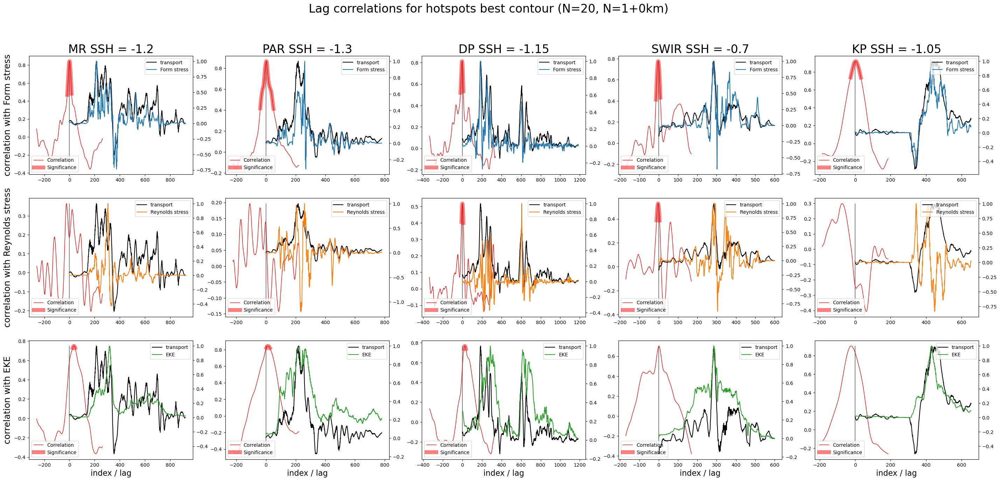

In [22]:
rhoslice = slice(1032.3,1032.5)

fig, axes = plt.subplots(nrows = 3, ncols = 5, figsize = (35,15))
for i in np.arange(5):
    hotspot = ['MR','PAR','DP','SWIR','KP'][i]
    a,b,c = find_best_contour(hotspot,rhoslice)
    index = np.argmax(a+c) #max FS AND EKE correlation
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][index]
    # load calculated smoothed quantities and correlations
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E = compute_corr_FRS(hotspot,j_contour,rhoslice)
    # plot
    ax2 = axes[0,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Form_scaled, color = 'C0', label = 'Form stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F,'-r',linewidth=1,label='Correlation')
    axes[0,i].plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F*sig_combined_F,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[0,i].vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
    axes[0,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')
    axes[0,i].set_title(hotspot+' SSH = '+str(contour_dict[j_contour]['SSH']), fontsize = 24)
    
    ax2 = axes[1,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Reynolds_scaled, color = 'C1', label = 'Reynolds stress')
    ax2.spines.right.set_position(("axes", 1))
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R,'-r',linewidth=1,label='Correlation')
    axes[1,i].plot(np.arange(-(len(corr_combined_R)-1)/2,(len(corr_combined_R)-1)/2+1),corr_combined_R*sig_combined_R,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[1,i].vlines(0,np.min(corr_combined_R),np.max(corr_combined_R), color = 'grey')
    axes[1,i].legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')

    ax2 = axes[2,i].twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(EKE_scaled, color = 'C2', label = 'EKE')
    ax2.spines.right.set_position(("axes", 1))
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E,'-r',linewidth=1,label='Correlation')
    axes[2,i].plot(np.arange(-(len(corr_combined_E)-1)/2,(len(corr_combined_E)-1)/2+1),corr_combined_E*sig_combined_E,color='r',linewidth=8,alpha=0.5,label="Significance")
    axes[2,i].vlines(0,np.min(corr_combined_E),np.max(corr_combined_E), color = 'grey')
    ax2.legend(loc = 'upper right')
    axes[2,i].legend(loc = 'lower left')

axes[0,0].set_ylabel('correlation with Form stress', fontsize = 18)
axes[1,0].set_ylabel('correlation with Reynolds stress', fontsize = 18)
axes[2,0].set_ylabel('correlation with EKE', fontsize = 18)
axes[2,0].set_xlabel('index / lag', fontsize = 16)
axes[2,1].set_xlabel('index / lag', fontsize = 16)
axes[2,2].set_xlabel('index / lag', fontsize = 16)
axes[2,3].set_xlabel('index / lag', fontsize = 16)
axes[2,4].set_xlabel('index / lag', fontsize = 16)

fig.suptitle('Lag correlations for hotspots best contour (N=20, N=1+0km)', fontsize = 24)
plt.savefig('temp.png',dpi = 400)

- a bit weird, EKE lagged nicelybefore. The difference is here is NO smoothing for FS, before I had smoothing 100km and no running mean.

In [119]:
def compute_corr_trans_FS_test(hotspot,j_contour,rhoslice, Form_contour, N_form, N_eddy):
    N=20
    vh_eddy = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/vh_eddy_SO_'+j_contour+'.nc').vh_eddy
    lat_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon.nc').lat_along_contour
    lon_along_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_latlon.nc').lon_along_contour
    # smooth by N running average
    eddy_notcumsum = (vh_eddy).sel(isopycnal_bins=rhoslice).sum('isopycnal_bins')
    y = uniform_filter1d(eddy_notcumsum, size=N_eddy)
    Form_smoothed = uniform_filter1d(Form_contour.sel(isopycnal_bins = rhoslice).sum('isopycnal_bins'), size=N_form)
    # load values at hotpots, scaled by max value
    if hotspot == 'KP':
        lower_index1, upper_index1 = find_lower_upper_indices('KP1', j_contour)
        lower_index2, upper_index2 = find_lower_upper_indices('KP2', j_contour)
        z_hot = np.append(-(y)[lower_index1:upper_index1],-(y)[lower_index2:upper_index2])
        z_scaled = z_hot/np.max(z_hot)
        Form_hot = np.append((Form_smoothed)[lower_index1:upper_index1],(Form_smoothed)[lower_index2:upper_index2])
        Form_scaled = Form_hot/np.max(Form_hot)
    else:
        lower_index, upper_index = find_lower_upper_indices(hotspot, j_contour)
        z_hot = -(y)[lower_index:upper_index]
        z_scaled = z_hot/np.max(z_hot)
        Form_hot = (Form_smoothed)[lower_index:upper_index]
        Form_scaled = Form_hot/np.max(Form_hot)
        
    #compute correlations and combine negative and positive lags
    c_cor = Compute_Correlation(z_scaled, Form_scaled)
    c_cor2 = Compute_Correlation(Form_scaled,z_scaled)
    corr,sig,t,N = c_cor.cor_series()
    corr2,sig2,t2,N2 = c_cor2.cor_series()
    corr_combined_F = np.append(np.flip(corr2[1:]),corr)
    sig_combined_F = np.append(np.flip(sig2[1:]),sig)

    
    return z_scaled, Form_scaled, corr_combined_F, sig_combined_F


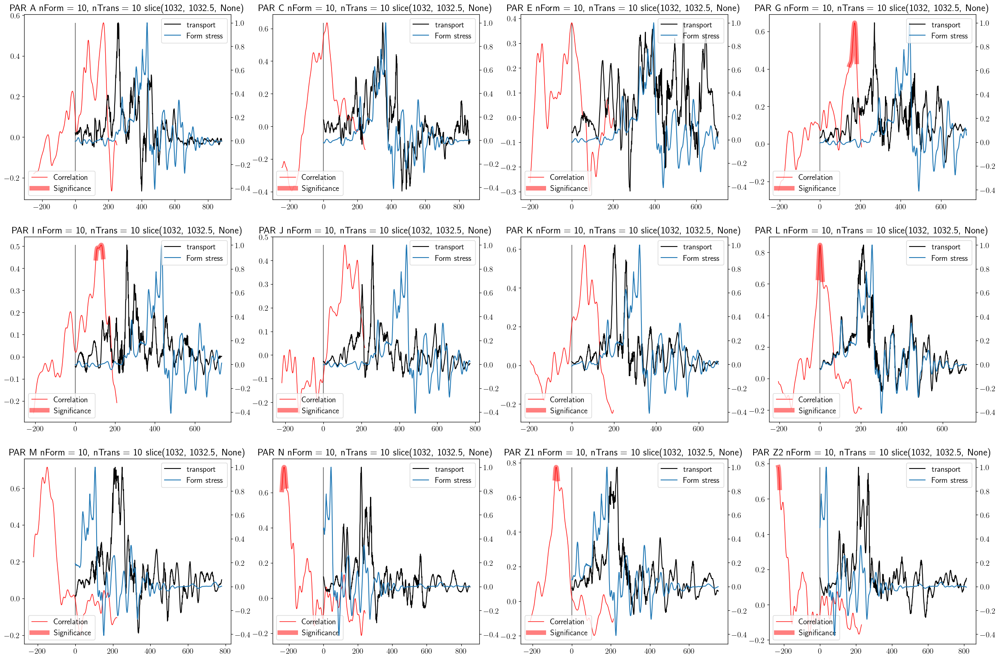

In [124]:
hotspot = 'PAR'
j_contour = 'L'
fig = plt.figure(figsize = (30,20))
Form_contour = xr.open_dataset('/g/data/x77/cy8964/Post_Process/New_SO/SO_'+j_contour+'_contour_energies.nc').Form_contour
rhoslice = slice(1032,1032.5)
for i in np.arange(12):
    j_contour = ['A','C','E','G','I','J','K','L','M','N','Z1','Z2'][i]
    ax = fig.add_subplot(3,4,i+1,)
    z_scaled, Form_scaled, corr_combined_F, sig_combined_F = compute_corr_trans_FS_test(hotspot,j_contour,rhoslice, Form_contour, 10, 10)
    ax2 = ax.twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Form_scaled, color = 'C0', label = 'Form stress')
    ax2.spines.right.set_position(("axes", 1))
    ax.plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F,'-r',linewidth=1,label='Correlation')
    ax.plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F*sig_combined_F,color='r',linewidth=8,alpha=0.5,label="Significance")
    ax.vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
    ax.legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')
    ax.set_title(hotspot+' '+j_contour+' nForm = 10, nTrans = 10 '+str(rhoslice))


### PAR having FS downstream is true everywhere except SSH=-1.25-4 (Z1,M,Z2,N) (where it i upstream) and at L they are co-located

1.4361750512424345
17.733592777432037 19.10194178488162
1.907263265116132
19.017825557958005 20.37157868248335
2.2841926332137223
16.37581530855125 18.21874564505317
1.7270154148778247
13.026570564053033 13.674005222946214
0.7630630597479039
15.871634377461222 16.346914738204976
1.9881061890514684
11.433797110308344 12.395301889250037
1.7825861148097504
11.327724343525903 11.9179767018591
1.1918335203239667
14.2441774564563 14.699659156694056
1.8510367194712323
9.93082261091037 10.819310805252192
1.8393241661237876
10.89864787176378 11.393275159433365
1.3706966882093117
13.68092871810994 13.985427537390308
1.5018680128179611
9.004958524513478 9.956582596359183
2.4852536761081674
6.9407914375595725 7.269939854991226
0.9195360526177182
9.536500191803396 9.95034797381736
1.378413591762606
5.858149058089245 6.523721857912163
2.4552256146944407
8.17666505244921 8.343495964174256
0.5706017999622207
9.794805171990447 10.236617575914543
1.5625874075712483
6.951350786324042 7.434296071987888
1.

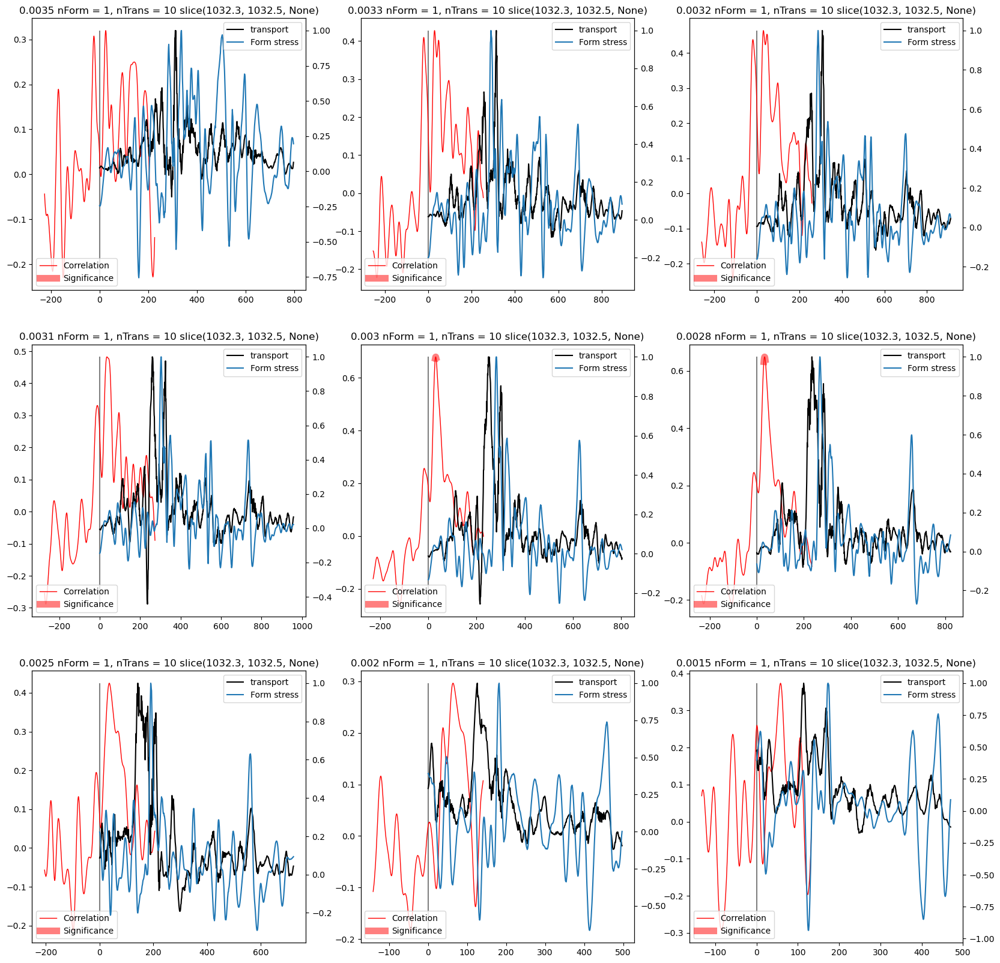

In [32]:
fig = plt.figure(figsize = (20,20))
for i in np.arange(9):
    ax = fig.add_subplot(3,3,i+1,)
    rhoslice = slice(1032.3,1032.5)
    BT = [0.0065,0.006,0.0055,0.005,0.0045,0.004,0.0035,0.0033,0.0032,0.0031,
          0.003,0.0028,0.0025,0.002,0.0015,0.001,0.0005][i+6]
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E= compute_corr_PAR_phiBT(BT,rhoslice)
    ax2 = ax.twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Form_scaled, color = 'C0', label = 'Form stress')
    ax2.spines.right.set_position(("axes", 1))
    ax.plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F,'-r',linewidth=1,label='Correlation')
    ax.plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F*sig_combined_F,color='r',linewidth=8,alpha=0.5,label="Significance")
    ax.vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
    ax.legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')
    ax.set_title(str(BT)+' nForm = 1, nTrans = 10 '+str(rhoslice))


3.871594071610111
10.564515725041515 11.33322891004761
2.137898099709484
14.907725762819995 16.258408042562312
2.3866209066732043
10.900606184577564 12.37836640482854
2.8229244428601525
7.156921084420429 7.524927651295735
2.4813687943662988
9.400922024445647 9.788433867357433
1.642155656375479
6.728735358052138 7.671250195952618
3.276650761473234
6.898751554860594 7.504514911000222
2.380762642303519
7.9397619426723365 8.479447536320215
2.110209925293556
6.500906234033578 7.476859061210585
3.3195479549460267
7.491277314809209 8.259259736707868
1.8012259659758492
8.675715299184299 9.405001982766095
3.3462441266475635
7.549253726106547 8.768863389980963
2.97107721707391
6.723263251641517 7.186047923830226
1.4563599198501247
8.79649836796952 9.306291371370467
3.0434325806223237
7.057719075717949 8.391421997457792
4.751766973257252
4.320074801466229 4.703228403131961
0.5707868283518522
7.497164882438714 8.262144754904684
2.7017475185148774
4.265175401926019 4.9336390180813945
6.259108361977

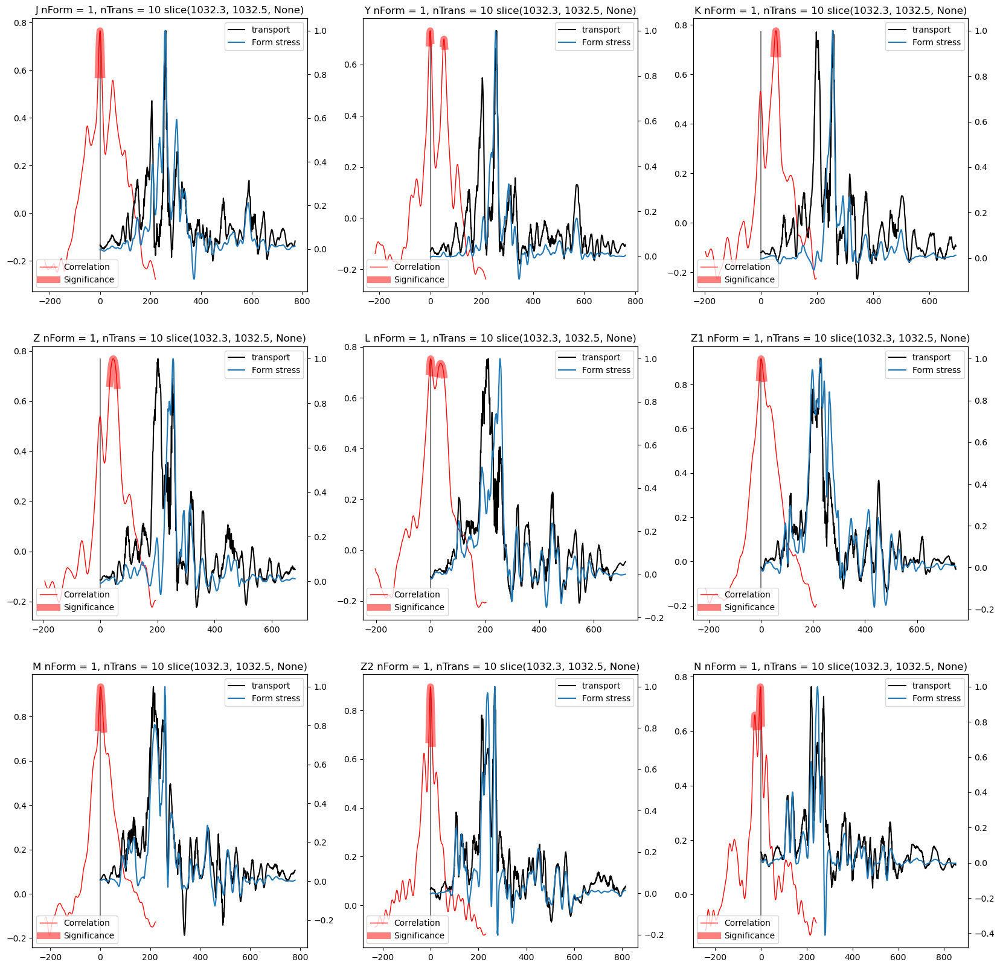

In [34]:
fig = plt.figure(figsize = (20,20))
for i in np.arange(9):
    ax = fig.add_subplot(3,3,i+1,)
    rhoslice = slice(1032.3,1032.5)
    j_contour = ['A','P','B','Q','C','R','D','S','E','T','F','U','G','V','H','W','I','X','J','Y',
                              'K','Z','L','Z1','M','Z2','N','Z3','O','Z4','Z5','Z6','Z7','Z8','Z9'][i+18]
    # load calculated smoothed quantities and correlations
    hotspot = 'PAR'
    z_scaled, Form_scaled, Reynolds_scaled, EKE_scaled, corr_combined_F, sig_combined_F, corr_combined_R, sig_combined_R, corr_combined_E, sig_combined_E, distance_h, distance_corr = compute_corr_FRS(hotspot,j_contour,rhoslice)
    ax2 = ax.twinx()
    ax2.plot(z_scaled, color = 'k', label = 'transport')
    ax2.plot(Form_scaled, color = 'C0', label = 'Form stress')
    ax2.spines.right.set_position(("axes", 1))
    ax.plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F,'-r',linewidth=1,label='Correlation')
    ax.plot(np.arange(-(len(corr_combined_F)-1)/2,(len(corr_combined_F)-1)/2+1),corr_combined_F*sig_combined_F,color='r',linewidth=8,alpha=0.5,label="Significance")
    ax.vlines(0,np.min(corr_combined_F),np.max(corr_combined_F), color = 'grey')
    ax.legend(loc = 'lower left')
    ax2.legend(loc = 'upper right')
    ax.set_title(j_contour+' nForm = 1, nTrans = 10 '+str(rhoslice))
